# Conditional variational autoencoder (using the VAE class)

# SETUP

In [1]:
!python --version


Python 3.6.7


# CVAE

generative process

2dimention data

c=f(ut,s(t-1))

st~p(st|ut, s(t-1))=N(c , sigma)

ot~p(ot|st)=N(st,sigma)

それぞれの分散共分散行列には対角行列を使用（制御がめんどそうだから

In [50]:
from __future__ import print_function
import torch
import torch.utils.data
from torch import nn, optim
from torch.nn import functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
from tensorboardX import SummaryWriter
import numpy as np
import pandas as pd

from tqdm import tqdm

batch_size = 128
epochs =600#10
seed = 1#3
torch.manual_seed(seed)

if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"

In [51]:
root = '../data'
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Lambda(lambd=lambda o: o.view(-1))])
kwargs = {'batch_size': batch_size, 'num_workers': 1, 'pin_memory': True}

# train_loader = torch.utils.data.DataLoader(
#     datasets.MNIST(root=root, train=True, transform=transform, download=True),
#     shuffle=True, **kwargs)
# test_loader = torch.utils.data.DataLoader(
#     datasets.MNIST(root=root, train=False, transform=transform),
#     shuffle=False, **kwargs)

In [52]:
from pixyz.distributions import Normal, Bernoulli
from pixyz.losses import KullbackLeibler
from pixyz.models import VAE

In [53]:
#function for generate data
import torch.distributions as dist

def origin_datagenerator(sample_num,dsigma,axis):
  ca_axis=[-3,-2]
  cb_axis=[3,3]
  cc_axis=[7,5]
  
  data_cso={}
  
  ones=torch.ones(int(sample_num/3))
  
  sample_ca = torch.stack([ones*axis[0][0],ones*axis[0][1]],1)
  sample_cb = torch.stack([ones*axis[1][0],ones*axis[1][1]],1)
  sample_cc = torch.stack([ones*axis[2][0],ones*axis[2][1]],1)
  data_cso.update({"c":torch.cat([sample_ca,sample_cb,sample_cc],dim=0)})
  data_cso.update({"s":dist.Normal(data_cso["c"],dsigma).sample()})
  data_cso.update({"o":dist.Normal(data_cso["s"],dsigma).sample()})
#   data_cso.update([ ("c",torch.cat([sample_ca,sample_cb,sample_cc],dim=0)), ("s",dist.Normal(data_cso["c"],dsigma).sample()) ])
  
  return data_cso
  
#正規化(data,min,max)(minとmaxは与えなくてもいい)min-max normalize
def normalize(data,*args):
    if len(args) == 0:
        min_data = torch.min(data)
        data = data + (abs(min_data) if min_data < 0 else 0)
        max_data = torch.max(data)
        data=data/max_data
    else :
        min_data = abs(args[0]) if args[0] < 0 else 0
        data = data + min_data
        data=data/(args[1] + min_data)
    return data

#正負を残したもの※sliceすると参照渡しにならずcloneが作られるのでreturnしたものを代入が必要
def normalize(data, *args):
    if len(args) == 0:
        max_data = torch.max(abs(data))
        data=data/max_data
    else :
        max_data=torch.max(abs(torch.tensor(args)))
        data=data/max_data
    return data

# catで繋げたものをまるごとnormalizeする用#参照渡しなのでreturnを代入しなくてよい
def full_normalize(data):#行列計算した方が早いと思うけどめんどい
    data_num = len(data[0])
    for i in range(data_num):
        data[:,i]=normalize(data[:,i])
    return data

def unique_datagenerator(sample_num,dsigma,dt,*fragvr):
    data_cso={}
    
    #st-1 [-100:100],[-pi:pi]の範囲で座標(axis)と角度(theta)をサンプリング
    sample_axis = torch.FloatTensor(sample_num,2).uniform_(-100,100)
    sample_theta = torch.FloatTensor(sample_num).uniform_(-np.pi,np.pi)
    st1 = torch.cat([sample_axis,sample_theta.view(sample_num,1)],dim=1)
    
    #ut それぞれ[1.0:5.0] , [-pi/6:pi/6]の範囲でv(velocity),r(steer)をサンプリング 
    if len(fragvr) == 0:
        vt = torch.FloatTensor(sample_num).uniform_(1.0,5.0)
        rt = torch.FloatTensor(sample_num).uniform_(-np.pi/6.0,np.pi/6.0)
        dt = dt#とりあえず移動時間は固定
        ut=torch.cat([vt.view(sample_num,1),rt.view(sample_num,1)],dim=1)
    else :#utを自分で決めたいとき用(fragv,fragr)に設定
        vt = torch.ones(sample_num)*fragvr[0]
        rt = torch.ones(sample_num)*fragvr[1]
        dt = dt
        ut=torch.cat([vt.view(sample_num,1),rt.view(sample_num,1)],dim=1)
        
    #Motion model
    dx = vt*torch.cos(rt*dt)*dt
    dy = vt*torch.sin(rt*dt)*dt
    dr = rt*dt
    
    delta = torch.cat([dx.view(sample_num,1),dy.view(sample_num,1)],dim=1)
    delta = torch.cat([delta,dr.view(sample_num,1)],dim=1)
    sample_c = st1+delta

    data_cso.update({"st1":st1})#t-1時刻の位置(x,y,yaw(rad))
    data_cso.update({"u":ut})#制御(v(m/s),r(rad/s))
    data_cso.update({"c":sample_c})#動作モデルを通したs(分散なし)
    data_cso.update({"s":dist.Normal(data_cso["c"],dsigma).sample()})#真の位置(分散を通している)
    data_cso.update({"o":dist.Normal(data_cso["s"],dsigma).sample()})#計測値（stと同じ位置だが，分散が載っている

    return data_cso

In [54]:
sample_num=3000
ssigma=torch.Tensor([0.5,0.5,0.3]*sample_num).view(sample_num,3)#状態遷移時の分散
osigma=torch.Tensor([0.5,0.5,0.3]*sample_num).view(sample_num,3)#計測情報の分散

axis=[[-3,-2],[3,3],[7,5]]#originalの場合の点の指定

max_data=100.0
min_data=-100.0

data=unique_datagenerator(sample_num,ssigma,1.0)
test_data=unique_datagenerator(sample_num,ssigma,1.0)

print(data)
full_normalize(data["u"])
full_normalize(data["st1"])
full_normalize(data["o"])
full_normalize(test_data["u"])
full_normalize(test_data["st1"])
full_normalize(test_data["o"])

print(data)

train = torch.utils.data.TensorDataset(data["o"], data["c"],data["st1"],data["u"])
train_loader = torch.utils.data.DataLoader(train, shuffle=False,**kwargs)
test = torch.utils.data.TensorDataset(test_data["o"], test_data["c"],test_data["st1"],test_data["u"])
test_loader = torch.utils.data.DataLoader(test, shuffle=False,**kwargs)

{'st1': tensor([[ 51.5263, -44.1378,  -2.3117],
        [-19.3861,  46.9369,  -0.6472],
        [-94.1437,  59.9717,  -1.9788],
        ...,
        [  4.4020,  12.9733,   1.4433],
        [-73.9792,  60.9761,  -1.8862],
        [-10.7347, -80.5281,   1.0960]]), 'u': tensor([[ 4.5631, -0.1703],
        [ 1.6852,  0.1203],
        [ 3.8479,  0.2593],
        ...,
        [ 2.0018, -0.0468],
        [ 4.5957,  0.2360],
        [ 4.7491, -0.3901]]), 'c': tensor([[ 56.0234, -44.9111,  -2.4820],
        [-17.7132,  47.1392,  -0.5268],
        [-90.4244,  60.9584,  -1.7195],
        ...,
        [  6.4016,  12.8797,   1.3965],
        [-69.5109,  62.0507,  -1.6502],
        [ -6.3424, -82.3341,   0.7059]]), 's': tensor([[ 56.4106, -44.7785,  -2.5132],
        [-18.2474,  47.0120,  -0.3067],
        [-91.5102,  61.0101,  -1.6360],
        ...,
        [  7.3643,  12.9104,   2.0802],
        [-70.1704,  62.5581,  -1.4990],
        [ -5.9923, -81.7648,   0.4187]]), 'o': tensor([[ 56.9627, -45.3

In [55]:
# print(data["u"])
# da=normalize(data["u"][:,0])
# print(da)
# fn=full_normalize(data["u"])
# print(fn)
# print(torch.max(fn[:,0]))
# print(torch.max(fn[:,1]))

In [56]:
o_dim = 3
st1_dim = 3
u_dim = 2
s_dim = 3

#before dimention 4 (7/2)
# inference model q(z|x,y)
class Inference(Normal):
    def __init__(self):
        super(Inference, self).__init__(cond_var=["o","st1","u"], var=["s"], name="q")

        self.fc1 = nn.Linear(o_dim+st1_dim+u_dim, 16)
        self.fc2 = nn.Linear(16, 16)
        self.fc31 = nn.Linear(16, s_dim)
        self.fc32 = nn.Linear(16, s_dim)

    def forward(self, o, st1, u):
        h = F.relu(self.fc1( torch.cat([o,st1,u],1) ))
        h = F.relu(self.fc2(h))        
        return {"loc": self.fc31(h), "scale": F.softplus(self.fc32(h))}

class Generator2(Normal):
    def __init__(self):
        super().__init__(cond_var=["s"], var=["o"], name="p")

        self.fc1 = nn.Linear(s_dim, 32)
        self.fc2 = nn.Linear(32, 32)
        self.fc3 = nn.Linear(32, o_dim)

    def forward(self, s):
#         print(s)
#         print(s.shape)
        h = F.relu(self.fc1(s))
        h = F.relu(self.fc2(h))
        return {"loc": self.fc3(h),"scale":0.3}

# prior = Normal(loc=loc, scale=scale, cond_var=["c"],var=["s"], dim=s_dim, name="p_prior")

In [57]:
# prior model p(z|c)
class prior_set(Normal):
    def forward(self, c):
        return{"loc":c, "scale":torch.tensor([0.5,0.5,0.3]).to(device)}
      
prior = prior_set(cond_var=["c"],var=["s"], dim=s_dim, name="p_prior")
print(prior)

Distribution:
  p_prior(s|c) (Normal)
Network architecture:
  prior_set()


In [58]:
p = Generator2()
q = Inference()

p.to(device)
q.to(device)

print(p)
print(q)

Distribution:
  p(o|s) (Normal)
Network architecture:
  Generator2(
    (fc1): Linear(in_features=3, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=32, bias=True)
    (fc3): Linear(in_features=32, out_features=3, bias=True)
  )
Distribution:
  q(s|o,st1,u) (Normal)
Network architecture:
  Inference(
    (fc1): Linear(in_features=8, out_features=16, bias=True)
    (fc2): Linear(in_features=16, out_features=16, bias=True)
    (fc31): Linear(in_features=16, out_features=3, bias=True)
    (fc32): Linear(in_features=16, out_features=3, bias=True)
  )


In [59]:
kl = KullbackLeibler(q, prior)
print(kl)

KL[q(s|o,st1,u)||p_prior(s|c)]


In [60]:
model = VAE(q, p, regularizer=kl, optimizer=optim.Adam, optimizer_params={"lr":1e-3})
print(model)

Distributions (for training): 
  q(s|o,st1,u), p(o|s) 
Loss function: 
  mean(-E_q(s|o,st1,u)[log p(o|s)] + KL[q(s|o,st1,u)||p_prior(s|c)]) 
Optimizer: 
  Adam (
  Parameter Group 0
      amsgrad: False
      betas: (0.9, 0.999)
      eps: 1e-08
      lr: 0.001
      weight_decay: 0
  )


In [61]:
def train(epoch):
    train_loss = 0
    for o,c,st1,u in tqdm(train_loader):
        o = o.to(device)
        c = c.to(device)
        st1=st1.to(device)
        u=u.to(device)
#         print(o.size())
#         print(c.size())
#         print(o)
        loss = model.train({"o": o, "c": c, "st1":st1, "u":u})
        train_loss += loss
        
#     print(kl.gauss_gauss_kl(, scale1, loc2, scale2, dim=None))
    train_loss = train_loss * train_loader.batch_size / len(data["c"])
    print('Epoch: {} Train loss: {:.4f}'.format(epoch, train_loss))
    return train_loss

In [62]:
# print(train_loader.batch_size)
# print(len(train_loader))
# print(dc)

In [63]:
def test(epoch):
    test_loss = 0
    for o, c ,st1,u in test_loader:
        o = o.to(device)
        c = c.to(device)
        st1=st1.to(device)
        u=u.to(device)
        loss = model.test({"o": o, "c": c,"st1":st1,"u":u})
        test_loss += loss
        

    test_loss = test_loss * test_loader.batch_size / len(test_data["c"])
    print('Test loss: {:.4f}'.format(test_loss))
    return test_loss

In [64]:
# model.test({"o":do[0].unsqueeze(0).to(device),"c":dc[0].unsqueeze(0).to(device)})
# q.sample("o":do[0],"c":dc[0], return_all=False)

In [65]:
def plot_reconstrunction(o, c, st1, u):
    with torch.no_grad():
        s = q.sample({"o": o, "c": c,"st1":st1,"u":u}, return_all=False)
        s.update({"c": c})
        recon_batch = p.sample_mean(s).view(-1, 1, 28, 28)
    
        recon = torch.cat([o.view(-1, 1, 28, 28), recon_batch]).cpu()
        return recon
    
def plot_image_from_latent(s, c):
    with torch.no_grad():
        sample = p.sample_mean({"s": s, "c": c}).view(-1, 1, 28, 28).cpu()
        return sample
    
def plot_reconstrunction_changing_y(o, c):
    c_change = torch.eye(10)[range(7)].to(device)
    batch_dummy = torch.ones(o.size(0))[:, None].to(device)    
    recon_all = []
    
    with torch.no_grad():
        for _c in c_change:
            s = q.sample({"o": o, "c": c}, return_all=False)
            s.update({"c": batch_dummy * _c[None,:]})
            recon_batch = p.sample_mean(s).view(-1, 1, 28, 28)
            recon_all.append(recon_batch)
    
        recon_changing_c = torch.cat(recon_all)
        recon_changing_c = torch.cat([o.view(-1, 1, 28, 28), recon_changing_c]).cpu()
        return recon_changing_c

In [66]:
#prepare for plot
import matplotlib.animation as animation
import matplotlib.pyplot as plt
from matplotlib import rc
from IPython.display import HTML
history = {"train_loss":[],"test_loss":[]}

ims=[]#animation variable
grid_inter=50.0

# plt.xticks(np.arange(-2,6,1.0))

100%|██████████| 24/24 [00:01<00:00, 16.42it/s]

Epoch: 1 Train loss: 13743.0371


Test loss: 13425.3721


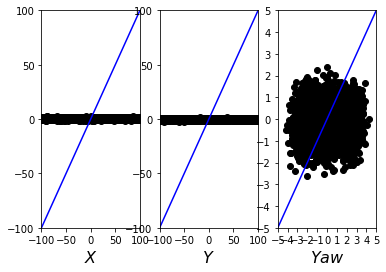

100%|██████████| 24/24 [00:00<00:00, 35.15it/s]

Epoch: 2 Train loss: 13719.0215


Test loss: 13395.6143


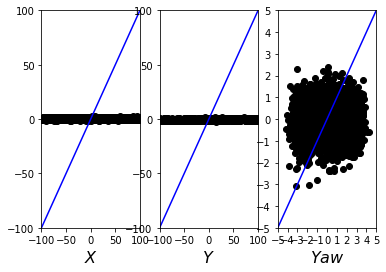

100%|██████████| 24/24 [00:01<00:00, 16.38it/s]

Epoch: 3 Train loss: 13678.6084


Test loss: 13342.7197


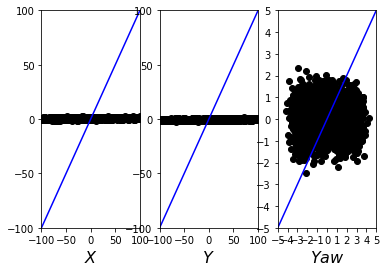

100%|██████████| 24/24 [00:01<00:00, 17.34it/s]

Epoch: 4 Train loss: 13606.9893


Test loss: 13249.9932


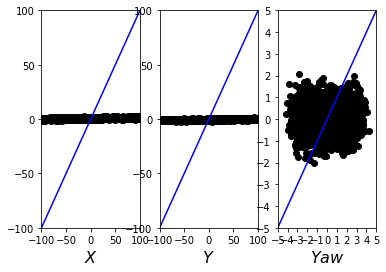

100%|██████████| 24/24 [00:01<00:00, 22.69it/s]

Epoch: 5 Train loss: 13483.9062


Test loss: 13094.5371


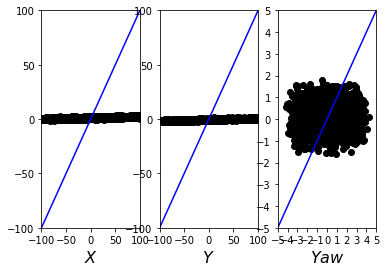

100%|██████████| 24/24 [00:01<00:00, 20.36it/s]

Epoch: 6 Train loss: 13286.8809


Test loss: 12857.1357


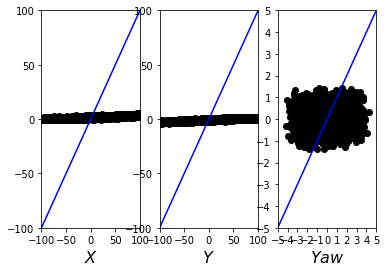

100%|██████████| 24/24 [00:00<00:00, 27.88it/s]


Epoch: 7 Train loss: 12995.4053
Test loss: 12515.6973


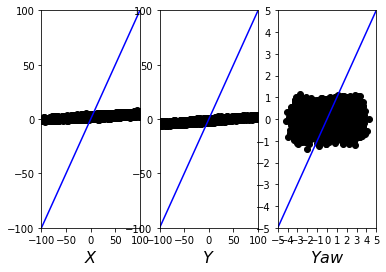

100%|██████████| 24/24 [00:00<00:00, 27.01it/s]

Epoch: 8 Train loss: 12588.0508


Test loss: 12052.8184


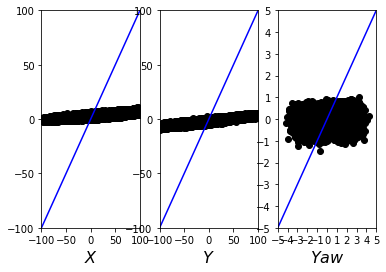

100%|██████████| 24/24 [00:05<00:00,  4.37it/s]

Epoch: 9 Train loss: 12051.0947


Test loss: 11459.7559


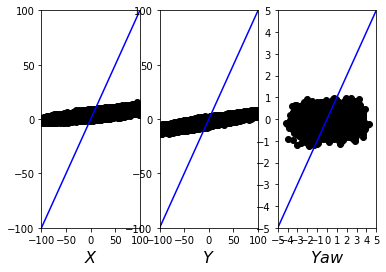

100%|██████████| 24/24 [00:00<00:00, 43.25it/s]

Epoch: 10 Train loss: 11381.7725


Test loss: 10741.7129


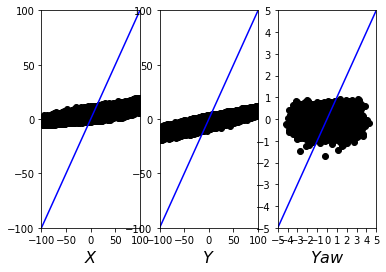

100%|██████████| 24/24 [00:00<00:00, 55.68it/s]

Epoch: 11 Train loss: 10592.7158


Test loss: 9919.0332


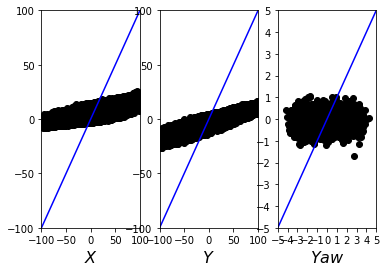

100%|██████████| 24/24 [00:00<00:00, 48.44it/s]

Epoch: 12 Train loss: 9711.9209


Test loss: 9025.9258


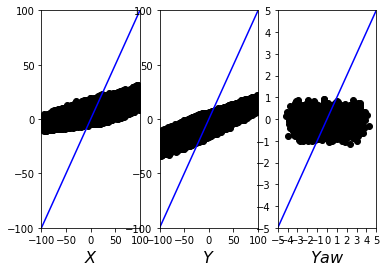

100%|██████████| 24/24 [00:01<00:00, 21.39it/s]

Epoch: 13 Train loss: 8777.9150


Test loss: 8099.3545


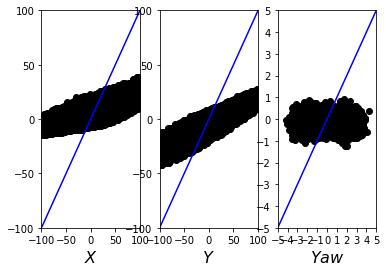

100%|██████████| 24/24 [00:01<00:00, 22.67it/s]

Epoch: 14 Train loss: 7820.6953


Test loss: 7163.5786


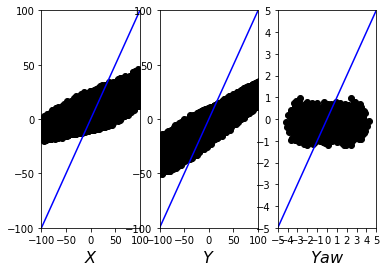

100%|██████████| 24/24 [00:00<00:00, 24.78it/s]

Epoch: 15 Train loss: 6874.6699


Test loss: 6258.7900


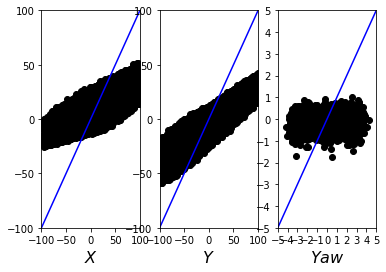

100%|██████████| 24/24 [00:01<00:00, 17.27it/s]

Epoch: 16 Train loss: 5971.7847


Test loss: 5403.9224


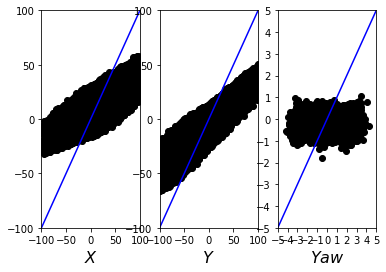

100%|██████████| 24/24 [00:01<00:00, 15.59it/s]

Epoch: 17 Train loss: 5124.9604


Test loss: 4604.2295


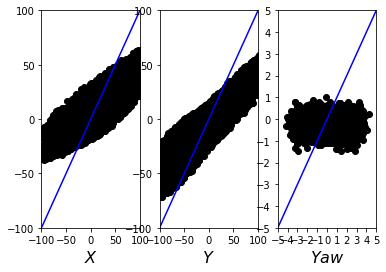

100%|██████████| 24/24 [00:01<00:00, 17.95it/s]

Epoch: 18 Train loss: 4333.7485


Test loss: 3854.2776


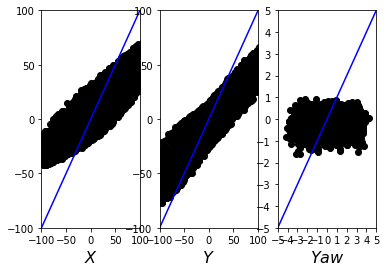

100%|██████████| 24/24 [00:00<00:00, 50.81it/s]

Epoch: 19 Train loss: 3590.4443


Test loss: 3147.7488


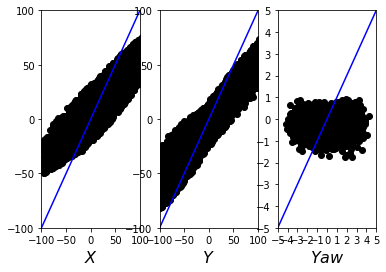

100%|██████████| 24/24 [00:00<00:00, 52.53it/s]

Epoch: 20 Train loss: 2893.6174


Test loss: 2490.6775


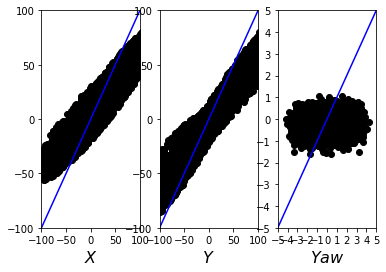

100%|██████████| 24/24 [00:01<00:00, 12.66it/s]

Epoch: 21 Train loss: 2255.6960


Test loss: 1901.5024


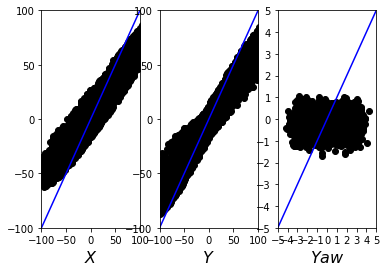

100%|██████████| 24/24 [00:00<00:00, 35.33it/s]

Epoch: 22 Train loss: 1697.5900


Test loss: 1402.3805


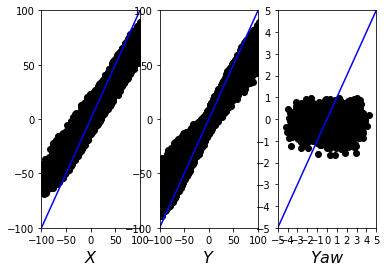

100%|██████████| 24/24 [00:00<00:00, 37.85it/s]

Epoch: 23 Train loss: 1239.2358


Test loss: 1009.0826


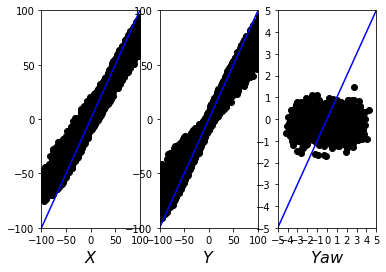

100%|██████████| 24/24 [00:01<00:00, 15.44it/s]

Epoch: 24 Train loss: 890.6225


Test loss: 724.1268


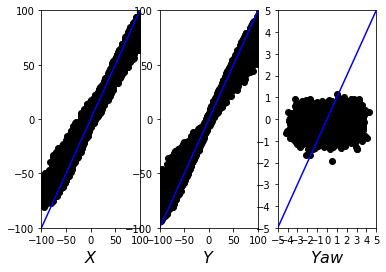

100%|██████████| 24/24 [00:00<00:00, 35.21it/s]

Epoch: 25 Train loss: 646.9755


Test loss: 534.8148


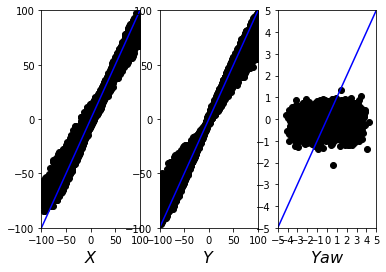

100%|██████████| 24/24 [00:00<00:00, 34.68it/s]

Epoch: 26 Train loss: 489.8801


Test loss: 417.9305


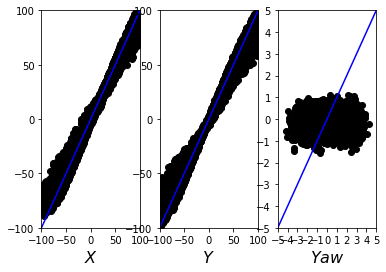

100%|██████████| 24/24 [00:00<00:00, 35.24it/s]

Epoch: 27 Train loss: 394.4160


Test loss: 348.6081


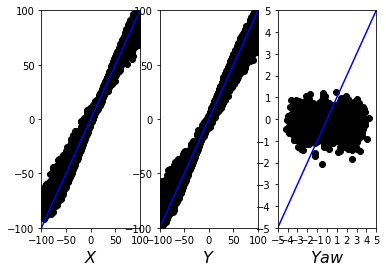

100%|██████████| 24/24 [00:00<00:00, 18.18it/s]

Epoch: 28 Train loss: 337.1844


Test loss: 306.6014


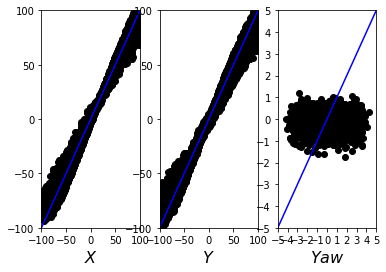

100%|██████████| 24/24 [00:01<00:00, 23.46it/s]

Epoch: 29 Train loss: 301.0503


Test loss: 278.7636


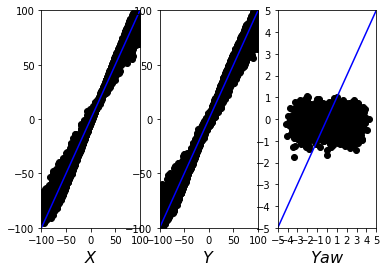

100%|██████████| 24/24 [00:01<00:00, 14.66it/s]

Epoch: 30 Train loss: 275.6285


Test loss: 257.9002


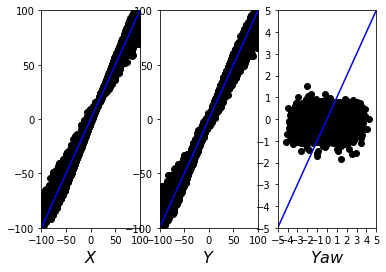

100%|██████████| 24/24 [00:01<00:00, 19.63it/s]

Epoch: 31 Train loss: 255.7288


Test loss: 240.7424


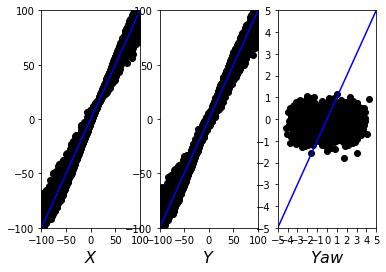

100%|██████████| 24/24 [00:00<00:00, 14.76it/s]

Epoch: 32 Train loss: 238.9739


Test loss: 225.8937


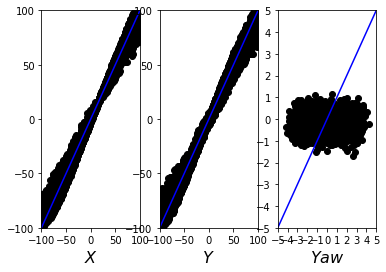

100%|██████████| 24/24 [00:00<00:00, 33.55it/s]


Epoch: 33 Train loss: 224.4277
Test loss: 212.9086


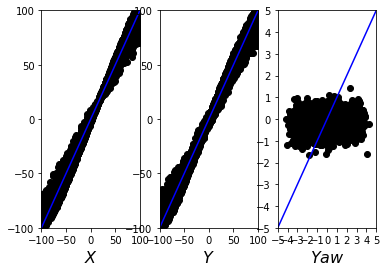

100%|██████████| 24/24 [00:02<00:00, 11.99it/s]

Epoch: 34 Train loss: 211.8109


Test loss: 201.4755


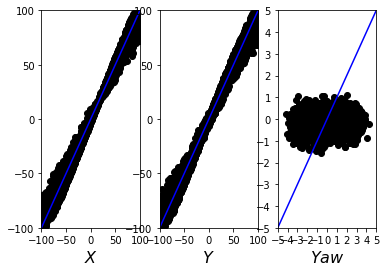

100%|██████████| 24/24 [00:00<00:00, 36.26it/s]

Epoch: 35 Train loss: 200.6865


Test loss: 191.2722


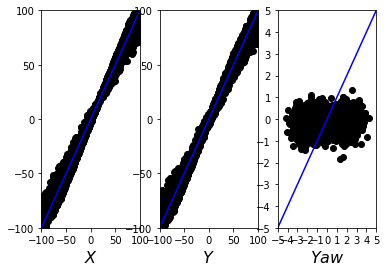

100%|██████████| 24/24 [00:00<00:00, 39.15it/s]

Epoch: 36 Train loss: 190.3941


Test loss: 181.2855


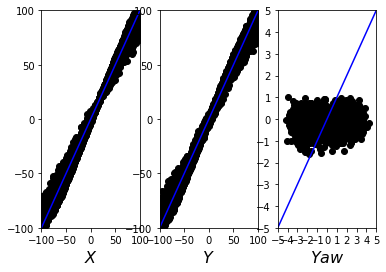

100%|██████████| 24/24 [00:00<00:00, 26.61it/s]

Epoch: 37 Train loss: 179.4634


Test loss: 170.2537


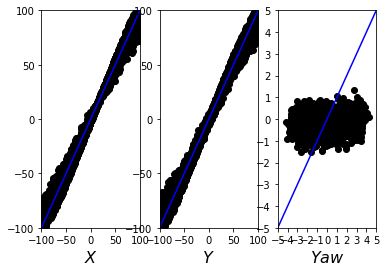

100%|██████████| 24/24 [00:00<00:00, 24.60it/s]

Epoch: 38 Train loss: 168.2286


Test loss: 159.6236


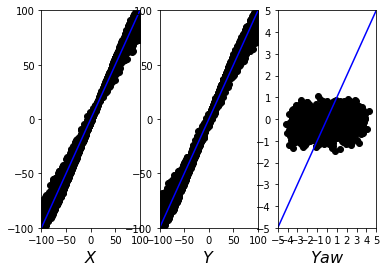

100%|██████████| 24/24 [00:00<00:00, 26.59it/s]

Epoch: 39 Train loss: 157.7115


Test loss: 149.8179


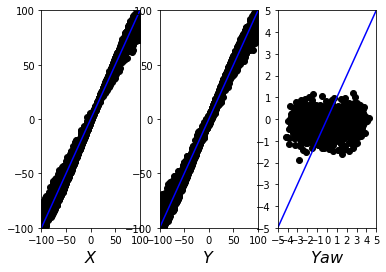

100%|██████████| 24/24 [00:00<00:00, 19.67it/s]


Epoch: 40 Train loss: 148.1001
Test loss: 141.0365


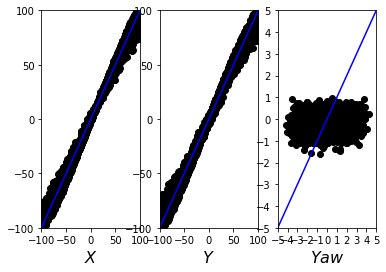

100%|██████████| 24/24 [00:00<00:00, 41.25it/s]

Epoch: 41 Train loss: 139.5844


Test loss: 133.4461


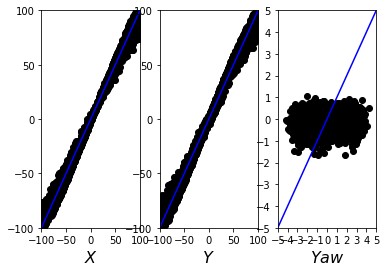

100%|██████████| 24/24 [00:01<00:00, 18.95it/s]


Epoch: 42 Train loss: 132.2886
Test loss: 127.0049


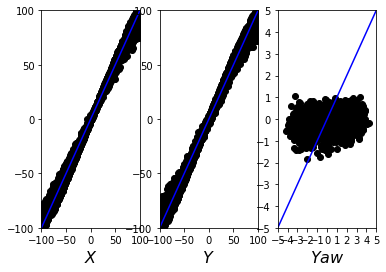

100%|██████████| 24/24 [00:00<00:00, 17.08it/s]

Epoch: 43 Train loss: 125.9856


Test loss: 121.3633


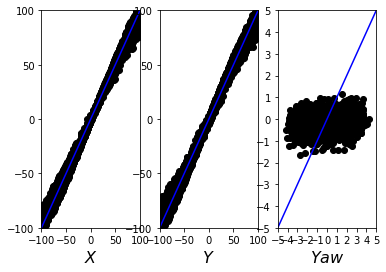

100%|██████████| 24/24 [00:01<00:00, 19.15it/s]

Epoch: 44 Train loss: 120.4619


Test loss: 116.3710


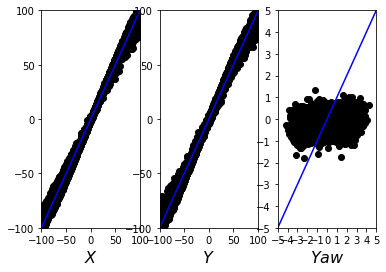

100%|██████████| 24/24 [00:00<00:00, 44.59it/s]

Epoch: 45 Train loss: 115.5433


Test loss: 111.9048


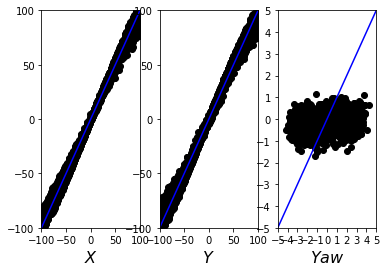

100%|██████████| 24/24 [00:01<00:00, 21.53it/s]

Epoch: 46 Train loss: 111.1476


Test loss: 107.8550


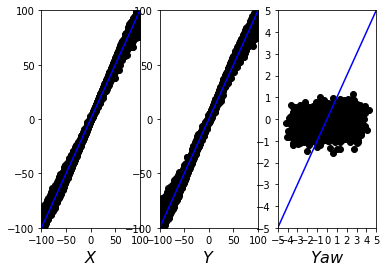

100%|██████████| 24/24 [00:01<00:00, 13.82it/s]

Epoch: 47 Train loss: 107.1650


Test loss: 104.1586


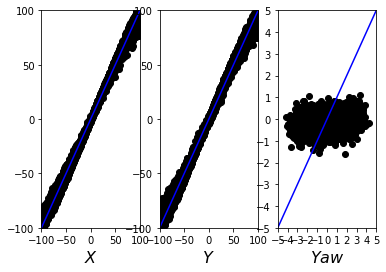

100%|██████████| 24/24 [00:01<00:00, 20.15it/s]

Epoch: 48 Train loss: 103.5128


Test loss: 100.7630


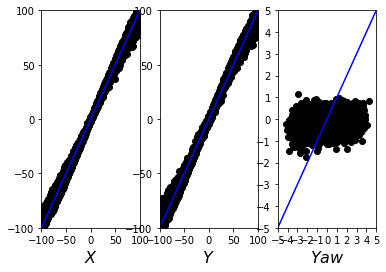

100%|██████████| 24/24 [00:01<00:00, 12.48it/s]

Epoch: 49 Train loss: 100.1337


Test loss: 97.5833


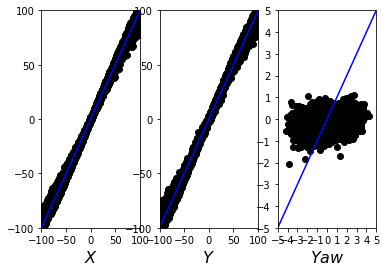

100%|██████████| 24/24 [00:00<00:00, 38.38it/s]

Epoch: 50 Train loss: 96.9510


Test loss: 94.5771


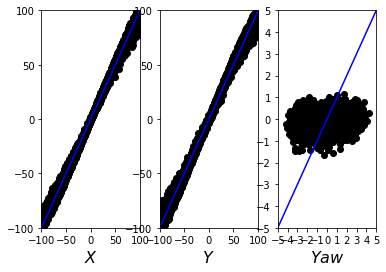

100%|██████████| 24/24 [00:00<00:00, 11.29it/s]

Epoch: 51 Train loss: 93.9626


Test loss: 91.7137


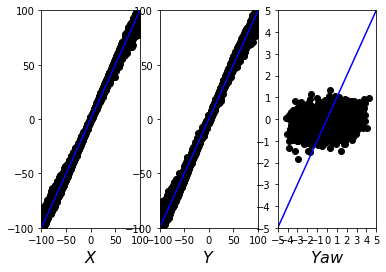

100%|██████████| 24/24 [00:01<00:00, 17.06it/s]

Epoch: 52 Train loss: 91.1442


Test loss: 88.9921


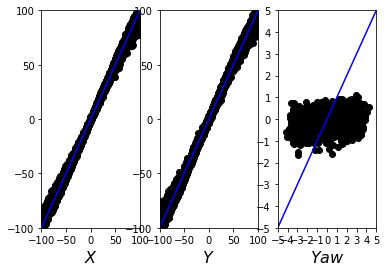

100%|██████████| 24/24 [00:00<00:00, 15.14it/s]

Epoch: 53 Train loss: 88.4461


Test loss: 86.3475


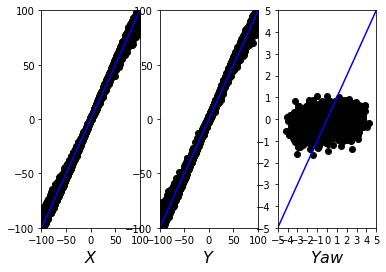

100%|██████████| 24/24 [00:00<00:00, 41.11it/s]


Epoch: 54 Train loss: 85.8360
Test loss: 83.7877


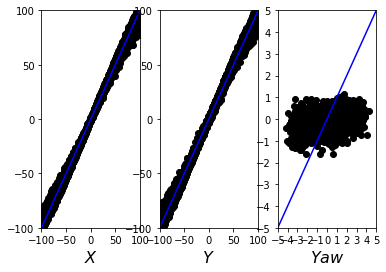

100%|██████████| 24/24 [00:01<00:00, 20.73it/s]

Epoch: 55 Train loss: 83.3172


Test loss: 81.2909


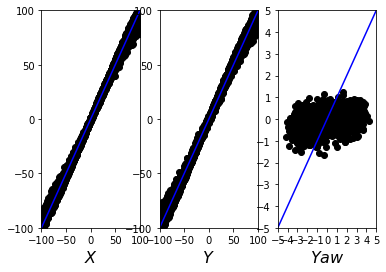

100%|██████████| 24/24 [00:01<00:00, 19.32it/s]

Epoch: 56 Train loss: 80.8687


Test loss: 78.8621


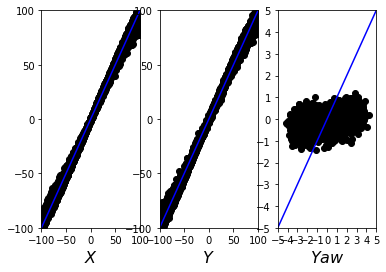

100%|██████████| 24/24 [00:01<00:00, 15.81it/s]

Epoch: 57 Train loss: 78.4696


Test loss: 76.4854


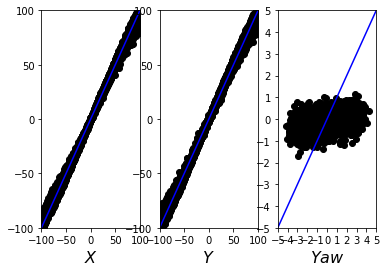

100%|██████████| 24/24 [00:00<00:00, 37.68it/s]

Epoch: 58 Train loss: 76.1368


Test loss: 74.1426


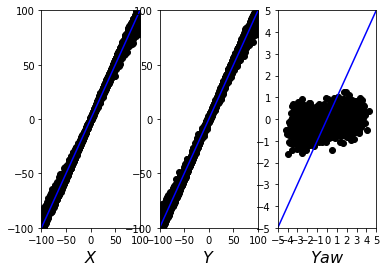

100%|██████████| 24/24 [00:00<00:00, 13.88it/s]

Epoch: 59 Train loss: 73.8545


Test loss: 71.8562


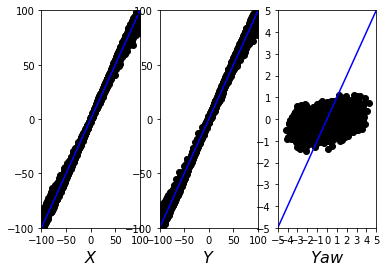

100%|██████████| 24/24 [00:01<00:00, 20.31it/s]

Epoch: 60 Train loss: 71.6201


Test loss: 69.6497


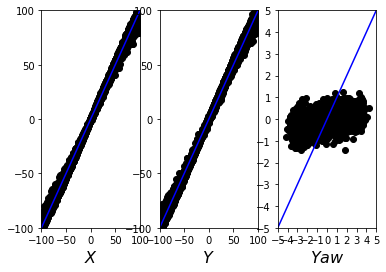

100%|██████████| 24/24 [00:00<00:00, 32.71it/s]


Epoch: 61 Train loss: 69.4569
Test loss: 67.5043


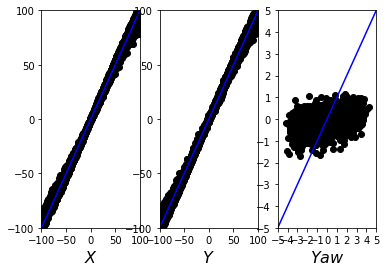

100%|██████████| 24/24 [00:00<00:00, 27.00it/s]

Epoch: 62 Train loss: 67.3447


Test loss: 65.4399


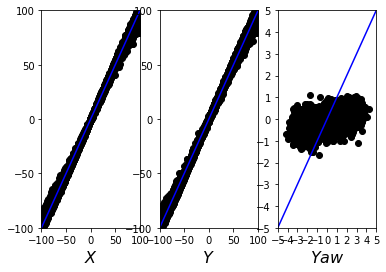

100%|██████████| 24/24 [00:00<00:00, 19.65it/s]

Epoch: 63 Train loss: 65.2935


Test loss: 63.4352


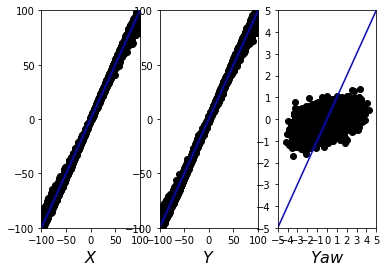

100%|██████████| 24/24 [00:00<00:00, 41.51it/s]

Epoch: 64 Train loss: 63.2952


Test loss: 61.4764


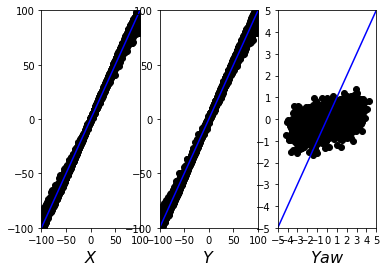

100%|██████████| 24/24 [00:01<00:00, 20.97it/s]

Epoch: 65 Train loss: 61.3709


Test loss: 59.5881


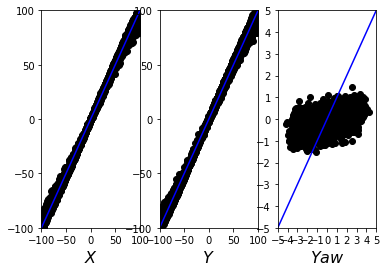

100%|██████████| 24/24 [00:00<00:00, 24.35it/s]

Epoch: 66 Train loss: 59.5157


Test loss: 57.7477


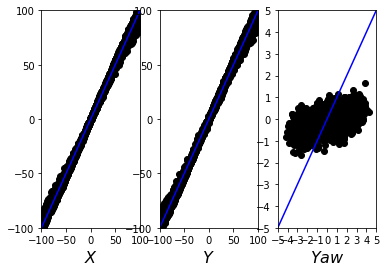

100%|██████████| 24/24 [00:01<00:00, 19.96it/s]

Epoch: 67 Train loss: 57.6938


Test loss: 55.9508


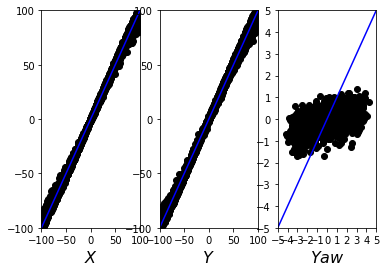

100%|██████████| 24/24 [00:00<00:00, 36.55it/s]

Epoch: 68 Train loss: 55.9395


Test loss: 54.1960


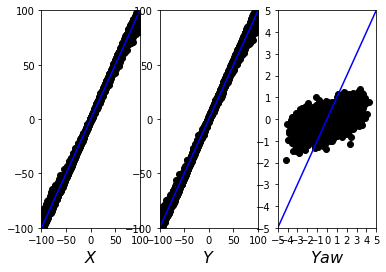

100%|██████████| 24/24 [00:01<00:00, 14.91it/s]

Epoch: 69 Train loss: 54.2182


Test loss: 52.4942


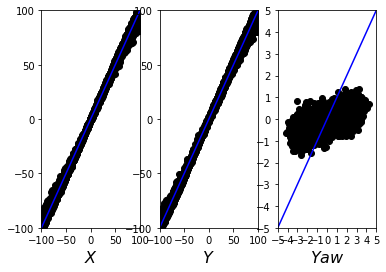

100%|██████████| 24/24 [00:01<00:00, 14.19it/s]

Epoch: 70 Train loss: 52.5466


Test loss: 50.8557


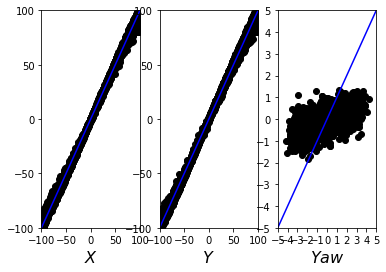

100%|██████████| 24/24 [00:00<00:00, 17.95it/s]

Epoch: 71 Train loss: 50.9146


Test loss: 49.2446


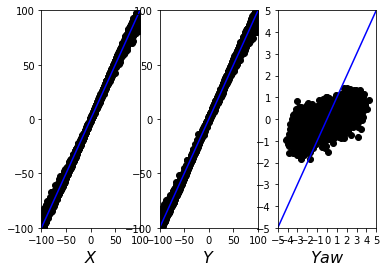

100%|██████████| 24/24 [00:00<00:00, 39.35it/s]

Epoch: 72 Train loss: 49.3304


Test loss: 47.6770


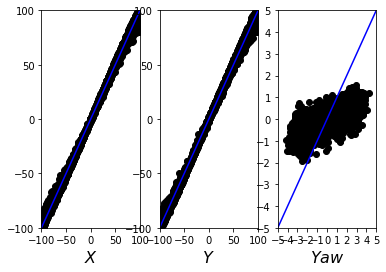

100%|██████████| 24/24 [00:01<00:00, 18.83it/s]

Epoch: 73 Train loss: 47.7828


Test loss: 46.1228


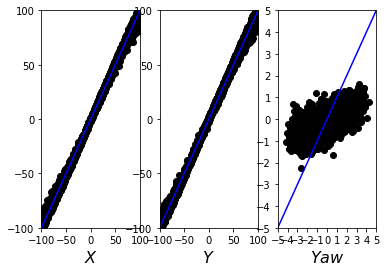

100%|██████████| 24/24 [00:00<00:00, 24.02it/s]

Epoch: 74 Train loss: 46.2764


Test loss: 44.6197


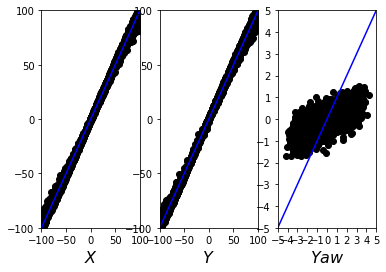

100%|██████████| 24/24 [00:00<00:00, 38.12it/s]

Epoch: 75 Train loss: 44.8133


Test loss: 43.1414


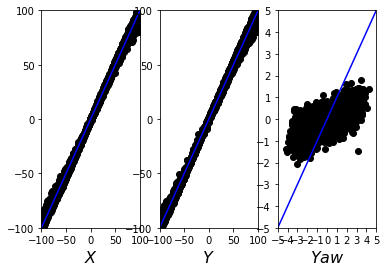

100%|██████████| 24/24 [00:00<00:00, 32.91it/s]

Epoch: 76 Train loss: 43.3584


Test loss: 41.6927


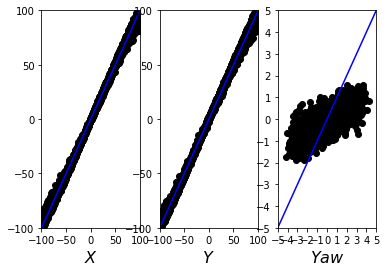

100%|██████████| 24/24 [00:00<00:00, 40.52it/s]

Epoch: 77 Train loss: 41.9315


Test loss: 40.2579


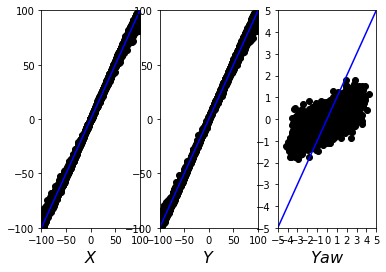

100%|██████████| 24/24 [00:00<00:00, 26.34it/s]

Epoch: 78 Train loss: 40.5302


Test loss: 38.8802


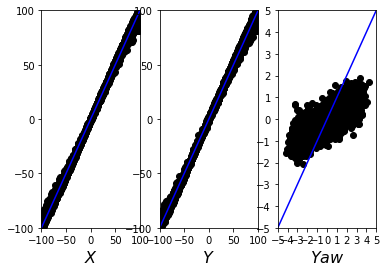

100%|██████████| 24/24 [00:01<00:00, 21.87it/s]

Epoch: 79 Train loss: 39.1777


Test loss: 37.5371


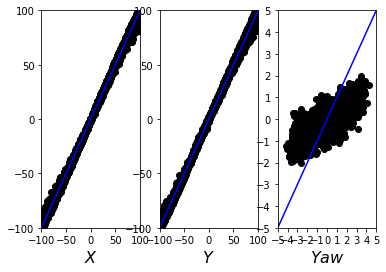

100%|██████████| 24/24 [00:00<00:00, 16.11it/s]


Epoch: 80 Train loss: 37.8576
Test loss: 36.2167


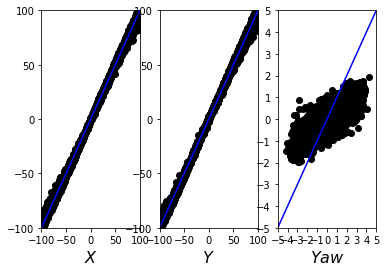

100%|██████████| 24/24 [00:01<00:00, 19.32it/s]


Epoch: 81 Train loss: 36.5780
Test loss: 34.9261


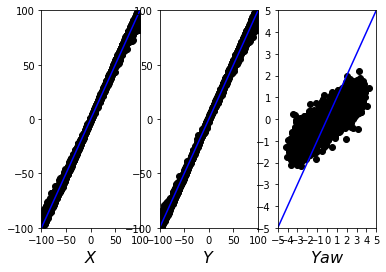

100%|██████████| 24/24 [00:00<00:00, 40.02it/s]

Epoch: 82 Train loss: 35.3197


Test loss: 33.7058


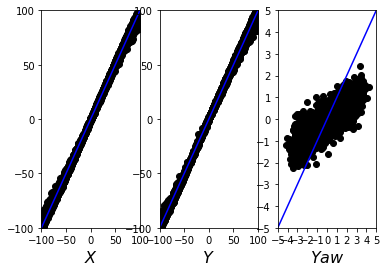

100%|██████████| 24/24 [00:00<00:00, 41.89it/s]

Epoch: 83 Train loss: 34.1218


Test loss: 32.4968


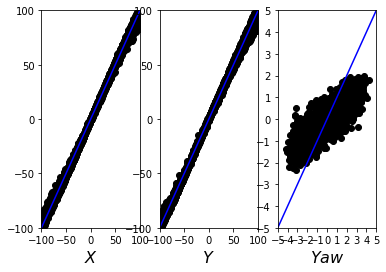

100%|██████████| 24/24 [00:00<00:00, 27.67it/s]

Epoch: 84 Train loss: 32.9361


Test loss: 31.3711


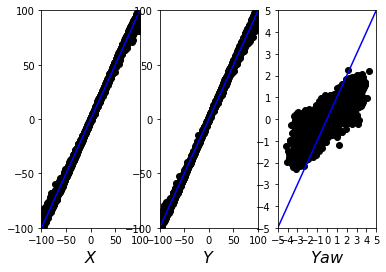

100%|██████████| 24/24 [00:02<00:00, 13.08it/s]

Epoch: 85 Train loss: 31.8339


Test loss: 30.2390


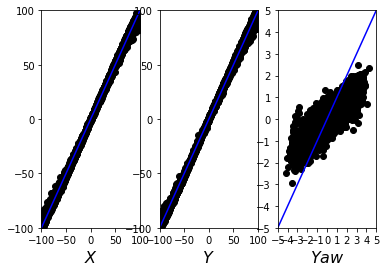

100%|██████████| 24/24 [00:01<00:00, 20.91it/s]

Epoch: 86 Train loss: 30.7070


Test loss: 29.1448


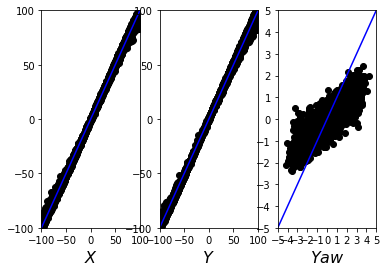

100%|██████████| 24/24 [00:00<00:00, 25.00it/s]

Epoch: 87 Train loss: 29.6500


Test loss: 28.1047


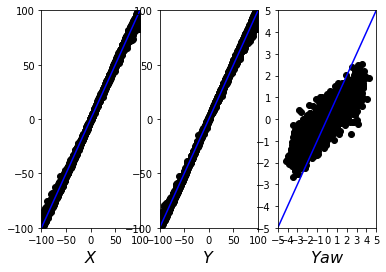

100%|██████████| 24/24 [00:00<00:00, 36.22it/s]

Epoch: 88 Train loss: 28.6286


Test loss: 27.1092


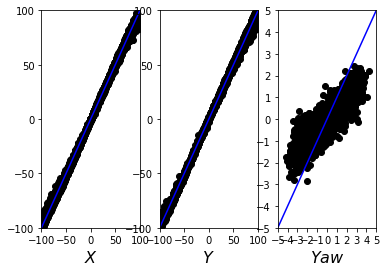

100%|██████████| 24/24 [00:00<00:00, 33.50it/s]

Epoch: 89 Train loss: 27.6514


Test loss: 26.1289


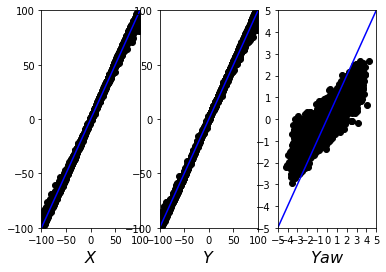

100%|██████████| 24/24 [00:01<00:00, 13.98it/s]

Epoch: 90 Train loss: 26.6790


Test loss: 25.2020


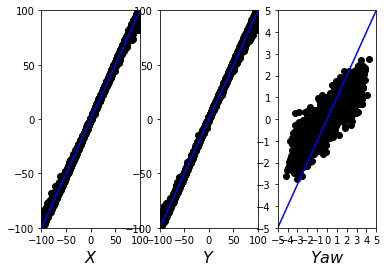

100%|██████████| 24/24 [00:00<00:00, 39.59it/s]

Epoch: 91 Train loss: 25.7576


Test loss: 24.3115


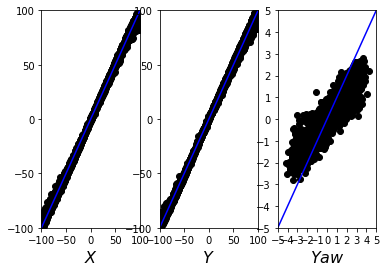

100%|██████████| 24/24 [00:00<00:00, 38.58it/s]

Epoch: 92 Train loss: 24.8650


Test loss: 23.4495


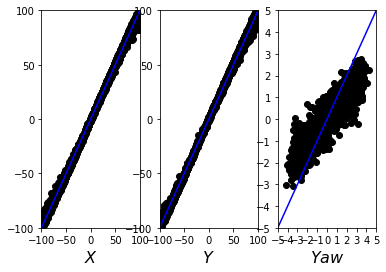

100%|██████████| 24/24 [00:00<00:00, 40.67it/s]

Epoch: 93 Train loss: 24.0016


Test loss: 22.6375


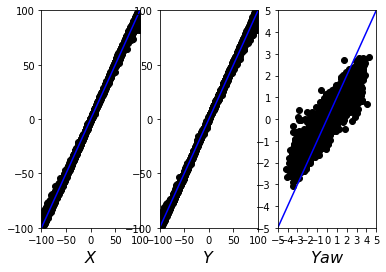

100%|██████████| 24/24 [00:00<00:00, 34.02it/s]

Epoch: 94 Train loss: 23.1846


Test loss: 21.8525


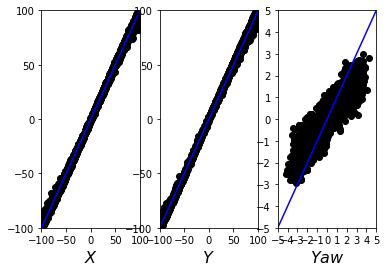

100%|██████████| 24/24 [00:01<00:00, 14.12it/s]

Epoch: 95 Train loss: 22.3950


Test loss: 21.1080


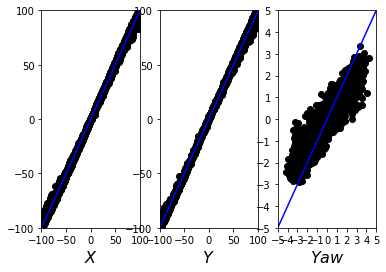

100%|██████████| 24/24 [00:01<00:00, 15.77it/s]

Epoch: 96 Train loss: 21.6517


Test loss: 20.4150


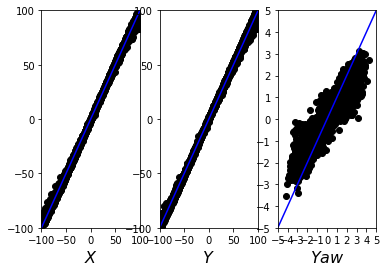

100%|██████████| 24/24 [00:00<00:00, 27.63it/s]

Epoch: 97 Train loss: 20.9460


Test loss: 19.7292


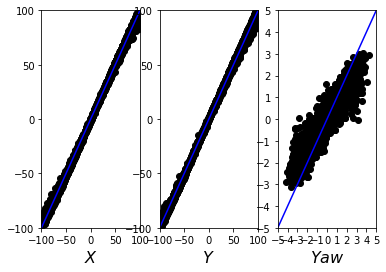

100%|██████████| 24/24 [00:01<00:00, 19.01it/s]

Epoch: 98 Train loss: 20.2615


Test loss: 19.0877


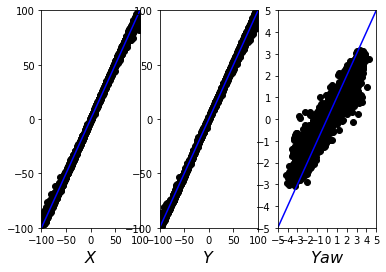

100%|██████████| 24/24 [00:01<00:00, 18.54it/s]

Epoch: 99 Train loss: 19.6097


Test loss: 18.4743


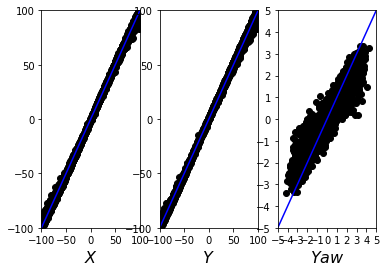

100%|██████████| 24/24 [00:01<00:00, 23.36it/s]

Epoch: 100 Train loss: 18.9876


Test loss: 17.8967


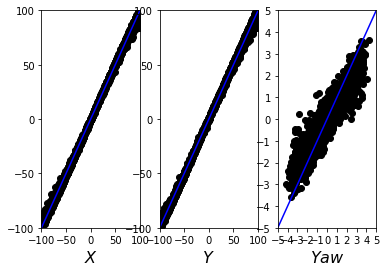

100%|██████████| 24/24 [00:00<00:00, 29.20it/s]

Epoch: 101 Train loss: 18.3897


Test loss: 17.3292


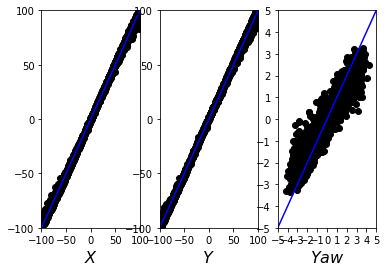

100%|██████████| 24/24 [00:01<00:00, 15.16it/s]

Epoch: 102 Train loss: 17.8037


Test loss: 16.7798


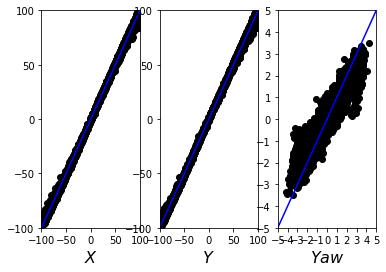

100%|██████████| 24/24 [00:01<00:00, 16.62it/s]

Epoch: 103 Train loss: 17.2485


Test loss: 16.2657


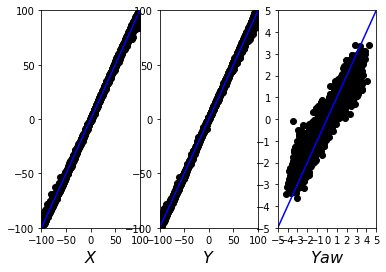

100%|██████████| 24/24 [00:01<00:00, 21.56it/s]

Epoch: 104 Train loss: 16.7089


Test loss: 15.7672


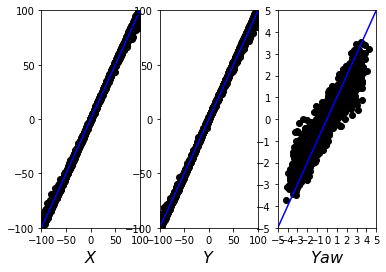

100%|██████████| 24/24 [00:00<00:00, 29.51it/s]

Epoch: 105 Train loss: 16.1877


Test loss: 15.2841


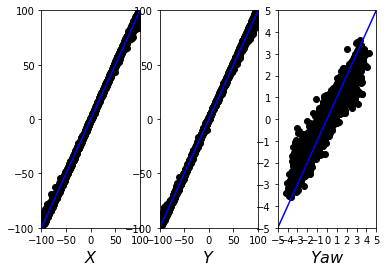

100%|██████████| 24/24 [00:00<00:00, 32.78it/s]

Epoch: 106 Train loss: 15.6829


Test loss: 14.8170


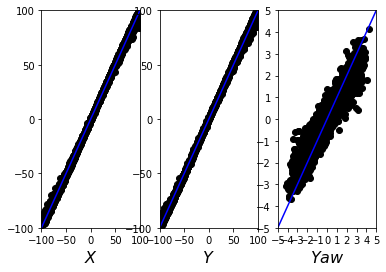

100%|██████████| 24/24 [00:01<00:00, 14.59it/s]

Epoch: 107 Train loss: 15.2026


Test loss: 14.3783


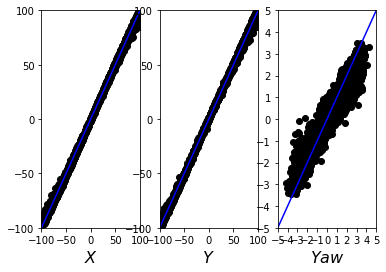

100%|██████████| 24/24 [00:00<00:00, 33.37it/s]

Epoch: 108 Train loss: 14.7381


Test loss: 13.9462


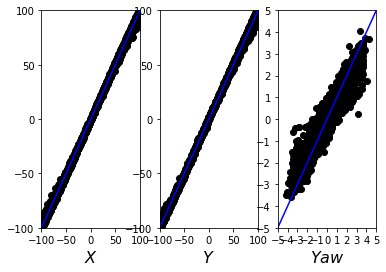

100%|██████████| 24/24 [00:00<00:00, 32.55it/s]

Epoch: 109 Train loss: 14.2891


Test loss: 13.5261


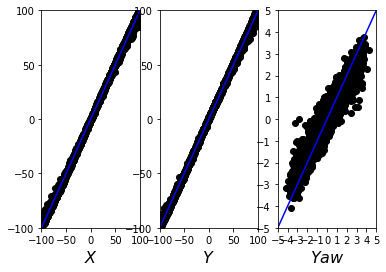

100%|██████████| 24/24 [00:01<00:00, 22.91it/s]

Epoch: 110 Train loss: 13.8532


Test loss: 13.1226


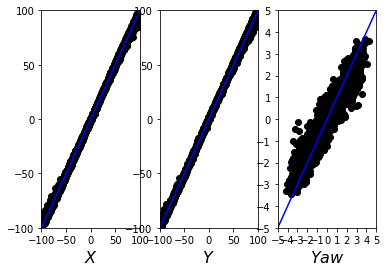

100%|██████████| 24/24 [00:00<00:00, 24.67it/s]

Epoch: 111 Train loss: 13.4403


Test loss: 12.7428


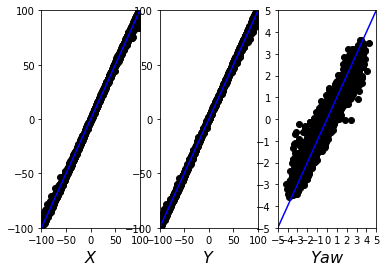

100%|██████████| 24/24 [00:00<00:00, 33.75it/s]


Epoch: 112 Train loss: 13.0360
Test loss: 12.3703


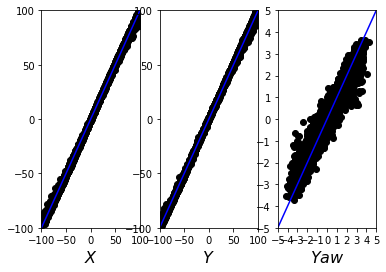

100%|██████████| 24/24 [00:01<00:00, 18.80it/s]

Epoch: 113 Train loss: 12.6460


Test loss: 12.0010


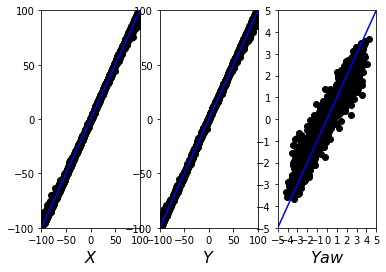

100%|██████████| 24/24 [00:00<00:00, 35.36it/s]

Epoch: 114 Train loss: 12.2706


Test loss: 11.6554


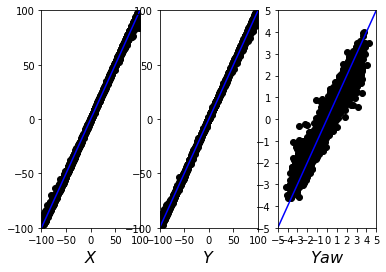

100%|██████████| 24/24 [00:01<00:00, 14.92it/s]

Epoch: 115 Train loss: 11.9077


Test loss: 11.3076


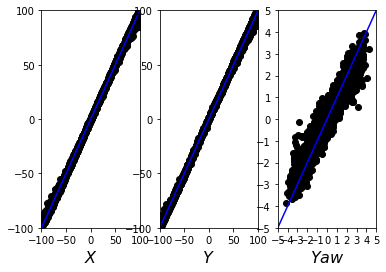

100%|██████████| 24/24 [00:01<00:00, 16.96it/s]

Epoch: 116 Train loss: 11.5514


Test loss: 10.9835


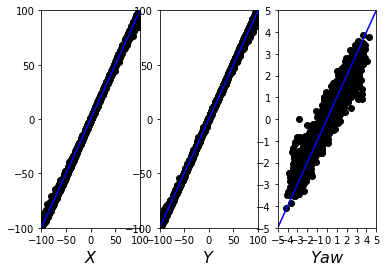

100%|██████████| 24/24 [00:00<00:00, 38.76it/s]

Epoch: 117 Train loss: 11.2064


Test loss: 10.6698


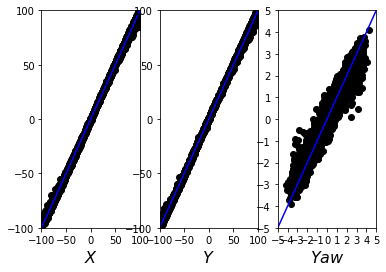

100%|██████████| 24/24 [00:01<00:00, 20.36it/s]

Epoch: 118 Train loss: 10.8752


Test loss: 10.3574


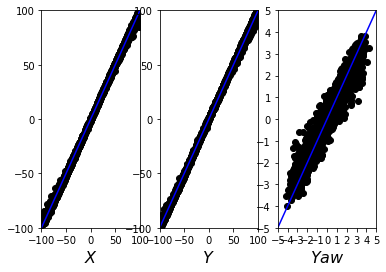

100%|██████████| 24/24 [00:01<00:00, 15.44it/s]

Epoch: 119 Train loss: 10.5508


Test loss: 10.0554


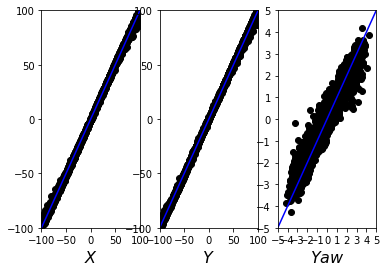

100%|██████████| 24/24 [00:00<00:00, 40.42it/s]

Epoch: 120 Train loss: 10.2425


Test loss: 9.7708


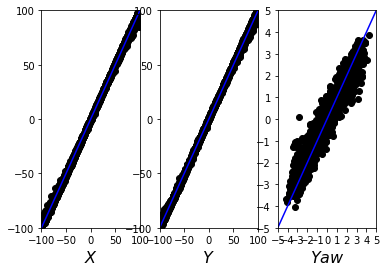

100%|██████████| 24/24 [00:01<00:00, 22.51it/s]

Epoch: 121 Train loss: 9.9398


Test loss: 9.4881


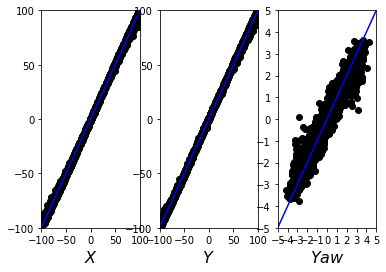

100%|██████████| 24/24 [00:01<00:00, 23.02it/s]

Epoch: 122 Train loss: 9.6490


Test loss: 9.2185


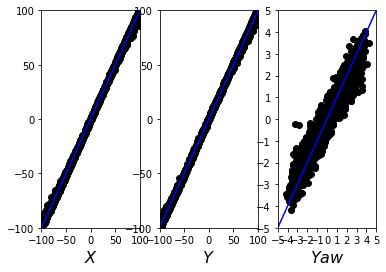

100%|██████████| 24/24 [00:01<00:00, 16.12it/s]

Epoch: 123 Train loss: 9.3624


Test loss: 8.9495


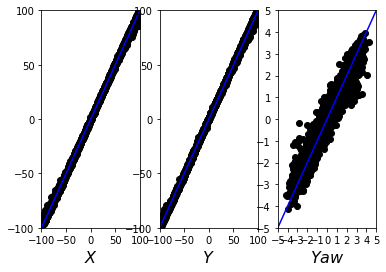

100%|██████████| 24/24 [00:01<00:00, 19.46it/s]

Epoch: 124 Train loss: 9.0924


Test loss: 8.6979


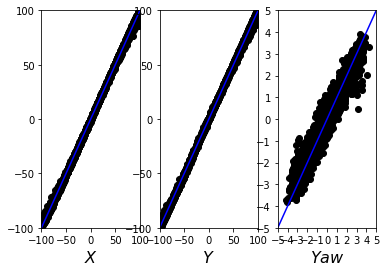

100%|██████████| 24/24 [00:01<00:00, 17.98it/s]

Epoch: 125 Train loss: 8.8338


Test loss: 8.4483


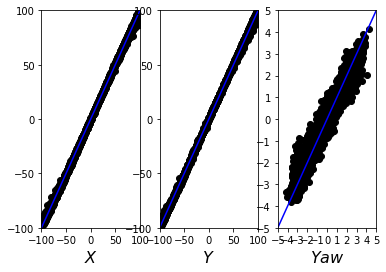

100%|██████████| 24/24 [00:00<00:00, 37.00it/s]

Epoch: 126 Train loss: 8.5766


Test loss: 8.2072


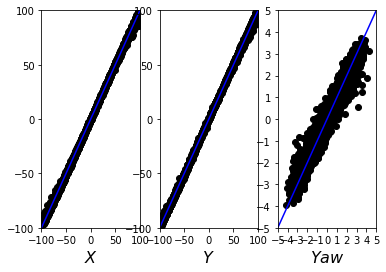

100%|██████████| 24/24 [00:01<00:00, 15.65it/s]

Epoch: 127 Train loss: 8.3317


Test loss: 7.9708


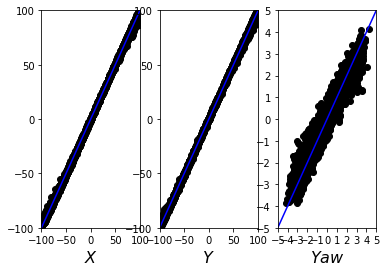

100%|██████████| 24/24 [00:02<00:00, 11.90it/s]

Epoch: 128 Train loss: 8.0904


Test loss: 7.7400


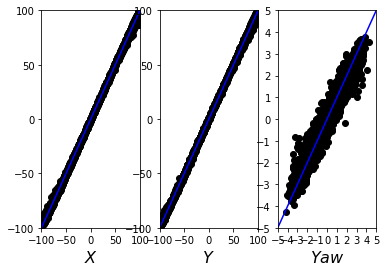

100%|██████████| 24/24 [00:00<00:00, 39.85it/s]

Epoch: 129 Train loss: 7.8557


Test loss: 7.5211


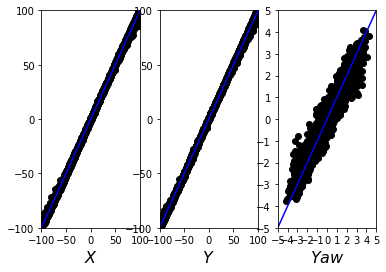

100%|██████████| 24/24 [00:01<00:00, 15.54it/s]

Epoch: 130 Train loss: 7.6303


Test loss: 7.3039


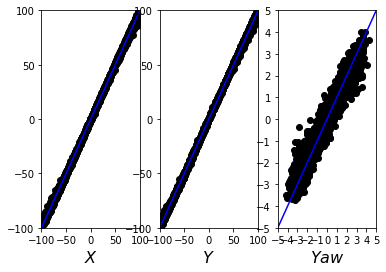

100%|██████████| 24/24 [00:00<00:00, 35.74it/s]


Epoch: 131 Train loss: 7.4132
Test loss: 7.0958


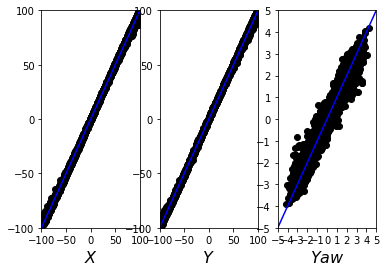

100%|██████████| 24/24 [00:00<00:00, 36.33it/s]

Epoch: 132 Train loss: 7.1974


Test loss: 6.8915


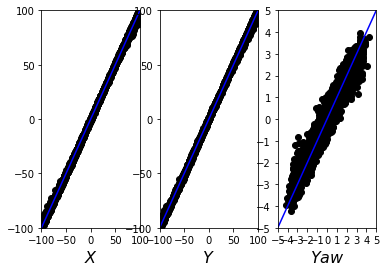

100%|██████████| 24/24 [00:00<00:00, 24.74it/s]

Epoch: 133 Train loss: 6.9848


Test loss: 6.6892


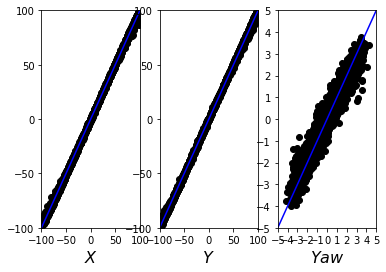

100%|██████████| 24/24 [00:00<00:00, 35.20it/s]

Epoch: 134 Train loss: 6.7806


Test loss: 6.4980


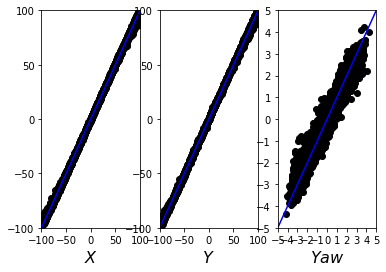

100%|██████████| 24/24 [00:00<00:00, 38.33it/s]

Epoch: 135 Train loss: 6.5830


Test loss: 6.3105


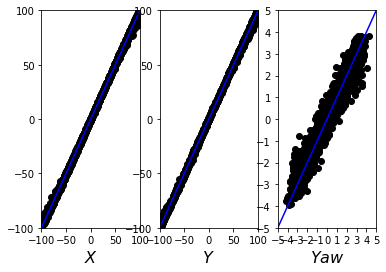

100%|██████████| 24/24 [00:01<00:00, 22.94it/s]

Epoch: 136 Train loss: 6.3931


Test loss: 6.1331


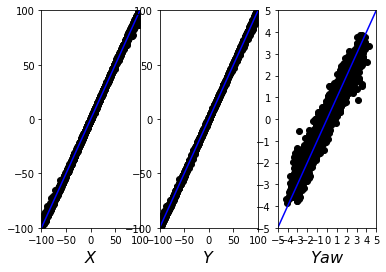

100%|██████████| 24/24 [00:00<00:00, 30.56it/s]

Epoch: 137 Train loss: 6.2057


Test loss: 5.9512


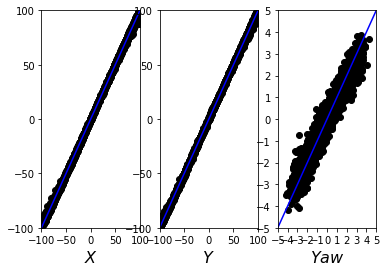

100%|██████████| 24/24 [00:00<00:00, 30.15it/s]

Epoch: 138 Train loss: 6.0181


Test loss: 5.7838


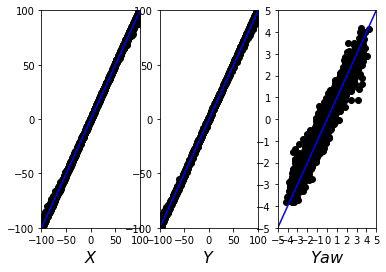

100%|██████████| 24/24 [00:00<00:00, 38.92it/s]

Epoch: 139 Train loss: 5.8423


Test loss: 5.6000


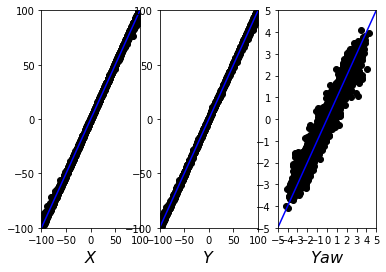

100%|██████████| 24/24 [00:00<00:00, 27.49it/s]

Epoch: 140 Train loss: 5.6634


Test loss: 5.4381


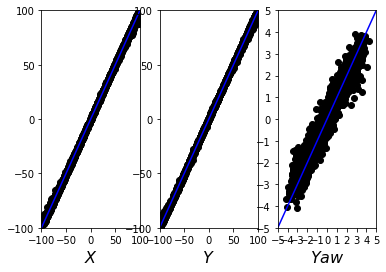

100%|██████████| 24/24 [00:01<00:00, 19.22it/s]

Epoch: 141 Train loss: 5.4979


Test loss: 5.2813


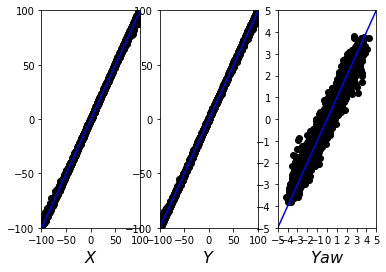

100%|██████████| 24/24 [00:01<00:00, 19.89it/s]

Epoch: 142 Train loss: 5.3354


Test loss: 5.1198


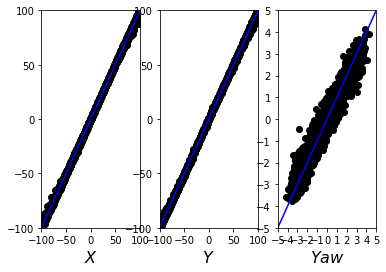

100%|██████████| 24/24 [00:00<00:00, 38.76it/s]

Epoch: 143 Train loss: 5.1684


Test loss: 4.9590


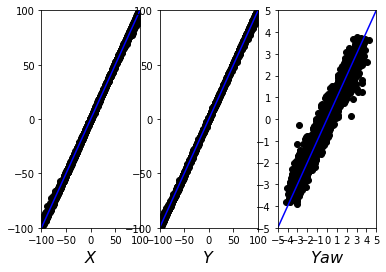

100%|██████████| 24/24 [00:00<00:00, 17.24it/s]

Epoch: 144 Train loss: 5.0064


Test loss: 4.8102


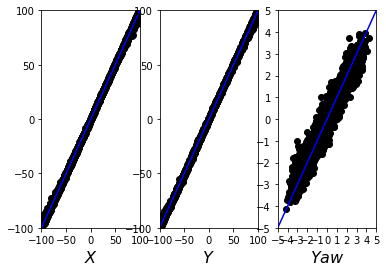

100%|██████████| 24/24 [00:01<00:00, 15.76it/s]

Epoch: 145 Train loss: 4.8544


Test loss: 4.6596


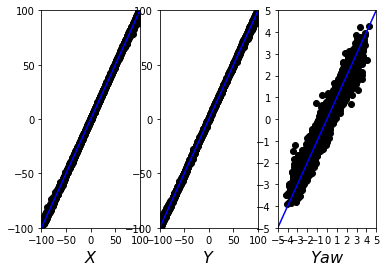

100%|██████████| 24/24 [00:01<00:00, 16.11it/s]

Epoch: 146 Train loss: 4.7017


Test loss: 4.5118


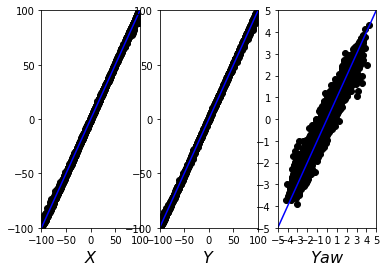

100%|██████████| 24/24 [00:00<00:00, 25.12it/s]

Epoch: 147 Train loss: 4.5563


Test loss: 4.3719


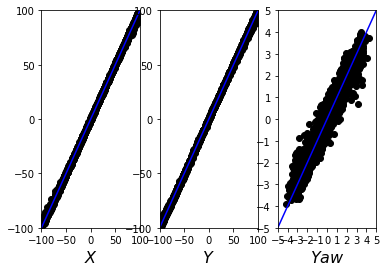

100%|██████████| 24/24 [00:00<00:00, 28.78it/s]

Epoch: 148 Train loss: 4.4155


Test loss: 4.2330


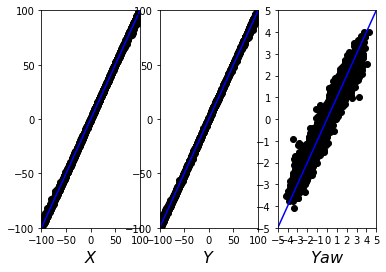

100%|██████████| 24/24 [00:00<00:00, 40.31it/s]

Epoch: 149 Train loss: 4.2745


Test loss: 4.0978


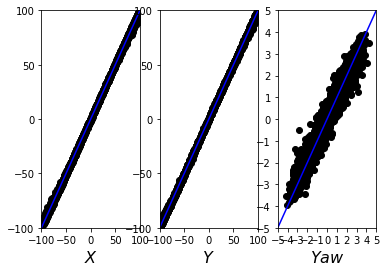

100%|██████████| 24/24 [00:01<00:00, 22.95it/s]

Epoch: 150 Train loss: 4.1421


Test loss: 3.9700


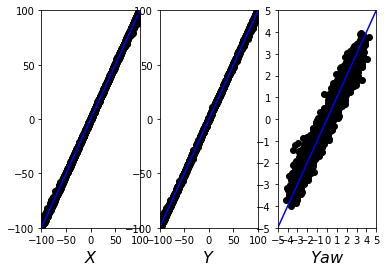

100%|██████████| 24/24 [00:00<00:00, 34.29it/s]

Epoch: 151 Train loss: 4.0125


Test loss: 3.8391


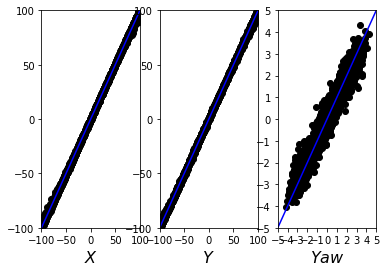

100%|██████████| 24/24 [00:00<00:00, 28.83it/s]

Epoch: 152 Train loss: 3.8846


Test loss: 3.7124


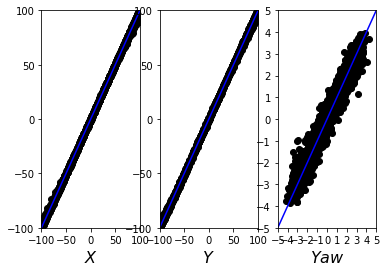

100%|██████████| 24/24 [00:01<00:00, 15.50it/s]

Epoch: 153 Train loss: 3.7610


Test loss: 3.5956


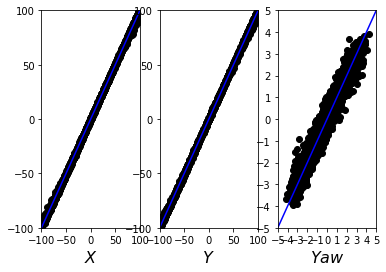

100%|██████████| 24/24 [00:00<00:00, 36.94it/s]

Epoch: 154 Train loss: 3.6408


Test loss: 3.4770


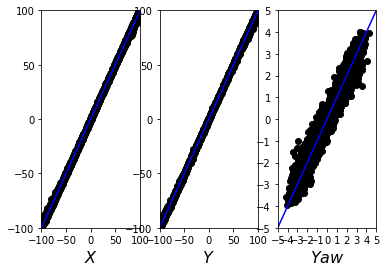

100%|██████████| 24/24 [00:00<00:00, 30.66it/s]

Epoch: 155 Train loss: 3.5219


Test loss: 3.3660


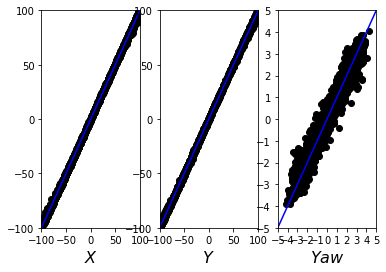

100%|██████████| 24/24 [00:01<00:00, 17.09it/s]

Epoch: 156 Train loss: 3.4106


Test loss: 3.2523


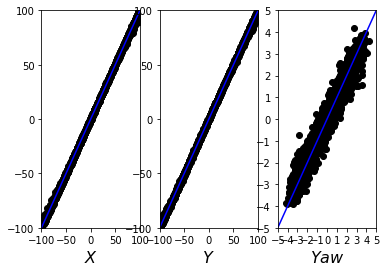

100%|██████████| 24/24 [00:00<00:00, 36.69it/s]

Epoch: 157 Train loss: 3.3028


Test loss: 3.1482


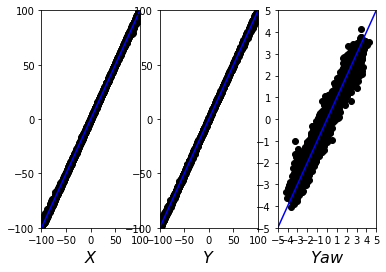

100%|██████████| 24/24 [00:00<00:00, 36.72it/s]

Epoch: 158 Train loss: 3.1888


Test loss: 3.0426


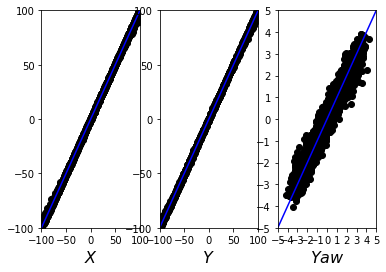

100%|██████████| 24/24 [00:00<00:00, 40.11it/s]

Epoch: 159 Train loss: 3.0852


Test loss: 2.9404


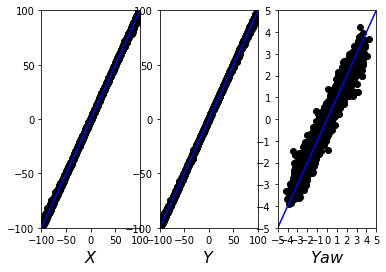

100%|██████████| 24/24 [00:01<00:00, 23.77it/s]

Epoch: 160 Train loss: 2.9810


Test loss: 2.8479


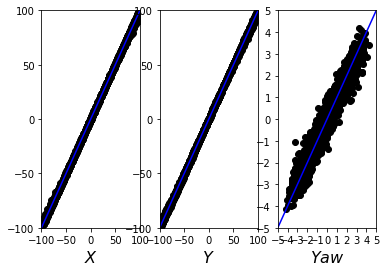

100%|██████████| 24/24 [00:01<00:00, 21.63it/s]

Epoch: 161 Train loss: 2.8787


Test loss: 2.7497


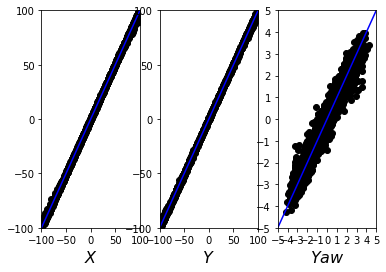

100%|██████████| 24/24 [00:00<00:00, 35.23it/s]

Epoch: 162 Train loss: 2.7831


Test loss: 2.6561


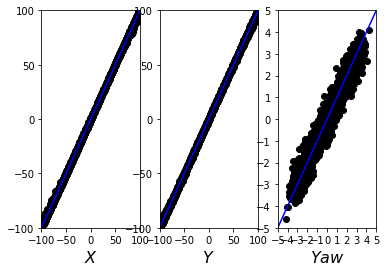

100%|██████████| 24/24 [00:01<00:00, 22.62it/s]

Epoch: 163 Train loss: 2.6905


Test loss: 2.5689


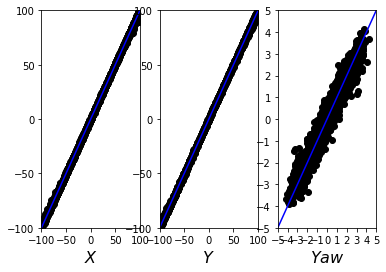

100%|██████████| 24/24 [00:00<00:00, 31.53it/s]

Epoch: 164 Train loss: 2.5995


Test loss: 2.4834


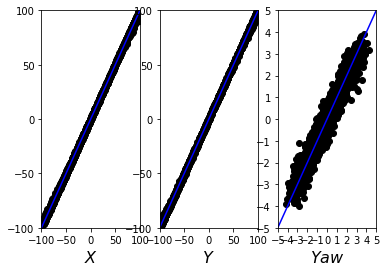

100%|██████████| 24/24 [00:01<00:00, 19.69it/s]

Epoch: 165 Train loss: 2.5070


Test loss: 2.3982


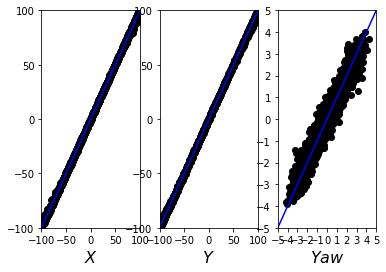

100%|██████████| 24/24 [00:01<00:00, 17.64it/s]

Epoch: 166 Train loss: 2.4200


Test loss: 2.3161


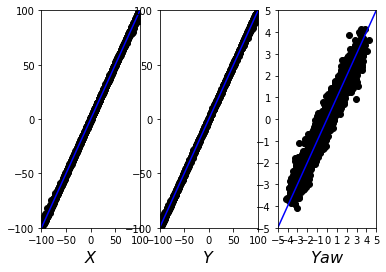

100%|██████████| 24/24 [00:01<00:00, 14.78it/s]

Epoch: 167 Train loss: 2.3367


Test loss: 2.2376


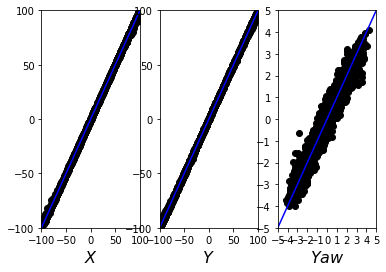

100%|██████████| 24/24 [00:00<00:00, 39.16it/s]

Epoch: 168 Train loss: 2.2552


Test loss: 2.1597


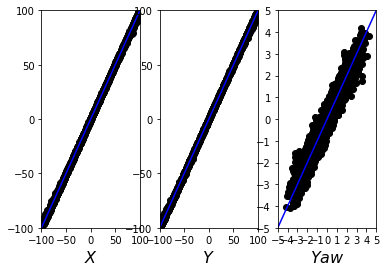

100%|██████████| 24/24 [00:00<00:00, 39.62it/s]

Epoch: 169 Train loss: 2.1758


Test loss: 2.0844


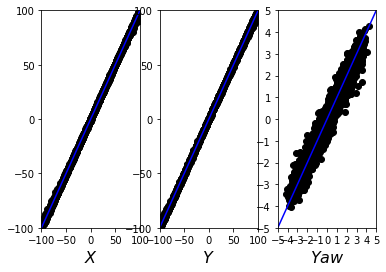

100%|██████████| 24/24 [00:01<00:00, 16.67it/s]


Epoch: 170 Train loss: 2.0937
Test loss: 2.0087


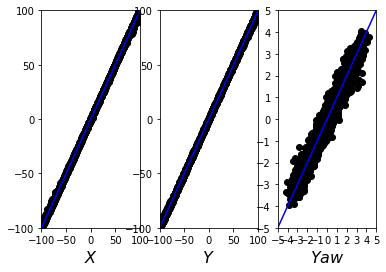

100%|██████████| 24/24 [00:00<00:00, 28.45it/s]

Epoch: 171 Train loss: 2.0214


Test loss: 1.9420


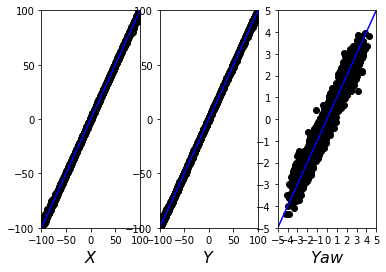

100%|██████████| 24/24 [00:00<00:00, 20.19it/s]

Epoch: 172 Train loss: 1.9475


Test loss: 1.8831


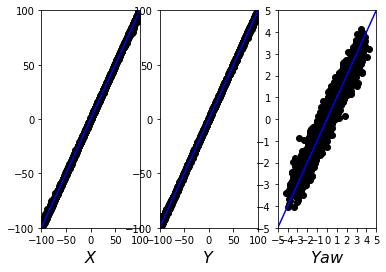

100%|██████████| 24/24 [00:01<00:00, 15.84it/s]

Epoch: 173 Train loss: 1.8773


Test loss: 1.8072


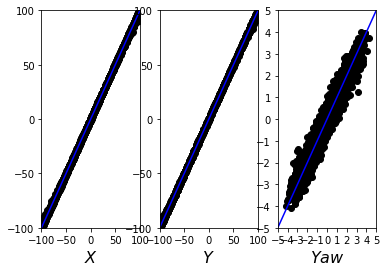

100%|██████████| 24/24 [00:01<00:00, 18.23it/s]

Epoch: 174 Train loss: 1.8087


Test loss: 1.7461


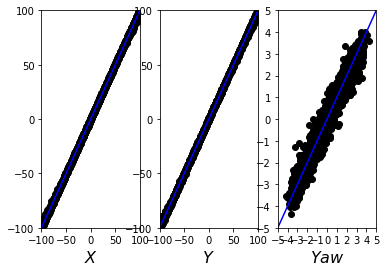

100%|██████████| 24/24 [00:00<00:00, 34.66it/s]

Epoch: 175 Train loss: 1.7469


Test loss: 1.6857


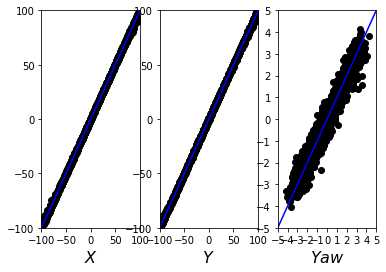

100%|██████████| 24/24 [00:01<00:00, 21.72it/s]

Epoch: 176 Train loss: 1.6811


Test loss: 1.6227


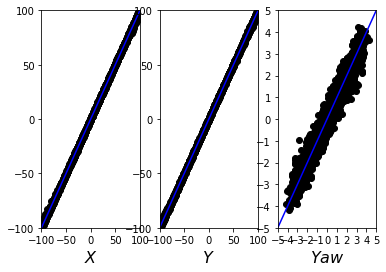

100%|██████████| 24/24 [00:00<00:00, 26.33it/s]

Epoch: 177 Train loss: 1.6159


Test loss: 1.5629


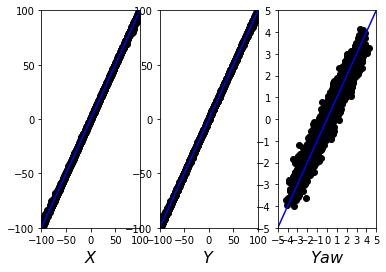

100%|██████████| 24/24 [00:01<00:00, 21.25it/s]

Epoch: 178 Train loss: 1.5555


Test loss: 1.5002


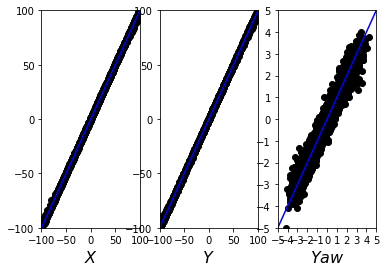

100%|██████████| 24/24 [00:00<00:00, 30.89it/s]

Epoch: 179 Train loss: 1.4951


Test loss: 1.4430


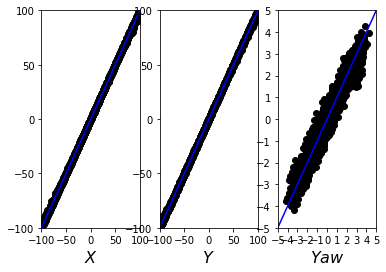

100%|██████████| 24/24 [00:00<00:00, 32.27it/s]

Epoch: 180 Train loss: 1.4348


Test loss: 1.3832


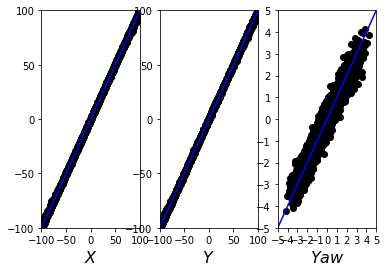

100%|██████████| 24/24 [00:01<00:00, 14.26it/s]

Epoch: 181 Train loss: 1.3750


Test loss: 1.3340


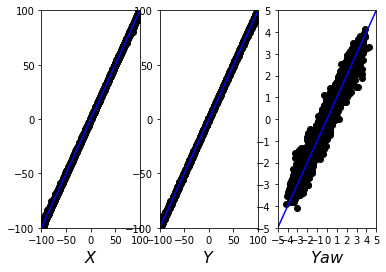

100%|██████████| 24/24 [00:00<00:00, 26.08it/s]

Epoch: 182 Train loss: 1.3216


Test loss: 1.2840


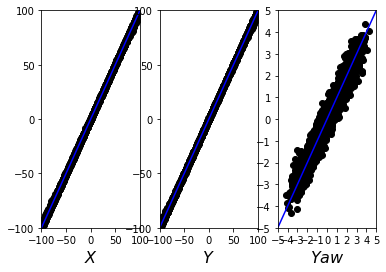

100%|██████████| 24/24 [00:00<00:00, 37.98it/s]

Epoch: 183 Train loss: 1.2712


Test loss: 1.2340


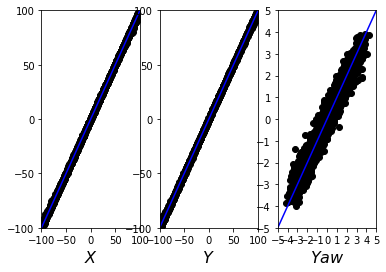

100%|██████████| 24/24 [00:00<00:00, 26.70it/s]

Epoch: 184 Train loss: 1.2186


Test loss: 1.1854


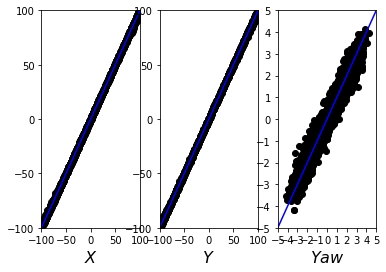

100%|██████████| 24/24 [00:01<00:00, 22.73it/s]

Epoch: 185 Train loss: 1.1659


Test loss: 1.1396


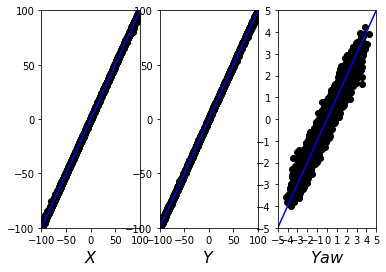

100%|██████████| 24/24 [00:00<00:00, 24.15it/s]

Epoch: 186 Train loss: 1.1165


Test loss: 1.0932


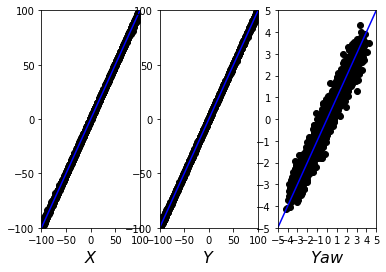

100%|██████████| 24/24 [00:01<00:00, 17.80it/s]

Epoch: 187 Train loss: 1.0726


Test loss: 1.0485


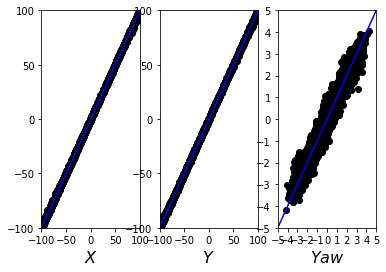

100%|██████████| 24/24 [00:00<00:00, 33.55it/s]

Epoch: 188 Train loss: 1.0238


Test loss: 1.0059


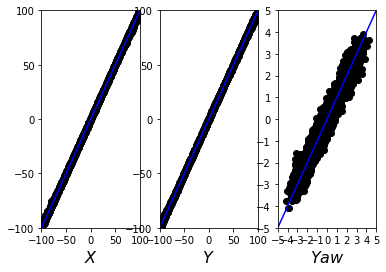

100%|██████████| 24/24 [00:00<00:00, 36.95it/s]


Epoch: 189 Train loss: 0.9808
Test loss: 0.9677


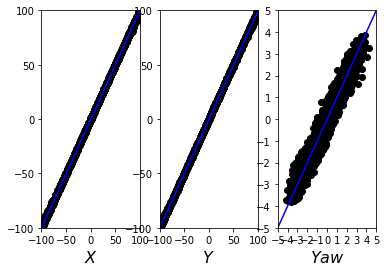

100%|██████████| 24/24 [00:01<00:00, 18.76it/s]

Epoch: 190 Train loss: 0.9372


Test loss: 0.9291


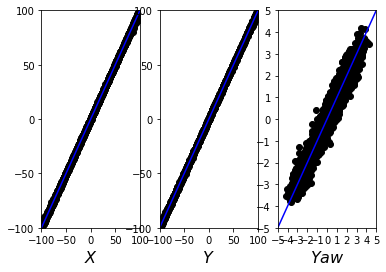

100%|██████████| 24/24 [00:01<00:00, 18.37it/s]

Epoch: 191 Train loss: 0.8959


Test loss: 0.8943


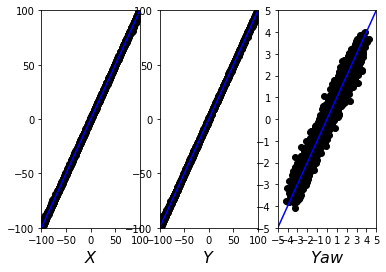

100%|██████████| 24/24 [00:00<00:00, 35.95it/s]

Epoch: 192 Train loss: 0.8563


Test loss: 0.8503


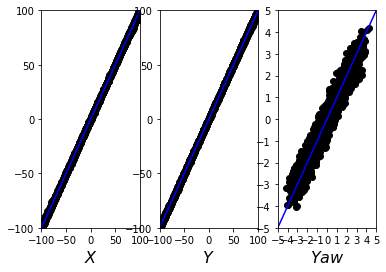

100%|██████████| 24/24 [00:00<00:00, 30.71it/s]

Epoch: 193 Train loss: 0.8132


Test loss: 0.8143


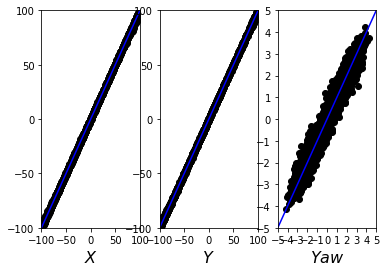

100%|██████████| 24/24 [00:01<00:00, 22.22it/s]

Epoch: 194 Train loss: 0.7766


Test loss: 0.7869


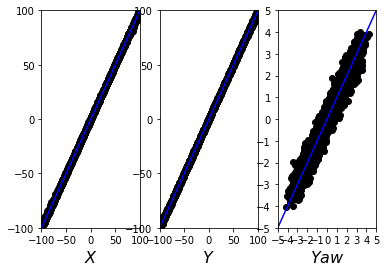

100%|██████████| 24/24 [00:02<00:00, 11.26it/s]

Epoch: 195 Train loss: 0.7455


Test loss: 0.7504


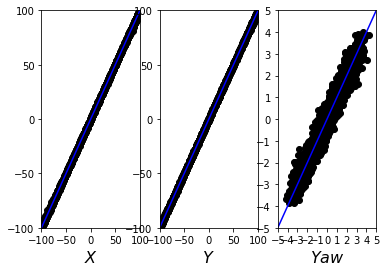

100%|██████████| 24/24 [00:01<00:00, 14.15it/s]

Epoch: 196 Train loss: 0.7058


Test loss: 0.7199


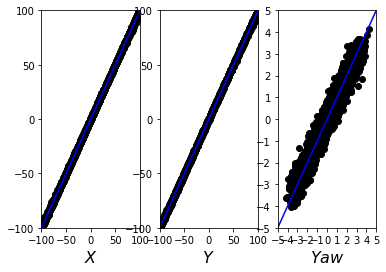

100%|██████████| 24/24 [00:00<00:00, 35.38it/s]

Epoch: 197 Train loss: 0.6747


Test loss: 0.6892


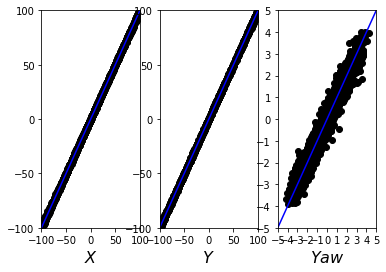

100%|██████████| 24/24 [00:00<00:00, 18.10it/s]

Epoch: 198 Train loss: 0.6399


Test loss: 0.6544


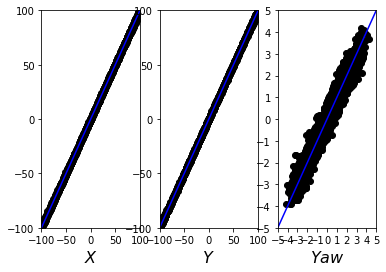

100%|██████████| 24/24 [00:00<00:00, 26.48it/s]

Epoch: 199 Train loss: 0.6116


Test loss: 0.6304


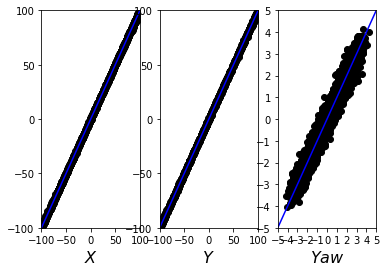

100%|██████████| 24/24 [00:00<00:00, 39.12it/s]

Epoch: 200 Train loss: 0.5830


Test loss: 0.6055


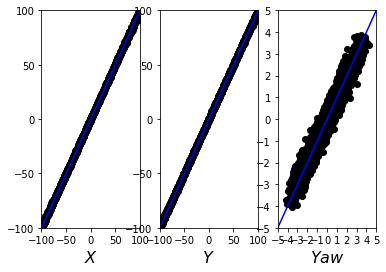

100%|██████████| 24/24 [00:01<00:00, 20.57it/s]

Epoch: 201 Train loss: 0.5528


Test loss: 0.5784


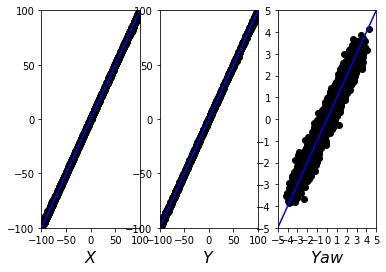

100%|██████████| 24/24 [00:00<00:00, 26.78it/s]


Epoch: 202 Train loss: 0.5229
Test loss: 0.5479


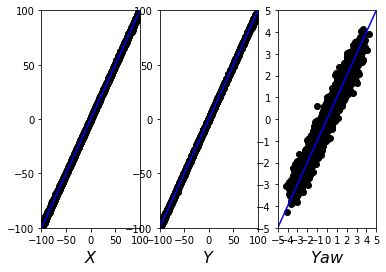

100%|██████████| 24/24 [00:00<00:00, 37.74it/s]

Epoch: 203 Train loss: 0.4991


Test loss: 0.5343


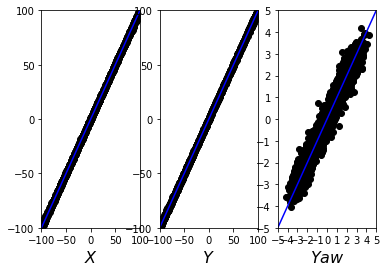

100%|██████████| 24/24 [00:01<00:00, 15.56it/s]

Epoch: 204 Train loss: 0.4785


Test loss: 0.4935


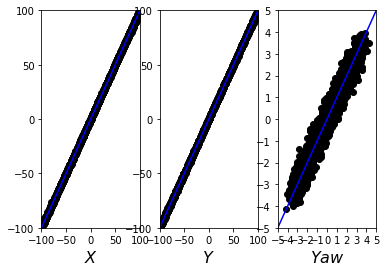

100%|██████████| 24/24 [00:01<00:00, 18.50it/s]

Epoch: 205 Train loss: 0.4461


Test loss: 0.4769


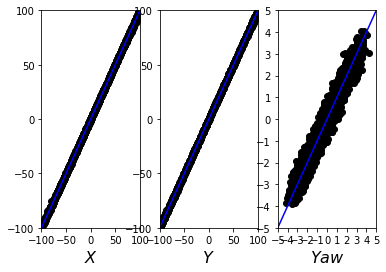

100%|██████████| 24/24 [00:01<00:00, 22.19it/s]

Epoch: 206 Train loss: 0.4214


Test loss: 0.4510


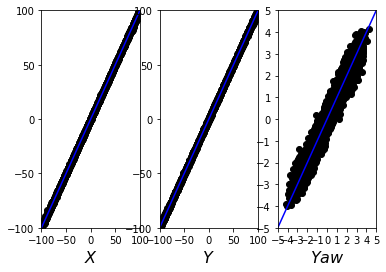

100%|██████████| 24/24 [00:00<00:00, 34.48it/s]

Epoch: 207 Train loss: 0.3958


Test loss: 0.4297


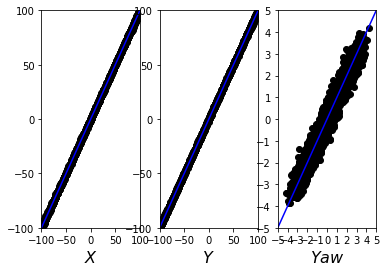

100%|██████████| 24/24 [00:01<00:00, 17.41it/s]

Epoch: 208 Train loss: 0.3793


Test loss: 0.4086


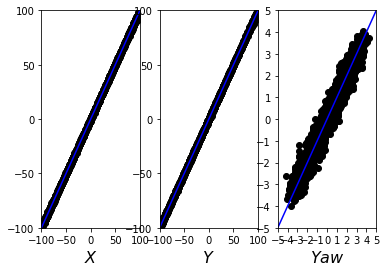

100%|██████████| 24/24 [00:00<00:00, 33.33it/s]

Epoch: 209 Train loss: 0.3531


Test loss: 0.3868


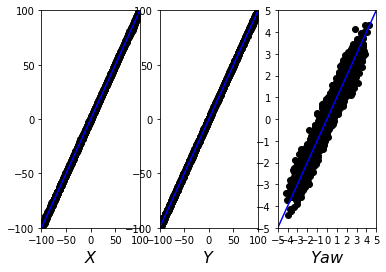

100%|██████████| 24/24 [00:01<00:00, 17.98it/s]

Epoch: 210 Train loss: 0.3332


Test loss: 0.3622


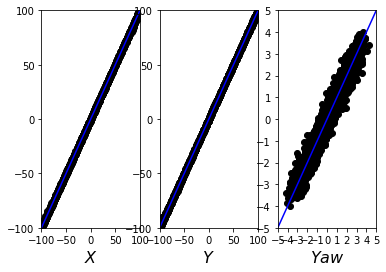

100%|██████████| 24/24 [00:01<00:00, 18.96it/s]

Epoch: 211 Train loss: 0.3141


Test loss: 0.3435


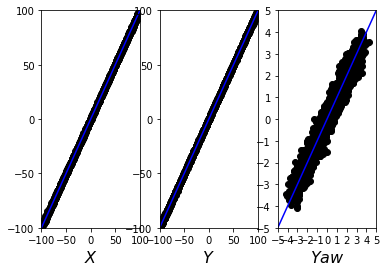

100%|██████████| 24/24 [00:01<00:00, 13.47it/s]

Epoch: 212 Train loss: 0.2899


Test loss: 0.3197


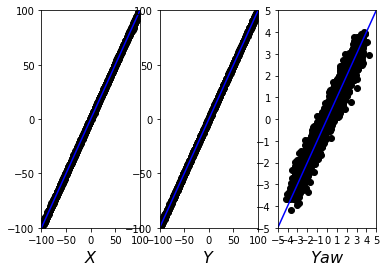

100%|██████████| 24/24 [00:01<00:00, 18.56it/s]

Epoch: 213 Train loss: 0.2725


Test loss: 0.3043


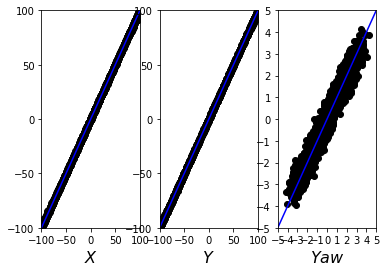

100%|██████████| 24/24 [00:01<00:00, 15.45it/s]

Epoch: 214 Train loss: 0.2541


Test loss: 0.2892


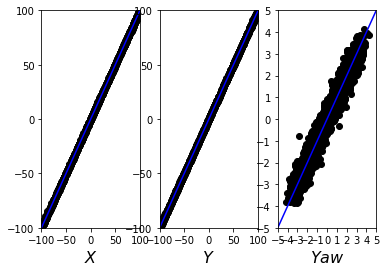

100%|██████████| 24/24 [00:00<00:00, 37.92it/s]

Epoch: 215 Train loss: 0.2393


Test loss: 0.2719


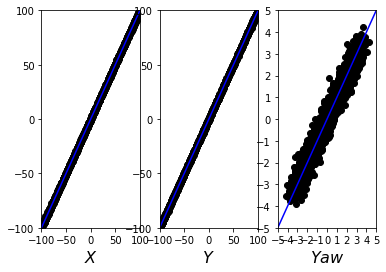

100%|██████████| 24/24 [00:01<00:00, 23.29it/s]

Epoch: 216 Train loss: 0.2242


Test loss: 0.2536


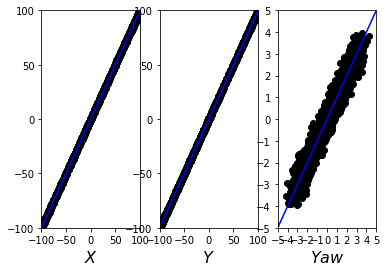

100%|██████████| 24/24 [00:01<00:00, 22.76it/s]

Epoch: 217 Train loss: 0.2060


Test loss: 0.2403


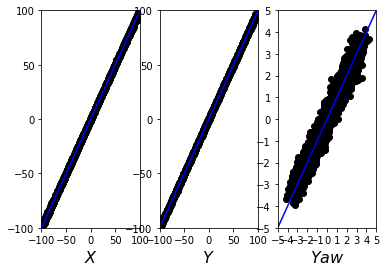

100%|██████████| 24/24 [00:00<00:00, 35.55it/s]

Epoch: 218 Train loss: 0.1932


Test loss: 0.2224


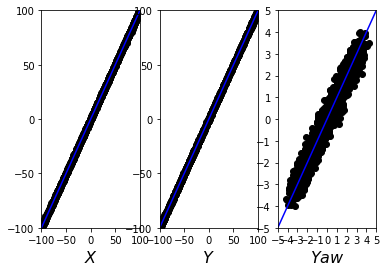

100%|██████████| 24/24 [00:00<00:00, 34.05it/s]

Epoch: 219 Train loss: 0.1776


Test loss: 0.2142


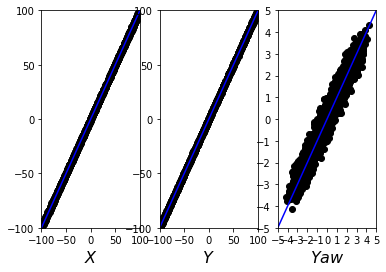

100%|██████████| 24/24 [00:00<00:00, 21.22it/s]

Epoch: 220 Train loss: 0.1632


Test loss: 0.1899


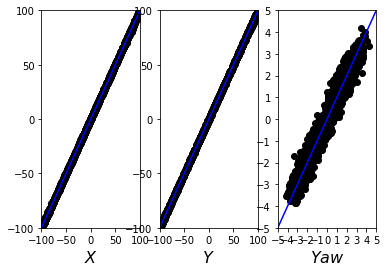

100%|██████████| 24/24 [00:00<00:00, 36.00it/s]

Epoch: 221 Train loss: 0.1492


Test loss: 0.1885


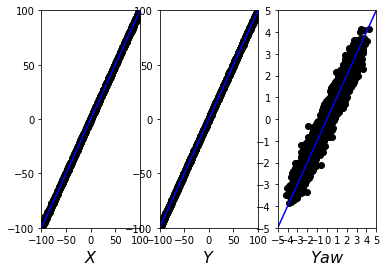

100%|██████████| 24/24 [00:00<00:00, 26.16it/s]

Epoch: 222 Train loss: 0.1347


Test loss: 0.1737


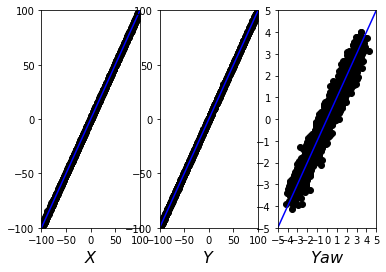

100%|██████████| 24/24 [00:00<00:00, 21.08it/s]

Epoch: 223 Train loss: 0.1184


Test loss: 0.1464


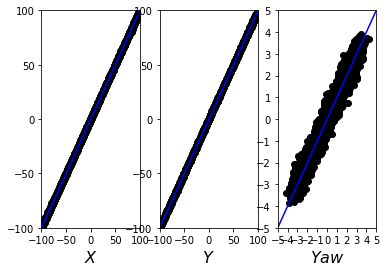

100%|██████████| 24/24 [00:00<00:00, 21.59it/s]

Epoch: 224 Train loss: 0.1066


Test loss: 0.1403


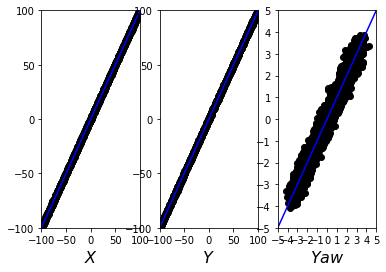

100%|██████████| 24/24 [00:02<00:00,  9.05it/s]

Epoch: 225 Train loss: 0.0974


Test loss: 0.1258


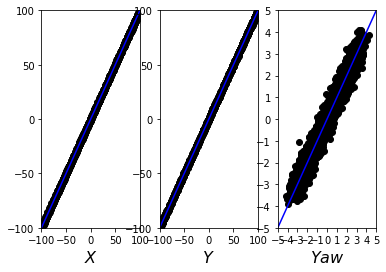

100%|██████████| 24/24 [00:01<00:00, 18.51it/s]

Epoch: 226 Train loss: 0.0836


Test loss: 0.1092


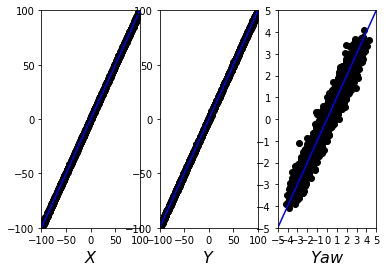

100%|██████████| 24/24 [00:00<00:00, 18.31it/s]


Epoch: 227 Train loss: 0.0728
Test loss: 0.1041


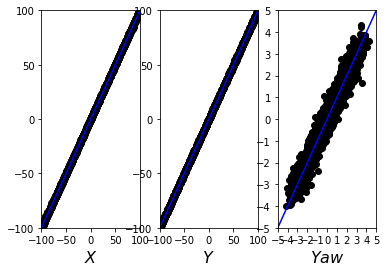

100%|██████████| 24/24 [00:00<00:00, 19.80it/s]

Epoch: 228 Train loss: 0.0598


Test loss: 0.0918


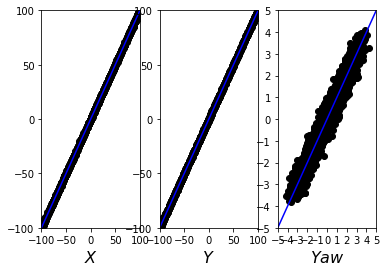

100%|██████████| 24/24 [00:01<00:00, 18.50it/s]

Epoch: 229 Train loss: 0.0488


Test loss: 0.0906


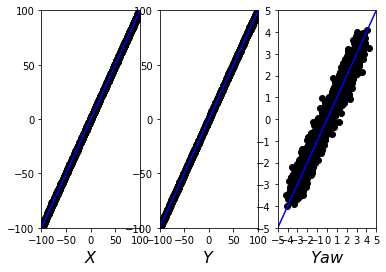

100%|██████████| 24/24 [00:01<00:00, 23.22it/s]

Epoch: 230 Train loss: 0.0381


Test loss: 0.0746


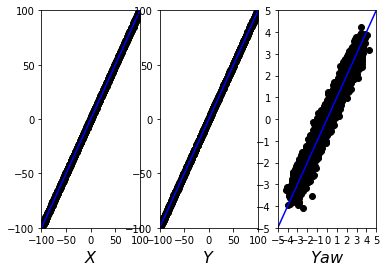

100%|██████████| 24/24 [00:00<00:00, 35.72it/s]

Epoch: 231 Train loss: 0.0309


Test loss: 0.0686


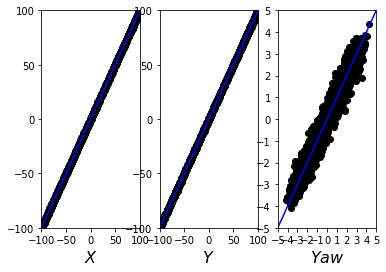

100%|██████████| 24/24 [00:00<00:00, 17.38it/s]

Epoch: 232 Train loss: 0.0166


Test loss: 0.0581


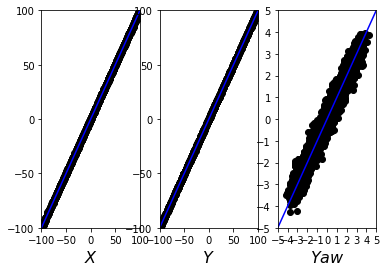

100%|██████████| 24/24 [00:00<00:00, 36.06it/s]

Epoch: 233 Train loss: 0.0090


Test loss: 0.0426


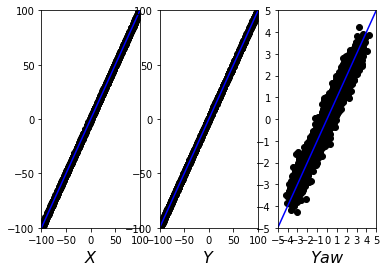

100%|██████████| 24/24 [00:01<00:00, 16.64it/s]

Epoch: 234 Train loss: -0.0031


Test loss: 0.0363


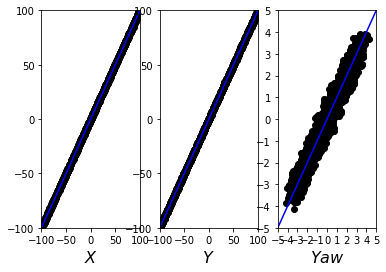

100%|██████████| 24/24 [00:01<00:00, 17.61it/s]

Epoch: 235 Train loss: -0.0080


Test loss: 0.0271


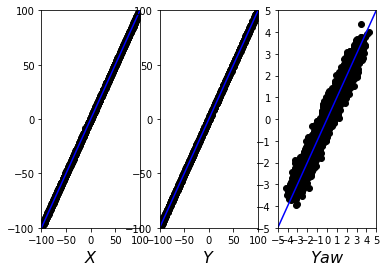

100%|██████████| 24/24 [00:01<00:00, 14.44it/s]

Epoch: 236 Train loss: -0.0180


Test loss: 0.0166


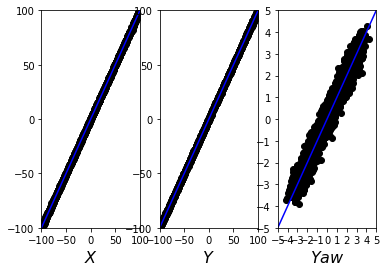

100%|██████████| 24/24 [00:01<00:00, 17.07it/s]

Epoch: 237 Train loss: -0.0245


Test loss: 0.0104


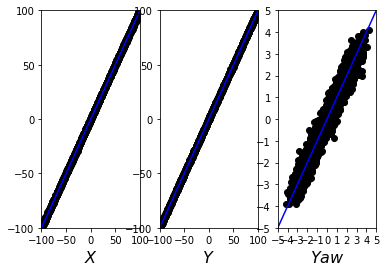

100%|██████████| 24/24 [00:00<00:00, 38.55it/s]

Epoch: 238 Train loss: -0.0331


Test loss: 0.0047


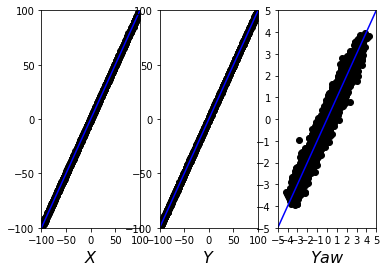

100%|██████████| 24/24 [00:01<00:00, 19.64it/s]

Epoch: 239 Train loss: -0.0412


Test loss: -0.0043


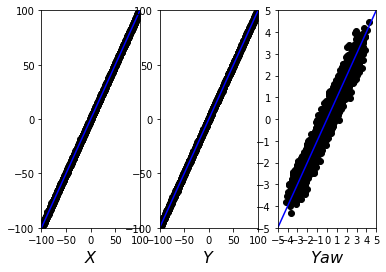

100%|██████████| 24/24 [00:01<00:00, 17.16it/s]

Epoch: 240 Train loss: -0.0523


Test loss: -0.0085


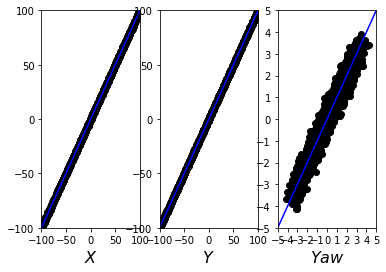

100%|██████████| 24/24 [00:01<00:00, 17.27it/s]

Epoch: 241 Train loss: -0.0575


Test loss: -0.0120


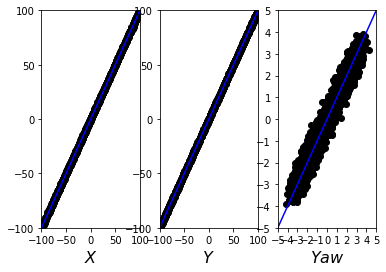

100%|██████████| 24/24 [00:00<00:00, 17.59it/s]

Epoch: 242 Train loss: -0.0599


Test loss: -0.0163


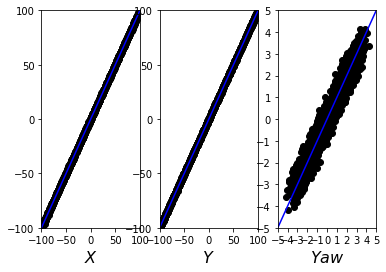

100%|██████████| 24/24 [00:00<00:00, 29.87it/s]

Epoch: 243 Train loss: -0.0678


Test loss: -0.0211


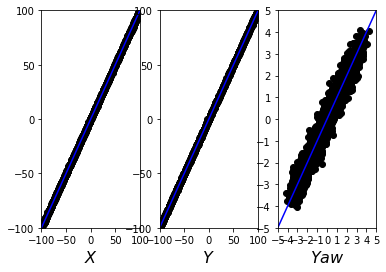

100%|██████████| 24/24 [00:01<00:00, 13.54it/s]

Epoch: 244 Train loss: -0.0742


Test loss: -0.0349


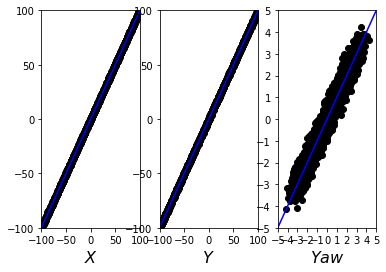

100%|██████████| 24/24 [00:01<00:00, 20.91it/s]

Epoch: 245 Train loss: -0.0833


Test loss: -0.0355


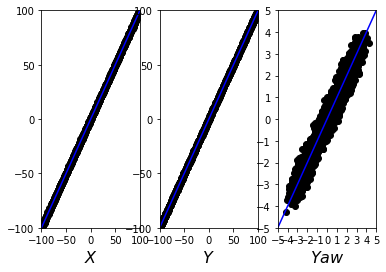

100%|██████████| 24/24 [00:00<00:00, 36.87it/s]

Epoch: 246 Train loss: -0.0846


Test loss: -0.0469


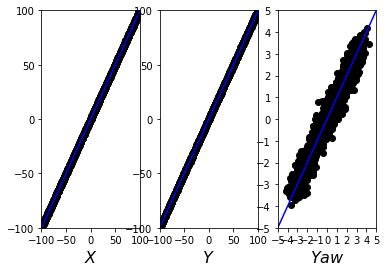

100%|██████████| 24/24 [00:00<00:00, 34.36it/s]

Epoch: 247 Train loss: -0.0891


Test loss: -0.0467


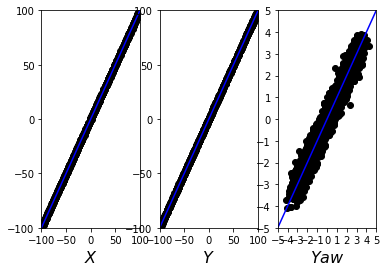

100%|██████████| 24/24 [00:00<00:00, 33.74it/s]

Epoch: 248 Train loss: -0.0924


Test loss: -0.0470


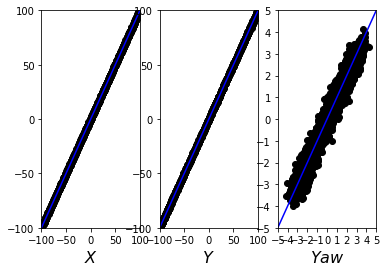

100%|██████████| 24/24 [00:01<00:00, 13.05it/s]

Epoch: 249 Train loss: -0.1020


Test loss: -0.0612


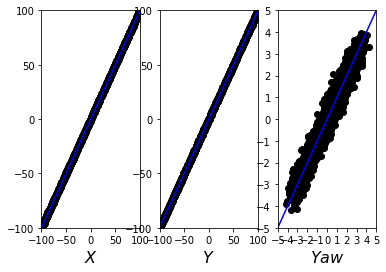

100%|██████████| 24/24 [00:01<00:00, 21.15it/s]

Epoch: 250 Train loss: -0.1048


Test loss: -0.0606


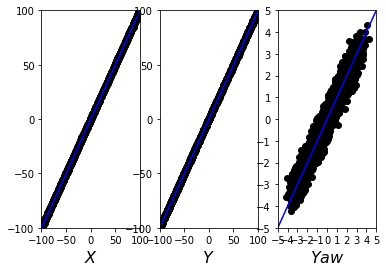

100%|██████████| 24/24 [00:01<00:00, 19.40it/s]

Epoch: 251 Train loss: -0.1107


Test loss: -0.0697


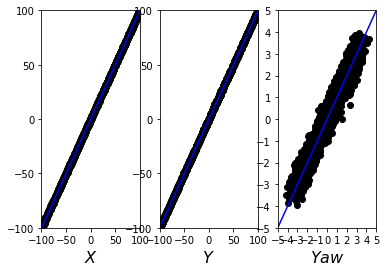

100%|██████████| 24/24 [00:01<00:00, 15.23it/s]

Epoch: 252 Train loss: -0.1161


Test loss: -0.0692


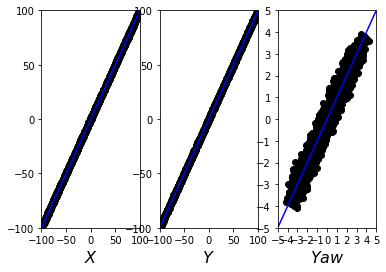

100%|██████████| 24/24 [00:01<00:00, 20.44it/s]

Epoch: 253 Train loss: -0.1223


Test loss: -0.0791


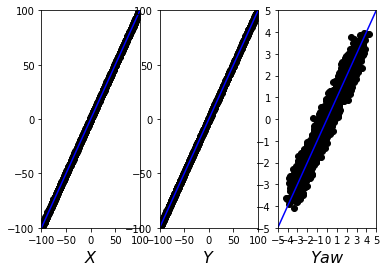

100%|██████████| 24/24 [00:01<00:00, 23.92it/s]

Epoch: 254 Train loss: -0.1249


Test loss: -0.0781


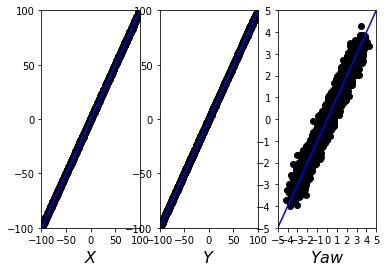

100%|██████████| 24/24 [00:01<00:00, 20.66it/s]

Epoch: 255 Train loss: -0.1261


Test loss: -0.0820


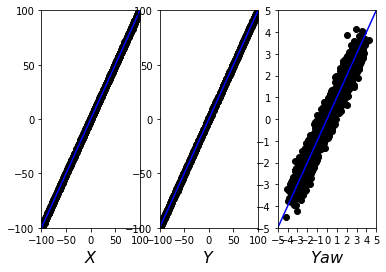

100%|██████████| 24/24 [00:00<00:00, 16.96it/s]

Epoch: 256 Train loss: -0.1335


Test loss: -0.0835


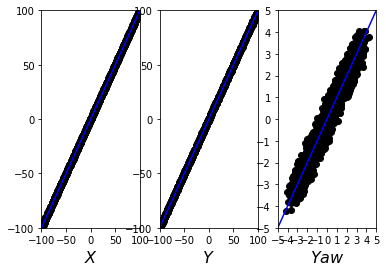

100%|██████████| 24/24 [00:00<00:00, 32.61it/s]

Epoch: 257 Train loss: -0.1327


Test loss: -0.0953


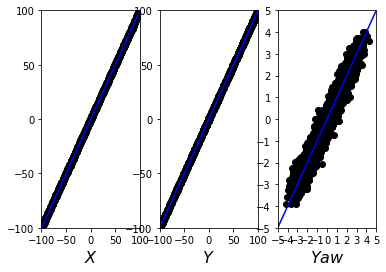

100%|██████████| 24/24 [00:00<00:00, 17.03it/s]

Epoch: 258 Train loss: -0.1401


Test loss: -0.0993


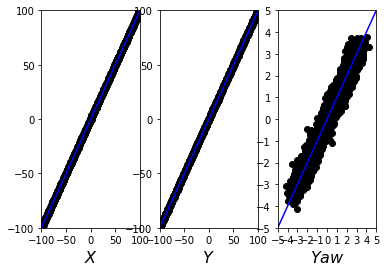

100%|██████████| 24/24 [00:01<00:00, 12.84it/s]

Epoch: 259 Train loss: -0.1433


Test loss: -0.1028


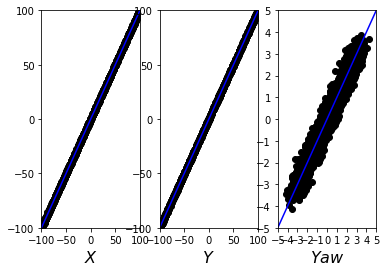

100%|██████████| 24/24 [00:01<00:00, 15.61it/s]

Epoch: 260 Train loss: -0.1468


Test loss: -0.1029


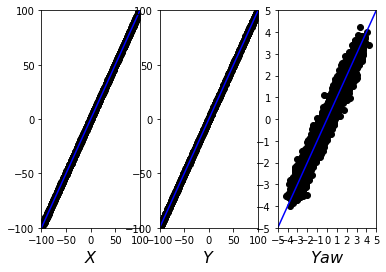

100%|██████████| 24/24 [00:00<00:00, 32.99it/s]

Epoch: 261 Train loss: -0.1476


Test loss: -0.1019


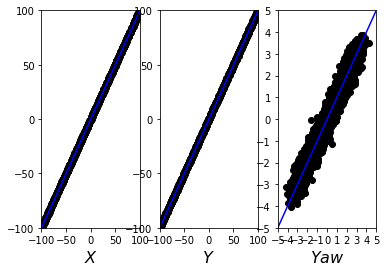

100%|██████████| 24/24 [00:01<00:00, 14.33it/s]

Epoch: 262 Train loss: -0.1531


Test loss: -0.1054


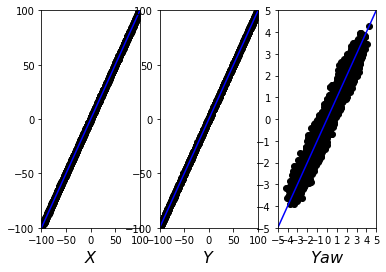

100%|██████████| 24/24 [00:01<00:00, 18.70it/s]

Epoch: 263 Train loss: -0.1580


Test loss: -0.1059


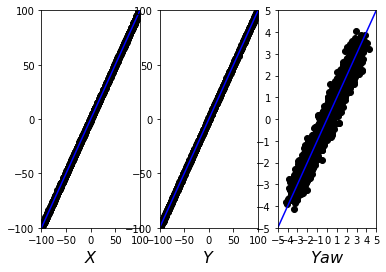

100%|██████████| 24/24 [00:01<00:00, 21.29it/s]

Epoch: 264 Train loss: -0.1590


Test loss: -0.1057


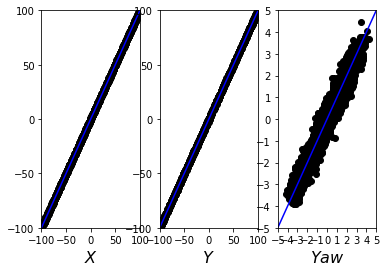

100%|██████████| 24/24 [00:00<00:00, 32.75it/s]

Epoch: 265 Train loss: -0.1627


Test loss: -0.1116


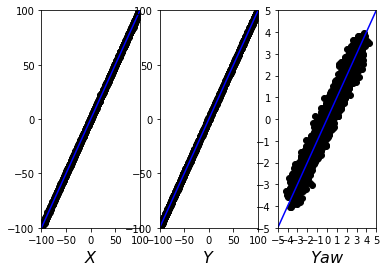

100%|██████████| 24/24 [00:01<00:00, 16.92it/s]

Epoch: 266 Train loss: -0.1629


Test loss: -0.1080


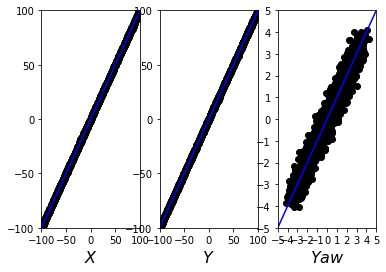

100%|██████████| 24/24 [00:00<00:00, 37.98it/s]

Epoch: 267 Train loss: -0.1640


Test loss: -0.1040


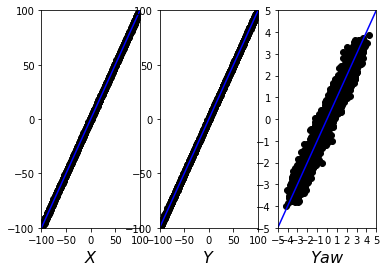

100%|██████████| 24/24 [00:00<00:00, 38.12it/s]

Epoch: 268 Train loss: -0.1665


Test loss: -0.1229


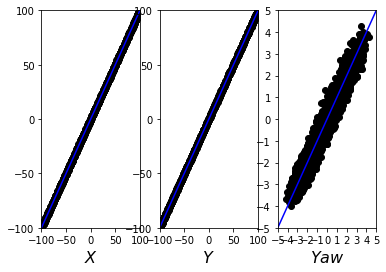

100%|██████████| 24/24 [00:01<00:00, 17.90it/s]

Epoch: 269 Train loss: -0.1706


Test loss: -0.1161


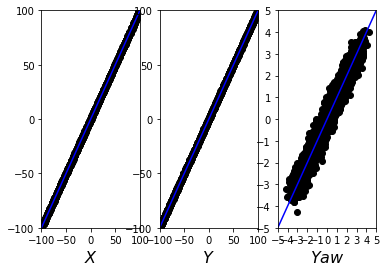

100%|██████████| 24/24 [00:00<00:00, 18.24it/s]

Epoch: 270 Train loss: -0.1705


Test loss: -0.1161


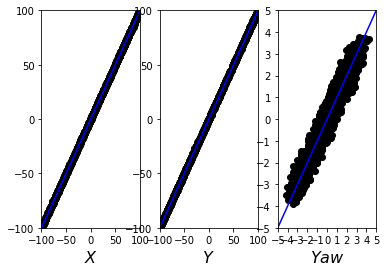

100%|██████████| 24/24 [00:00<00:00, 36.65it/s]

Epoch: 271 Train loss: -0.1768


Test loss: -0.1161


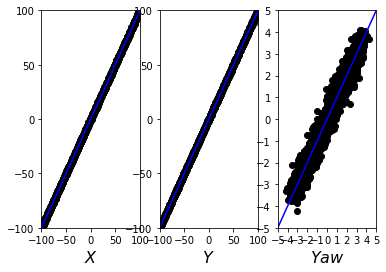

100%|██████████| 24/24 [00:01<00:00, 18.31it/s]

Epoch: 272 Train loss: -0.1757


Test loss: -0.1138


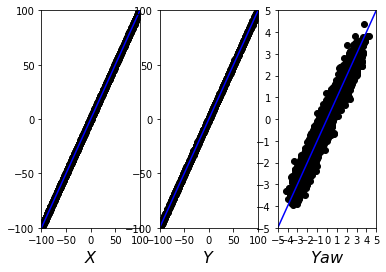

100%|██████████| 24/24 [00:01<00:00, 18.33it/s]

Epoch: 273 Train loss: -0.1807


Test loss: -0.1202


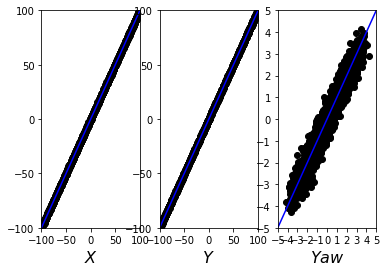

100%|██████████| 24/24 [00:00<00:00, 17.46it/s]

Epoch: 274 Train loss: -0.1878


Test loss: -0.1272


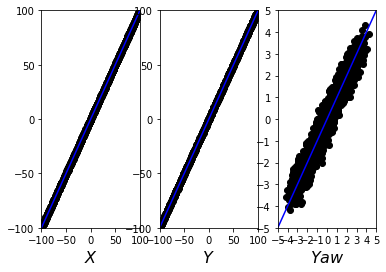

100%|██████████| 24/24 [00:01<00:00, 17.22it/s]

Epoch: 275 Train loss: -0.1861


Test loss: -0.1062


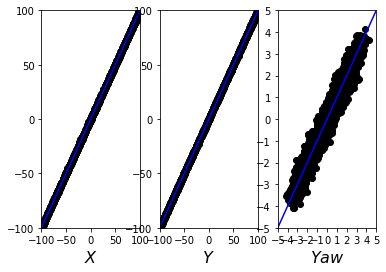

100%|██████████| 24/24 [00:00<00:00, 16.79it/s]

Epoch: 276 Train loss: -0.1866


Test loss: -0.1238


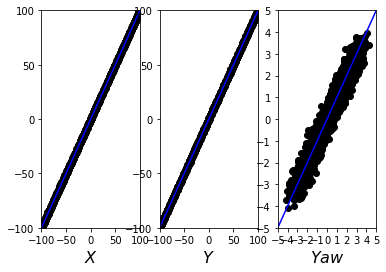

100%|██████████| 24/24 [00:00<00:00, 17.45it/s]

Epoch: 277 Train loss: -0.1902


Test loss: -0.1235


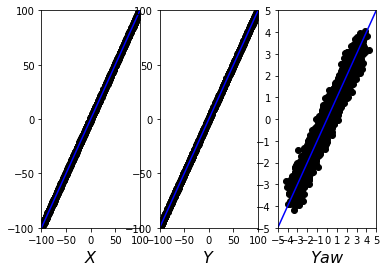

100%|██████████| 24/24 [00:02<00:00, 10.82it/s]

Epoch: 278 Train loss: -0.1951


Test loss: -0.1280


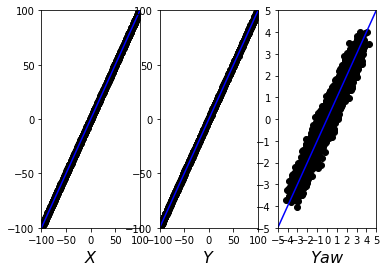

100%|██████████| 24/24 [00:00<00:00, 31.21it/s]

Epoch: 279 Train loss: -0.1966


Test loss: -0.1263


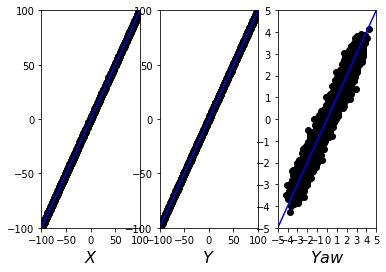

100%|██████████| 24/24 [00:01<00:00, 20.56it/s]

Epoch: 280 Train loss: -0.1942


Test loss: -0.1187


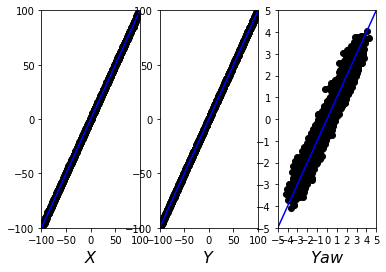

100%|██████████| 24/24 [00:01<00:00, 13.79it/s]

Epoch: 281 Train loss: -0.1988


Test loss: -0.1328


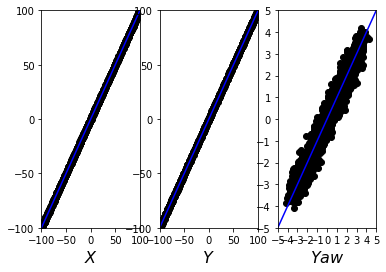

100%|██████████| 24/24 [00:00<00:00, 33.29it/s]


Epoch: 282 Train loss: -0.2051
Test loss: -0.1275


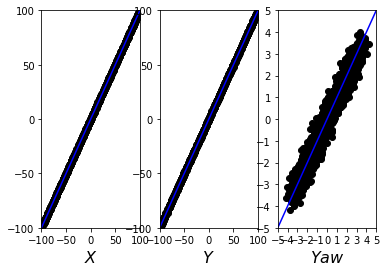

100%|██████████| 24/24 [00:01<00:00, 22.19it/s]

Epoch: 283 Train loss: -0.2060


Test loss: -0.1321


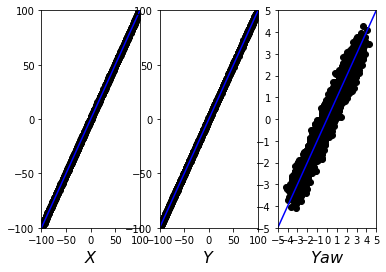

100%|██████████| 24/24 [00:00<00:00, 15.88it/s]

Epoch: 284 Train loss: -0.2095


Test loss: -0.1335


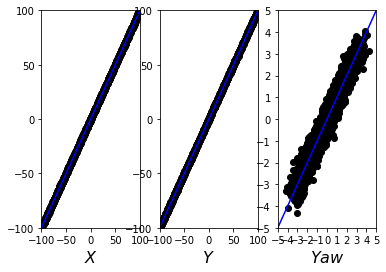

100%|██████████| 24/24 [00:00<00:00, 36.19it/s]

Epoch: 285 Train loss: -0.2095


Test loss: -0.1369


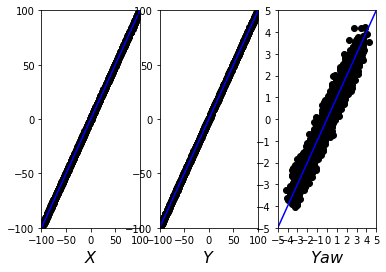

100%|██████████| 24/24 [00:00<00:00, 34.94it/s]

Epoch: 286 Train loss: -0.2086


Test loss: -0.1389


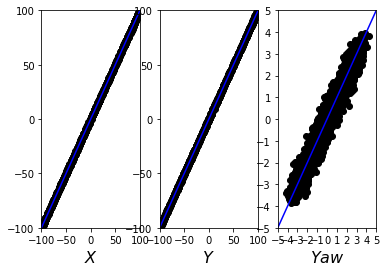

100%|██████████| 24/24 [00:00<00:00, 17.97it/s]


Epoch: 287 Train loss: -0.2120
Test loss: -0.1348


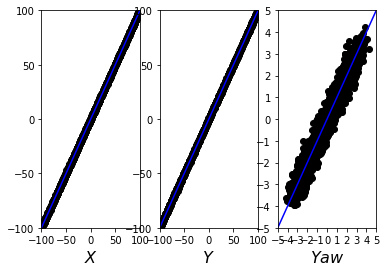

100%|██████████| 24/24 [00:00<00:00, 25.61it/s]

Epoch: 288 Train loss: -0.2092


Test loss: -0.1262


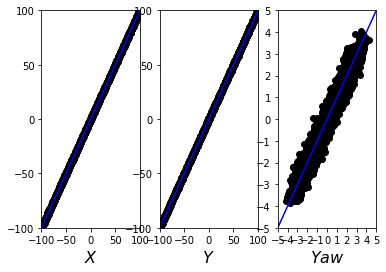

100%|██████████| 24/24 [00:00<00:00, 24.40it/s]

Epoch: 289 Train loss: -0.2073


Test loss: -0.1387


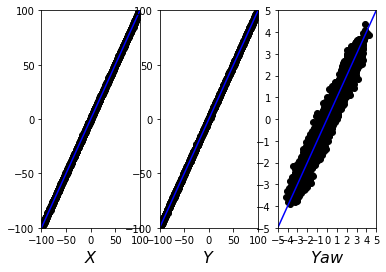

100%|██████████| 24/24 [00:00<00:00, 28.86it/s]

Epoch: 290 Train loss: -0.2162


Test loss: -0.1479


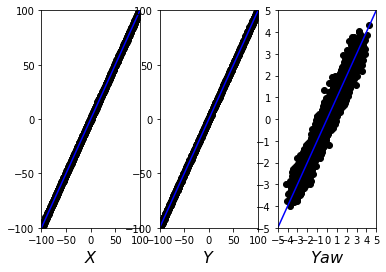

100%|██████████| 24/24 [00:00<00:00, 34.17it/s]

Epoch: 291 Train loss: -0.2152


Test loss: -0.1416


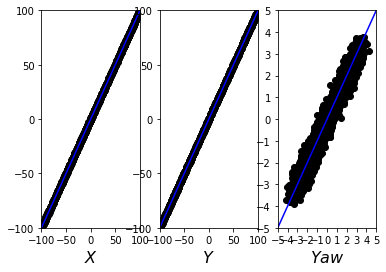

100%|██████████| 24/24 [00:00<00:00, 25.75it/s]

Epoch: 292 Train loss: -0.2179


Test loss: -0.1509


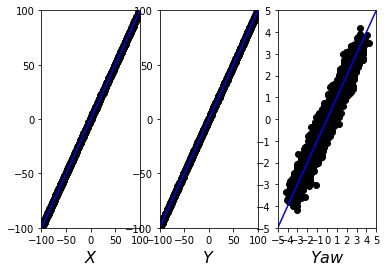

100%|██████████| 24/24 [00:00<00:00, 30.05it/s]

Epoch: 293 Train loss: -0.2178


Test loss: -0.1489


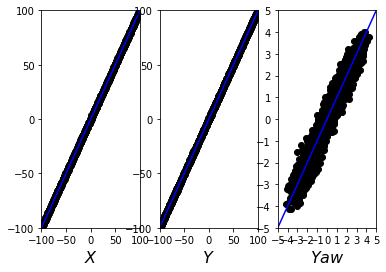

100%|██████████| 24/24 [00:00<00:00, 18.33it/s]

Epoch: 294 Train loss: -0.2210


Test loss: -0.1472


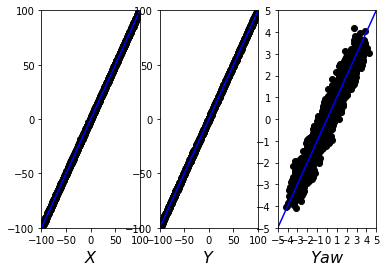

100%|██████████| 24/24 [00:00<00:00, 33.21it/s]

Epoch: 295 Train loss: -0.2200


Test loss: -0.1453


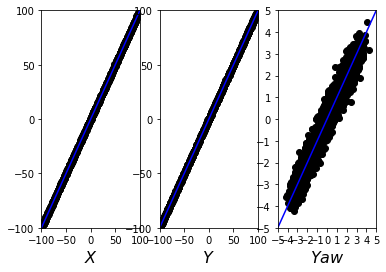

100%|██████████| 24/24 [00:00<00:00, 14.56it/s]


Epoch: 296 Train loss: -0.2196
Test loss: -0.1555


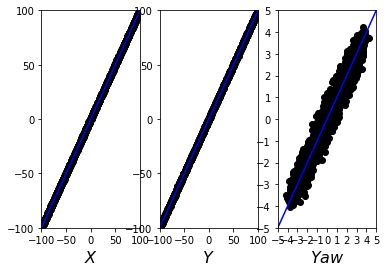

100%|██████████| 24/24 [00:00<00:00, 30.29it/s]

Epoch: 297 Train loss: -0.2225


Test loss: -0.1547


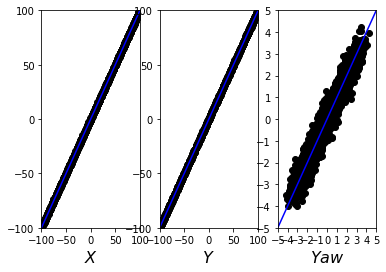

100%|██████████| 24/24 [00:01<00:00, 15.27it/s]

Epoch: 298 Train loss: -0.2246


Test loss: -0.1572


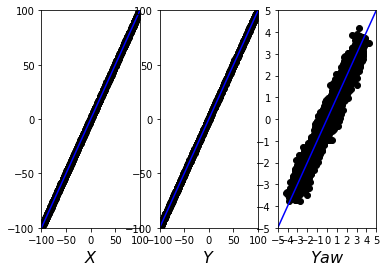

100%|██████████| 24/24 [00:00<00:00, 25.69it/s]

Epoch: 299 Train loss: -0.2272


Test loss: -0.1587


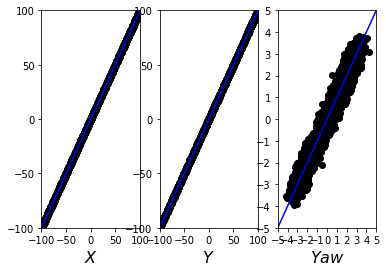

100%|██████████| 24/24 [00:01<00:00, 18.31it/s]

Epoch: 300 Train loss: -0.2252


Test loss: -0.1592


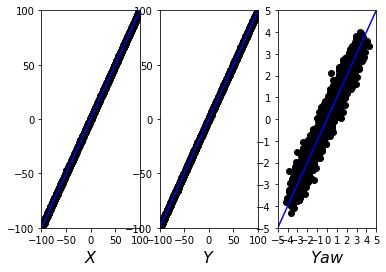

100%|██████████| 24/24 [00:00<00:00, 15.75it/s]

Epoch: 301 Train loss: -0.2202


Test loss: -0.1553


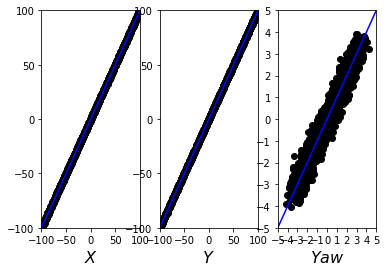

100%|██████████| 24/24 [00:00<00:00, 26.12it/s]

Epoch: 302 Train loss: -0.2219


Test loss: -0.1563


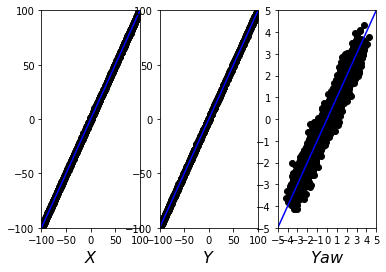

100%|██████████| 24/24 [00:01<00:00, 23.04it/s]

Epoch: 303 Train loss: -0.2265


Test loss: -0.1557


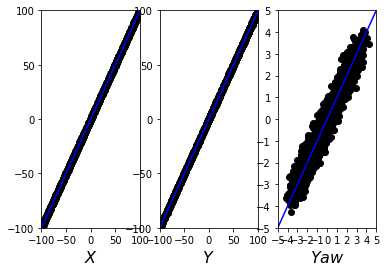

100%|██████████| 24/24 [00:00<00:00, 28.82it/s]

Epoch: 304 Train loss: -0.2279


Test loss: -0.1606


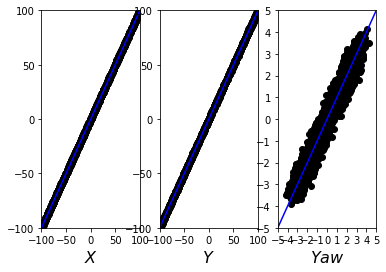

100%|██████████| 24/24 [00:02<00:00, 11.98it/s]

Epoch: 305 Train loss: -0.2288


Test loss: -0.1660


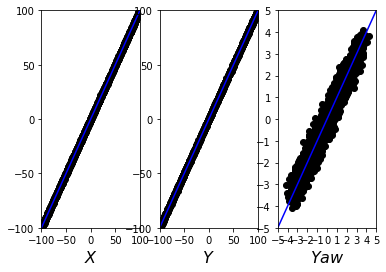

100%|██████████| 24/24 [00:01<00:00, 19.59it/s]

Epoch: 306 Train loss: -0.2337


Test loss: -0.1663


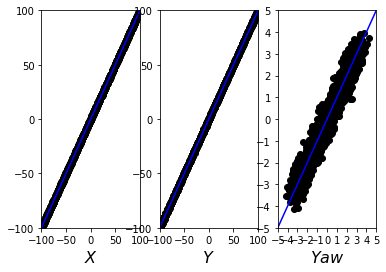

100%|██████████| 24/24 [00:00<00:00, 15.56it/s]

Epoch: 307 Train loss: -0.2342


Test loss: -0.1672


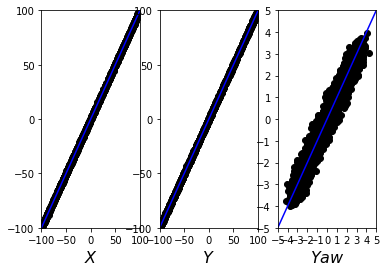

100%|██████████| 24/24 [00:01<00:00, 20.01it/s]

Epoch: 308 Train loss: -0.2346


Test loss: -0.1692


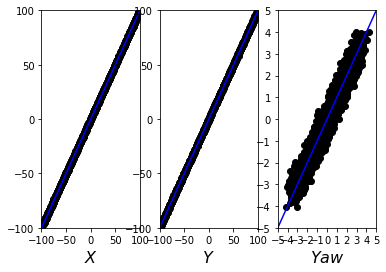

100%|██████████| 24/24 [00:01<00:00, 21.51it/s]

Epoch: 309 Train loss: -0.2389


Test loss: -0.1670


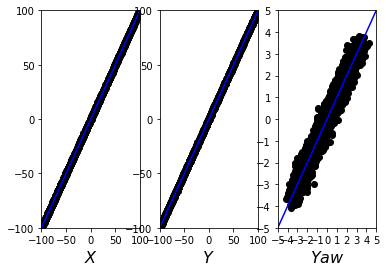

100%|██████████| 24/24 [00:01<00:00, 15.75it/s]

Epoch: 310 Train loss: -0.2389


Test loss: -0.1672


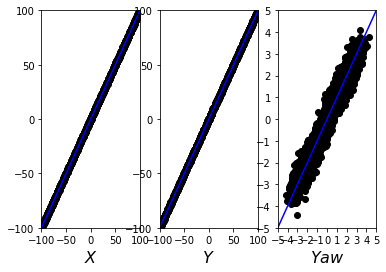

100%|██████████| 24/24 [00:00<00:00, 32.46it/s]

Epoch: 311 Train loss: -0.2334


Test loss: -0.1690


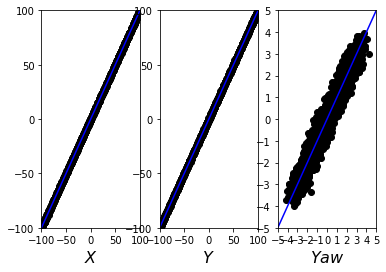

100%|██████████| 24/24 [00:00<00:00, 30.03it/s]

Epoch: 312 Train loss: -0.2381


Test loss: -0.1743


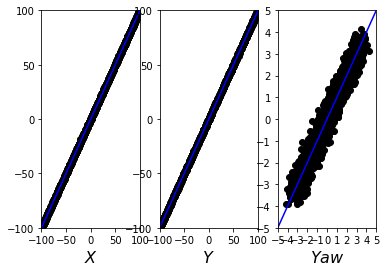

100%|██████████| 24/24 [00:00<00:00, 16.47it/s]

Epoch: 313 Train loss: -0.2417


Test loss: -0.1752


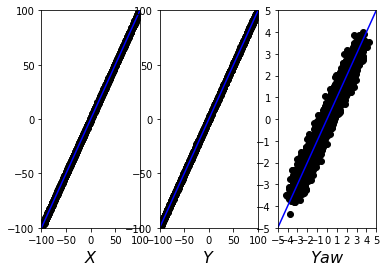

100%|██████████| 24/24 [00:00<00:00, 34.68it/s]

Epoch: 314 Train loss: -0.2388


Test loss: -0.1667


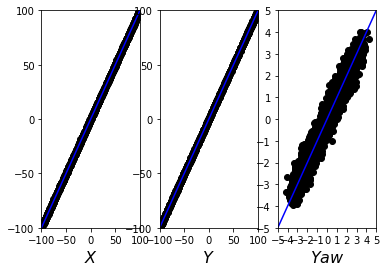

100%|██████████| 24/24 [00:00<00:00, 32.99it/s]

Epoch: 315 Train loss: -0.2379


Test loss: -0.1714


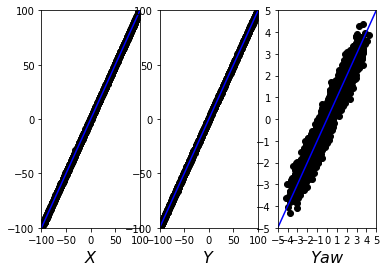

100%|██████████| 24/24 [00:01<00:00, 16.77it/s]

Epoch: 316 Train loss: -0.2398


Test loss: -0.1714


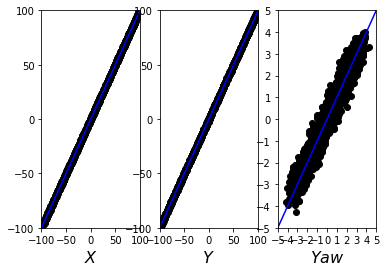

100%|██████████| 24/24 [00:00<00:00, 36.26it/s]

Epoch: 317 Train loss: -0.2446


Test loss: -0.1764


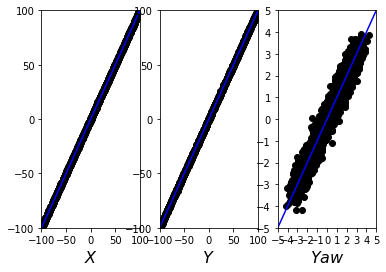

100%|██████████| 24/24 [00:00<00:00, 22.05it/s]

Epoch: 318 Train loss: -0.2457


Test loss: -0.1744


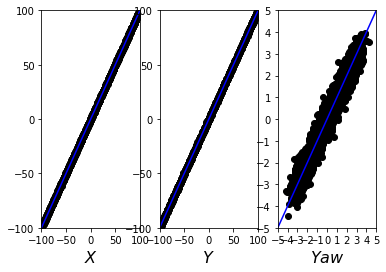

100%|██████████| 24/24 [00:00<00:00, 30.19it/s]

Epoch: 319 Train loss: -0.2428


Test loss: -0.1727


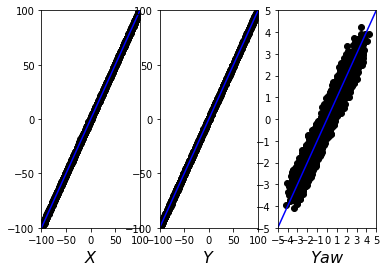

100%|██████████| 24/24 [00:00<00:00, 28.63it/s]

Epoch: 320 Train loss: -0.2474


Test loss: -0.1806


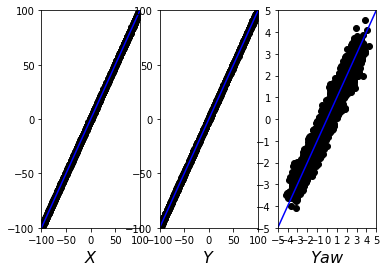

100%|██████████| 24/24 [00:00<00:00, 16.48it/s]

Epoch: 321 Train loss: -0.2440


Test loss: -0.1789


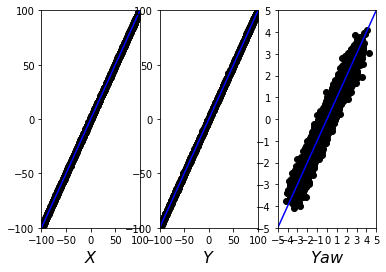

100%|██████████| 24/24 [00:01<00:00, 18.06it/s]


Epoch: 322 Train loss: -0.2483
Test loss: -0.1830


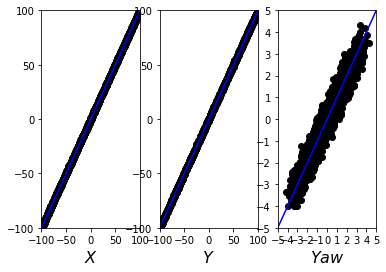

100%|██████████| 24/24 [00:00<00:00, 25.03it/s]

Epoch: 323 Train loss: -0.2439


Test loss: -0.1792


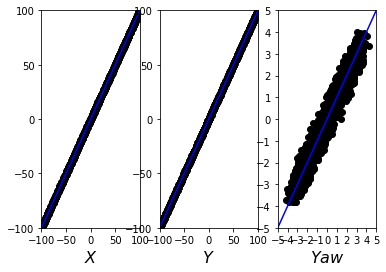

100%|██████████| 24/24 [00:00<00:00, 18.33it/s]


Epoch: 324 Train loss: -0.2438
Test loss: -0.1837


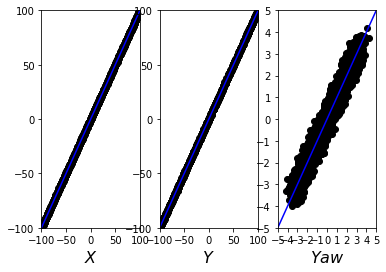

100%|██████████| 24/24 [00:00<00:00, 16.59it/s]


Epoch: 325 Train loss: -0.2471
Test loss: -0.1799


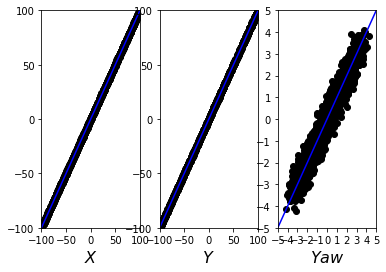

100%|██████████| 24/24 [00:00<00:00, 20.87it/s]

Epoch: 326 Train loss: -0.2468


Test loss: -0.1870


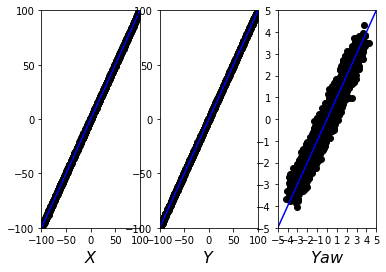

100%|██████████| 24/24 [00:01<00:00, 19.33it/s]

Epoch: 327 Train loss: -0.2446


Test loss: -0.1914


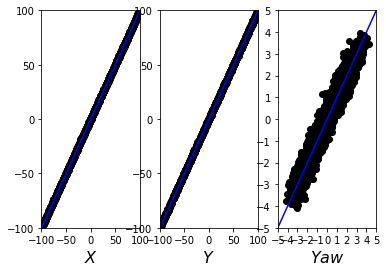

100%|██████████| 24/24 [00:00<00:00, 21.63it/s]

Epoch: 328 Train loss: -0.2518


Test loss: -0.1916


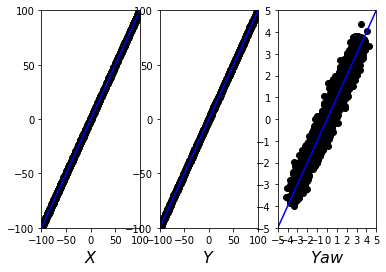

100%|██████████| 24/24 [00:00<00:00, 35.60it/s]

Epoch: 329 Train loss: -0.2525


Test loss: -0.1955


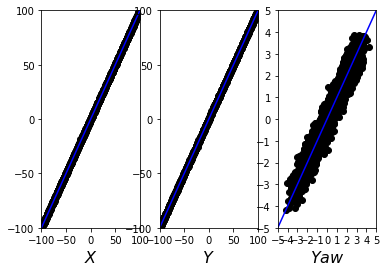

100%|██████████| 24/24 [00:00<00:00, 23.05it/s]


Epoch: 330 Train loss: -0.2568
Test loss: -0.1943


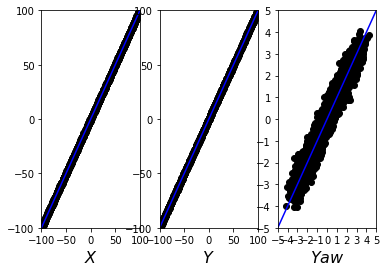

100%|██████████| 24/24 [00:01<00:00, 15.75it/s]

Epoch: 331 Train loss: -0.2549


Test loss: -0.1955


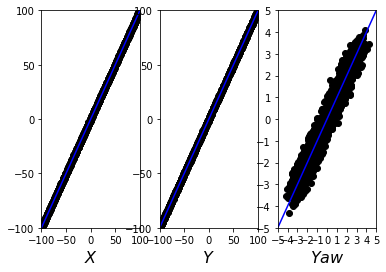

100%|██████████| 24/24 [00:00<00:00, 32.28it/s]

Epoch: 332 Train loss: -0.2556


Test loss: -0.2002


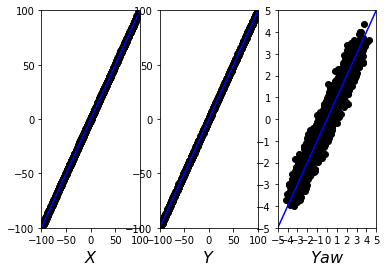

100%|██████████| 24/24 [00:00<00:00, 33.21it/s]

Epoch: 333 Train loss: -0.2536


Test loss: -0.1959


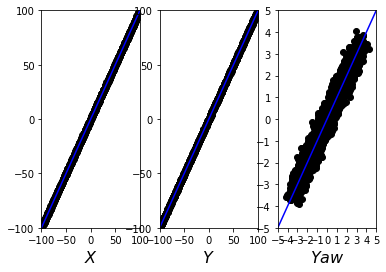

100%|██████████| 24/24 [00:00<00:00, 31.61it/s]

Epoch: 334 Train loss: -0.2538


Test loss: -0.1935


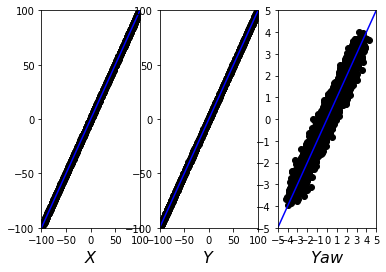

100%|██████████| 24/24 [00:01<00:00, 19.03it/s]


Epoch: 335 Train loss: -0.2598
Test loss: -0.2004


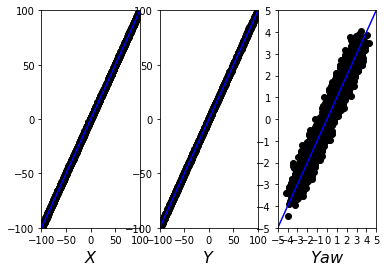

100%|██████████| 24/24 [00:01<00:00, 17.48it/s]

Epoch: 336 Train loss: -0.2571


Test loss: -0.1951


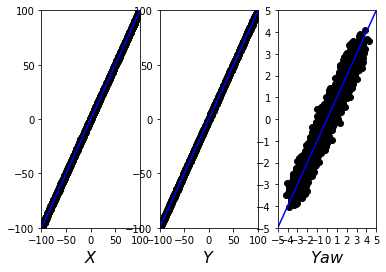

100%|██████████| 24/24 [00:01<00:00, 22.79it/s]

Epoch: 337 Train loss: -0.2539


Test loss: -0.1926


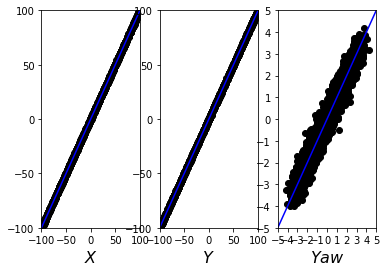

100%|██████████| 24/24 [00:01<00:00, 17.33it/s]

Epoch: 338 Train loss: -0.2539


Test loss: -0.1897


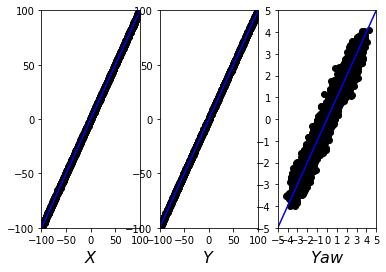

100%|██████████| 24/24 [00:01<00:00, 18.81it/s]

Epoch: 339 Train loss: -0.2589


Test loss: -0.2023


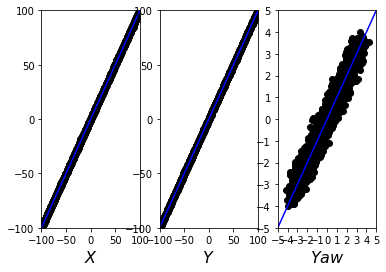

100%|██████████| 24/24 [00:00<00:00, 20.80it/s]

Epoch: 340 Train loss: -0.2552


Test loss: -0.2014


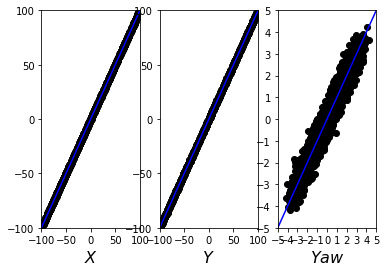

100%|██████████| 24/24 [00:01<00:00, 23.01it/s]

Epoch: 341 Train loss: -0.2595


Test loss: -0.2027


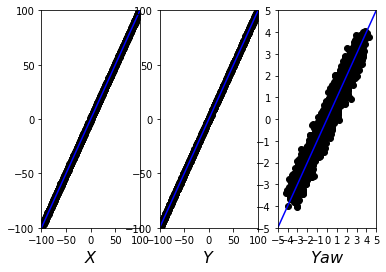

100%|██████████| 24/24 [00:02<00:00,  8.46it/s]

Epoch: 342 Train loss: -0.2641


Test loss: -0.2050


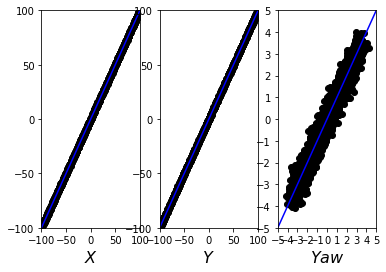

100%|██████████| 24/24 [00:00<00:00, 19.27it/s]


Epoch: 343 Train loss: -0.2638
Test loss: -0.2053


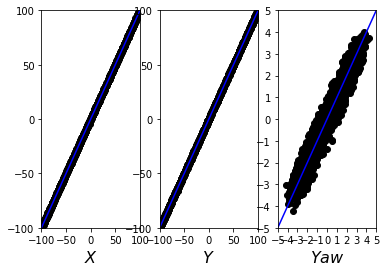

100%|██████████| 24/24 [00:00<00:00, 16.16it/s]

Epoch: 344 Train loss: -0.2624


Test loss: -0.2029


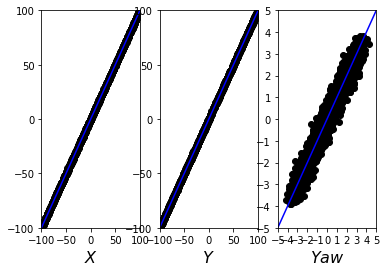

100%|██████████| 24/24 [00:00<00:00, 21.21it/s]

Epoch: 345 Train loss: -0.2569


Test loss: -0.2059


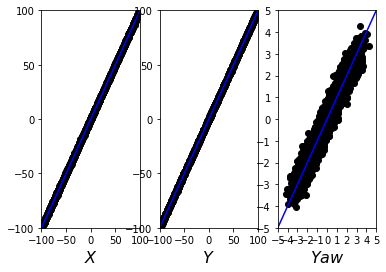

100%|██████████| 24/24 [00:00<00:00, 16.92it/s]

Epoch: 346 Train loss: -0.2602


Test loss: -0.2101


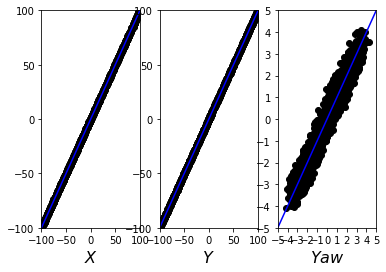

100%|██████████| 24/24 [00:00<00:00, 24.92it/s]

Epoch: 347 Train loss: -0.2642


Test loss: -0.2100


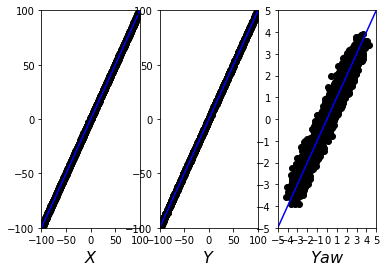

100%|██████████| 24/24 [00:00<00:00, 31.93it/s]

Epoch: 348 Train loss: -0.2671


Test loss: -0.2130


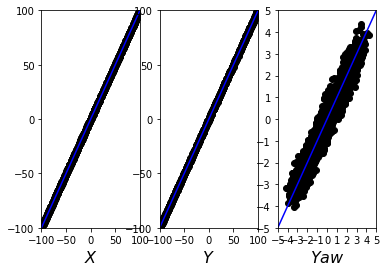

100%|██████████| 24/24 [00:01<00:00, 19.68it/s]

Epoch: 349 Train loss: -0.2662


Test loss: -0.2059


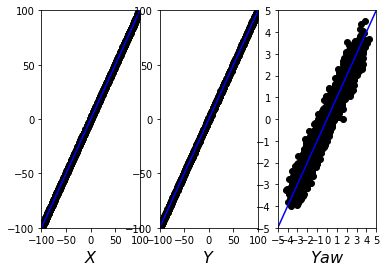

100%|██████████| 24/24 [00:01<00:00, 18.44it/s]

Epoch: 350 Train loss: -0.2688


Test loss: -0.2126


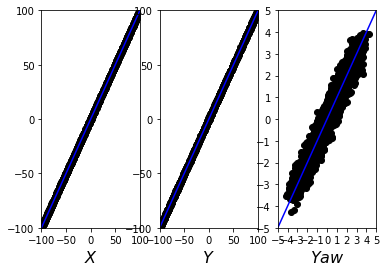

100%|██████████| 24/24 [00:00<00:00, 22.37it/s]

Epoch: 351 Train loss: -0.2691


Test loss: -0.2127


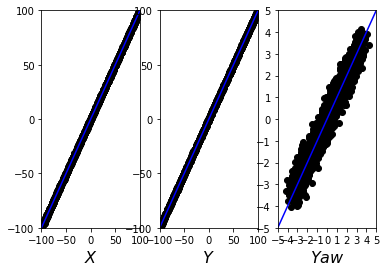

100%|██████████| 24/24 [00:01<00:00, 12.49it/s]

Epoch: 352 Train loss: -0.2707


Test loss: -0.2110


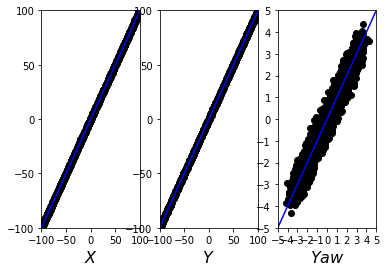

100%|██████████| 24/24 [00:00<00:00, 21.56it/s]


Epoch: 353 Train loss: -0.2711
Test loss: -0.2027


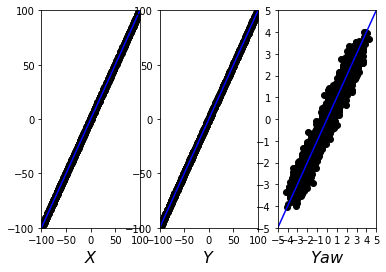

100%|██████████| 24/24 [00:00<00:00, 18.81it/s]

Epoch: 354 Train loss: -0.2662


Test loss: -0.2141


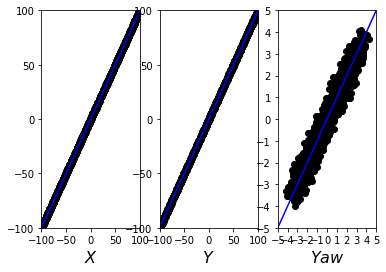

100%|██████████| 24/24 [00:01<00:00, 18.84it/s]

Epoch: 355 Train loss: -0.2713


Test loss: -0.2143


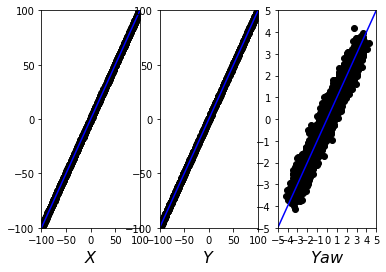

100%|██████████| 24/24 [00:00<00:00, 17.47it/s]

Epoch: 356 Train loss: -0.2705


Test loss: -0.2173


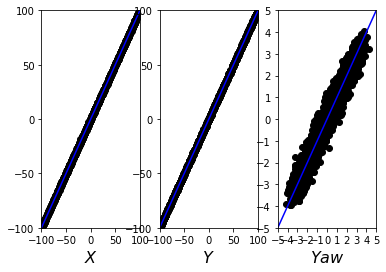

100%|██████████| 24/24 [00:01<00:00, 18.19it/s]

Epoch: 357 Train loss: -0.2717


Test loss: -0.2165


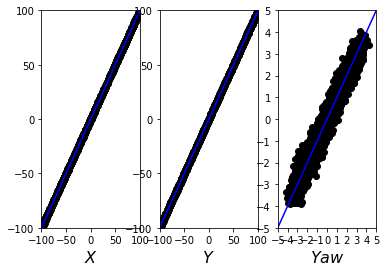

100%|██████████| 24/24 [00:01<00:00, 15.77it/s]

Epoch: 358 Train loss: -0.2729


Test loss: -0.2150


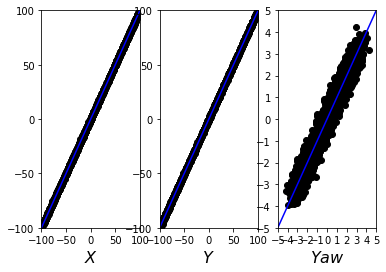

100%|██████████| 24/24 [00:01<00:00, 21.63it/s]

Epoch: 359 Train loss: -0.2739


Test loss: -0.2179


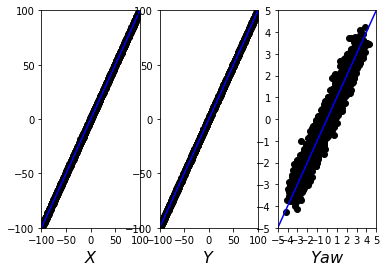

100%|██████████| 24/24 [00:00<00:00, 27.76it/s]


Epoch: 360 Train loss: -0.2782
Test loss: -0.2237


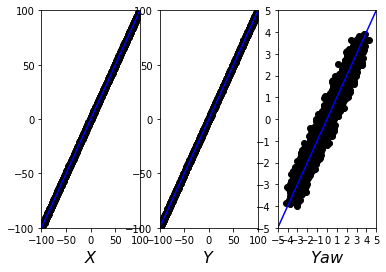

100%|██████████| 24/24 [00:01<00:00, 22.05it/s]

Epoch: 361 Train loss: -0.2748


Test loss: -0.2163


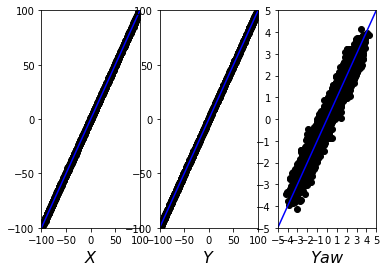

100%|██████████| 24/24 [00:00<00:00, 21.85it/s]

Epoch: 362 Train loss: -0.2771


Test loss: -0.2197


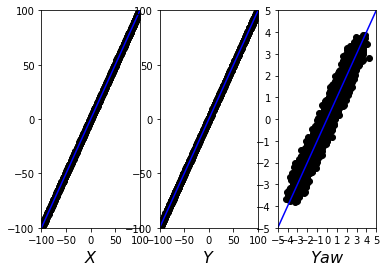

100%|██████████| 24/24 [00:00<00:00, 24.82it/s]

Epoch: 363 Train loss: -0.2776


Test loss: -0.2218


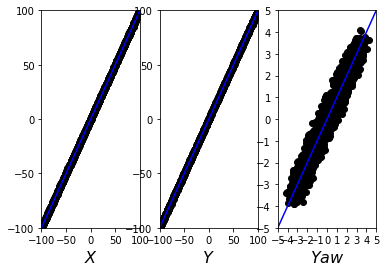

100%|██████████| 24/24 [00:00<00:00, 31.75it/s]

Epoch: 364 Train loss: -0.2763


Test loss: -0.2192


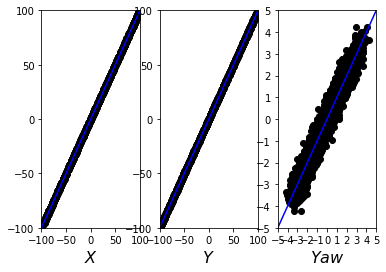

100%|██████████| 24/24 [00:00<00:00, 18.13it/s]

Epoch: 365 Train loss: -0.2785


Test loss: -0.2197


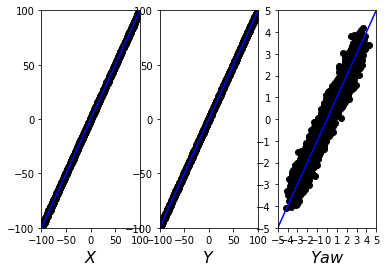

100%|██████████| 24/24 [00:01<00:00, 23.71it/s]

Epoch: 366 Train loss: -0.2794


Test loss: -0.2208


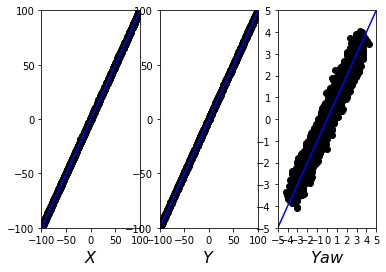

100%|██████████| 24/24 [00:00<00:00, 16.47it/s]

Epoch: 367 Train loss: -0.2808


Test loss: -0.2212


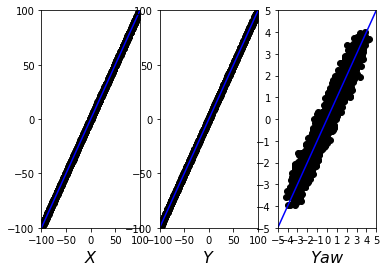

100%|██████████| 24/24 [00:00<00:00, 17.32it/s]

Epoch: 368 Train loss: -0.2840


Test loss: -0.2217


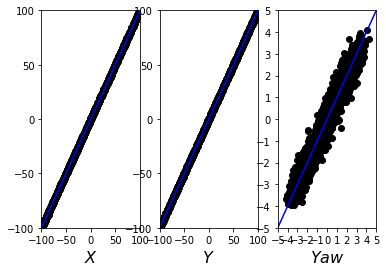

100%|██████████| 24/24 [00:01<00:00, 20.56it/s]

Epoch: 369 Train loss: -0.2826


Test loss: -0.2273


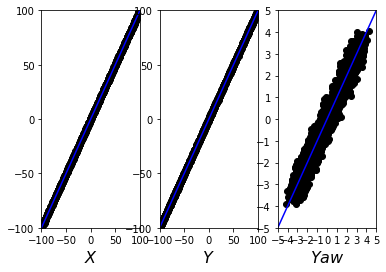

100%|██████████| 24/24 [00:00<00:00, 24.95it/s]

Epoch: 370 Train loss: -0.2814


Test loss: -0.2280


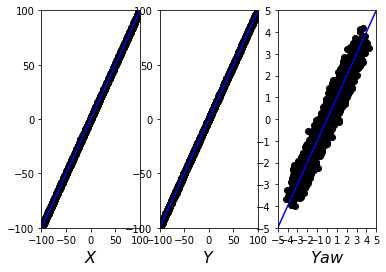

100%|██████████| 24/24 [00:00<00:00, 30.85it/s]

Epoch: 371 Train loss: -0.2828


Test loss: -0.2281


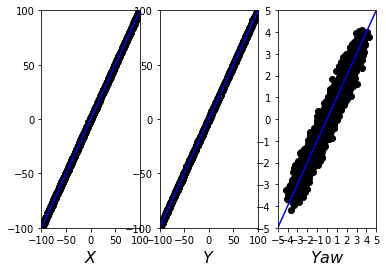

100%|██████████| 24/24 [00:01<00:00, 23.57it/s]

Epoch: 372 Train loss: -0.2810


Test loss: -0.2224


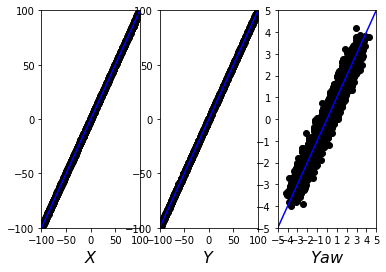

100%|██████████| 24/24 [00:00<00:00, 19.10it/s]

Epoch: 373 Train loss: -0.2832


Test loss: -0.2300


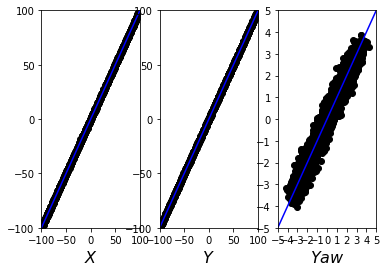

100%|██████████| 24/24 [00:01<00:00, 18.38it/s]

Epoch: 374 Train loss: -0.2856


Test loss: -0.2263


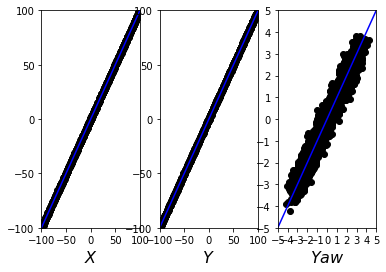

100%|██████████| 24/24 [00:00<00:00, 18.84it/s]

Epoch: 375 Train loss: -0.2851


Test loss: -0.2237


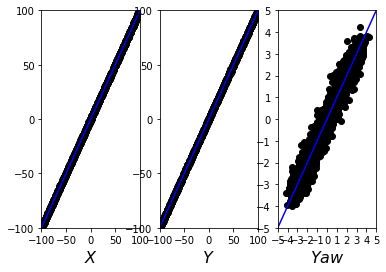

100%|██████████| 24/24 [00:00<00:00, 19.32it/s]

Epoch: 376 Train loss: -0.2822


Test loss: -0.2301


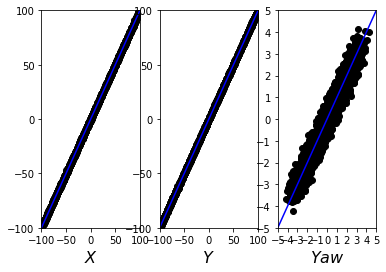

100%|██████████| 24/24 [00:00<00:00, 31.70it/s]

Epoch: 377 Train loss: -0.2812


Test loss: -0.2287


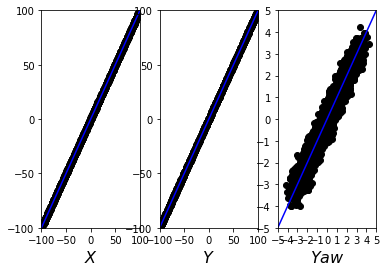

100%|██████████| 24/24 [00:00<00:00, 21.90it/s]

Epoch: 378 Train loss: -0.2843


Test loss: -0.2337


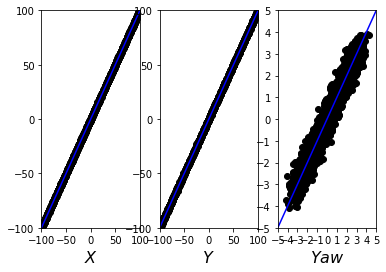

100%|██████████| 24/24 [00:00<00:00, 16.04it/s]


Epoch: 379 Train loss: -0.2844
Test loss: -0.2308


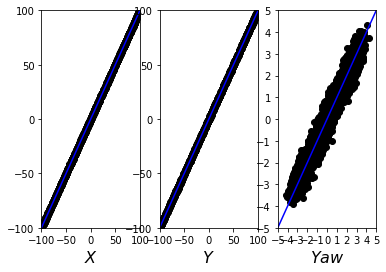

100%|██████████| 24/24 [00:01<00:00, 12.93it/s]

Epoch: 380 Train loss: -0.2889


Test loss: -0.2308


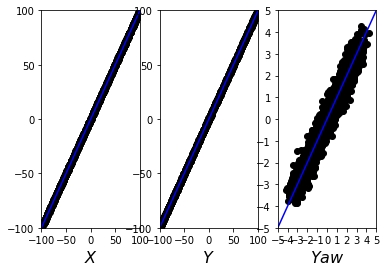

100%|██████████| 24/24 [00:00<00:00, 26.69it/s]


Epoch: 381 Train loss: -0.2857
Test loss: -0.2326


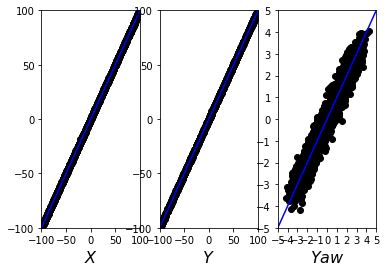

100%|██████████| 24/24 [00:00<00:00, 34.58it/s]

Epoch: 382 Train loss: -0.2857


Test loss: -0.2337


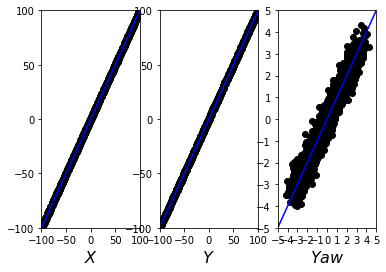

100%|██████████| 24/24 [00:01<00:00, 20.49it/s]

Epoch: 383 Train loss: -0.2903


Test loss: -0.2337


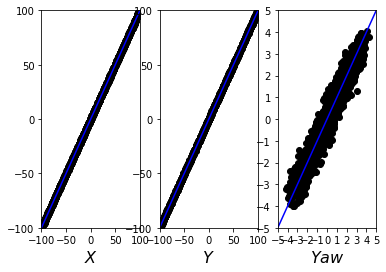

100%|██████████| 24/24 [00:01<00:00, 23.45it/s]

Epoch: 384 Train loss: -0.2909


Test loss: -0.2342


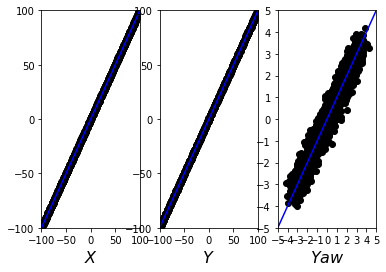

100%|██████████| 24/24 [00:00<00:00, 25.09it/s]

Epoch: 385 Train loss: -0.2875


Test loss: -0.2346


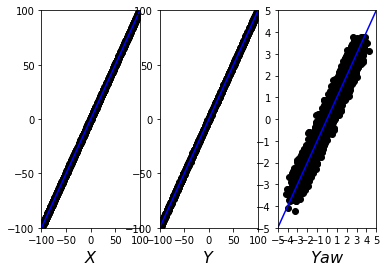

100%|██████████| 24/24 [00:00<00:00, 21.62it/s]

Epoch: 386 Train loss: -0.2931


Test loss: -0.2336


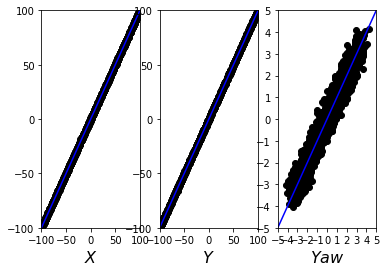

100%|██████████| 24/24 [00:01<00:00, 18.62it/s]

Epoch: 387 Train loss: -0.2924


Test loss: -0.2363


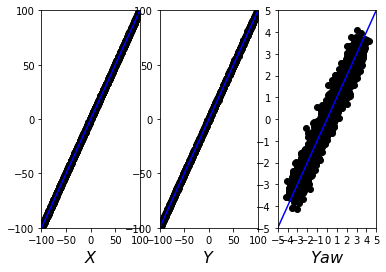

100%|██████████| 24/24 [00:00<00:00, 17.44it/s]

Epoch: 388 Train loss: -0.2933


Test loss: -0.2319


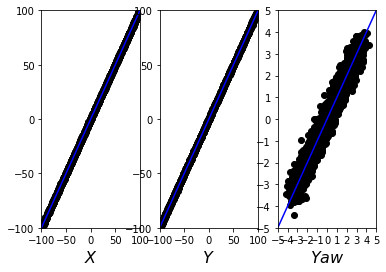

100%|██████████| 24/24 [00:01<00:00, 18.17it/s]

Epoch: 389 Train loss: -0.2880


Test loss: -0.2345


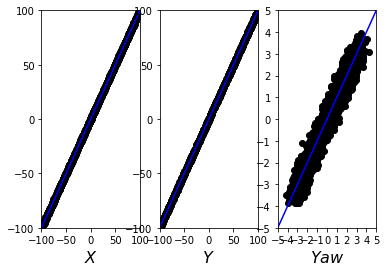

100%|██████████| 24/24 [00:00<00:00, 28.80it/s]

Epoch: 390 Train loss: -0.2872


Test loss: -0.2396


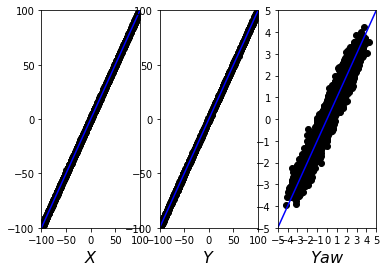

100%|██████████| 24/24 [00:01<00:00, 20.36it/s]

Epoch: 391 Train loss: -0.2912


Test loss: -0.2341


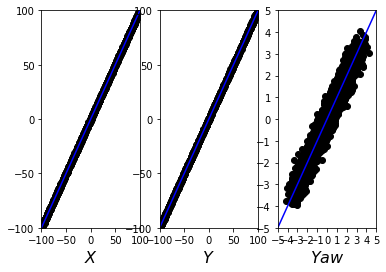

100%|██████████| 24/24 [00:00<00:00, 16.39it/s]

Epoch: 392 Train loss: -0.2928


Test loss: -0.2440


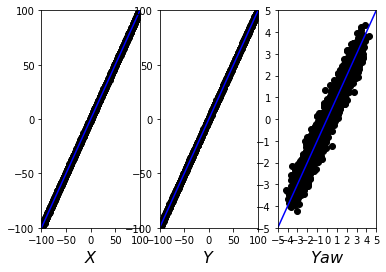

100%|██████████| 24/24 [00:00<00:00, 32.37it/s]

Epoch: 393 Train loss: -0.2985


Test loss: -0.2443


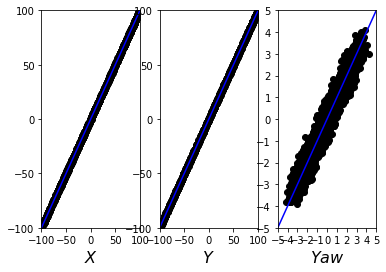

100%|██████████| 24/24 [00:00<00:00, 32.26it/s]

Epoch: 394 Train loss: -0.2965


Test loss: -0.2410


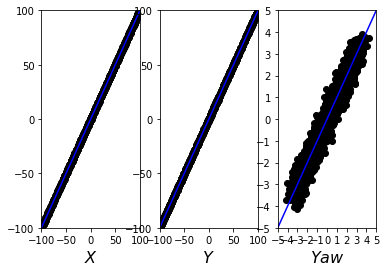

100%|██████████| 24/24 [00:00<00:00, 30.36it/s]

Epoch: 395 Train loss: -0.2969


Test loss: -0.2319


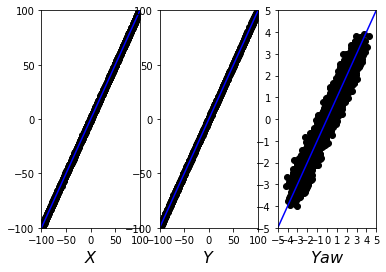

100%|██████████| 24/24 [00:00<00:00, 15.89it/s]

Epoch: 396 Train loss: -0.2952


Test loss: -0.2441


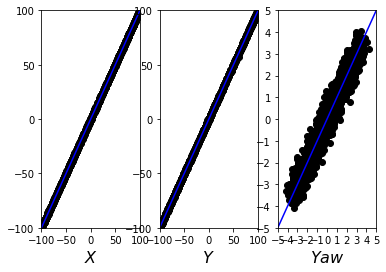

100%|██████████| 24/24 [00:01<00:00, 14.48it/s]

Epoch: 397 Train loss: -0.2958


Test loss: -0.2417


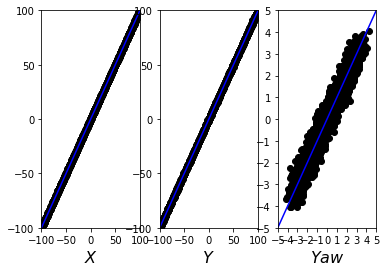

100%|██████████| 24/24 [00:00<00:00, 19.05it/s]

Epoch: 398 Train loss: -0.2973


Test loss: -0.2468


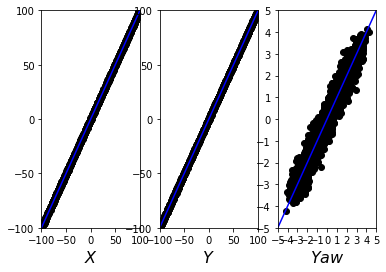

100%|██████████| 24/24 [00:00<00:00, 33.78it/s]

Epoch: 399 Train loss: -0.2960


Test loss: -0.2361


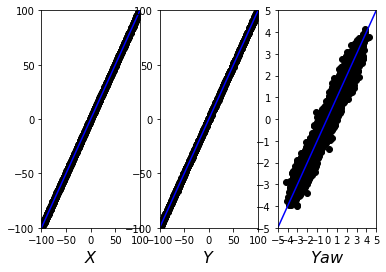

100%|██████████| 24/24 [00:00<00:00, 26.15it/s]

Epoch: 400 Train loss: -0.2983


Test loss: -0.2472


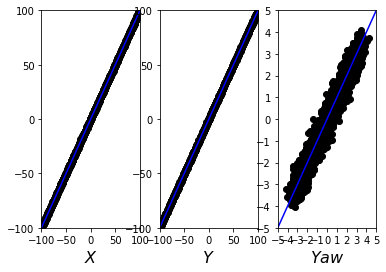

100%|██████████| 24/24 [00:00<00:00, 15.83it/s]

Epoch: 401 Train loss: -0.3011


Test loss: -0.2504


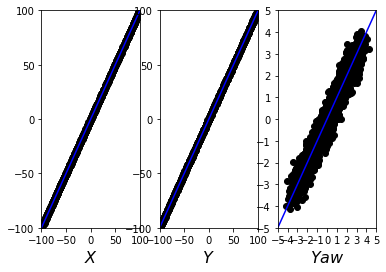

100%|██████████| 24/24 [00:01<00:00, 22.17it/s]

Epoch: 402 Train loss: -0.2980


Test loss: -0.2456


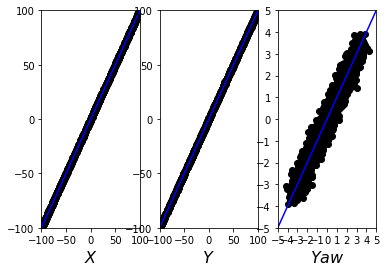

100%|██████████| 24/24 [00:00<00:00, 27.94it/s]

Epoch: 403 Train loss: -0.3015


Test loss: -0.2455


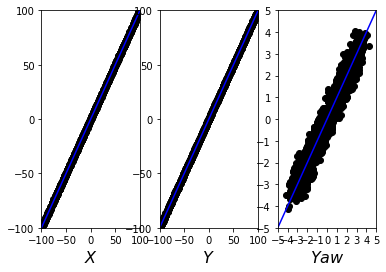

100%|██████████| 24/24 [00:01<00:00, 14.04it/s]

Epoch: 404 Train loss: -0.2992


Test loss: -0.2513


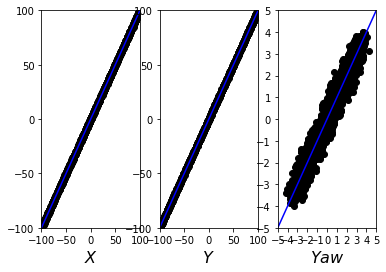

100%|██████████| 24/24 [00:01<00:00, 12.34it/s]

Epoch: 405 Train loss: -0.3053


Test loss: -0.2415


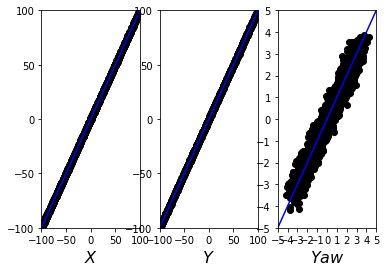

100%|██████████| 24/24 [00:00<00:00, 28.34it/s]

Epoch: 406 Train loss: -0.3007


Test loss: -0.2459


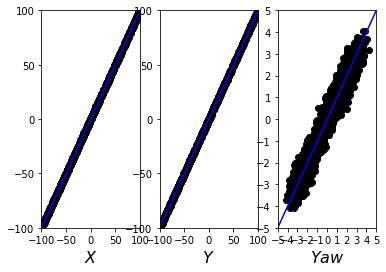

100%|██████████| 24/24 [00:01<00:00, 23.55it/s]

Epoch: 407 Train loss: -0.3026


Test loss: -0.2488


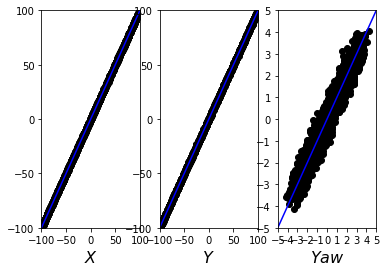

100%|██████████| 24/24 [00:00<00:00, 32.18it/s]

Epoch: 408 Train loss: -0.3003


Test loss: -0.2479


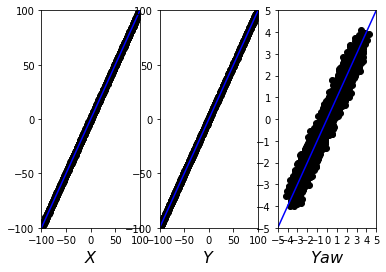

100%|██████████| 24/24 [00:00<00:00, 26.20it/s]

Epoch: 409 Train loss: -0.3012


Test loss: -0.2540


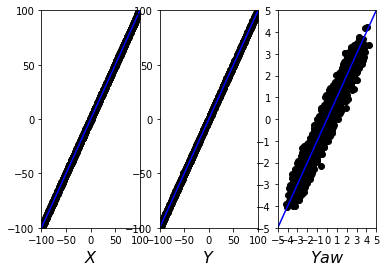

100%|██████████| 24/24 [00:01<00:00, 18.34it/s]

Epoch: 410 Train loss: -0.3024


Test loss: -0.2515


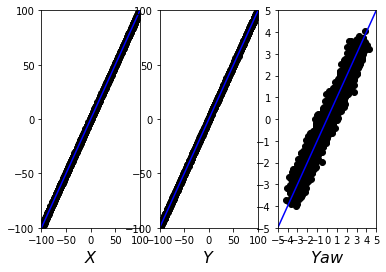

100%|██████████| 24/24 [00:00<00:00, 21.78it/s]

Epoch: 411 Train loss: -0.3044


Test loss: -0.2479


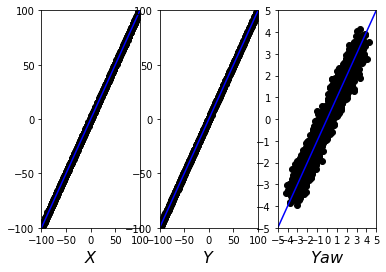

100%|██████████| 24/24 [00:00<00:00, 26.25it/s]

Epoch: 412 Train loss: -0.3073


Test loss: -0.2546


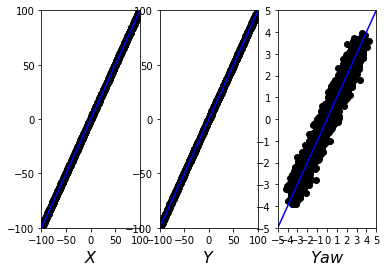

100%|██████████| 24/24 [00:01<00:00, 21.57it/s]

Epoch: 413 Train loss: -0.3086


Test loss: -0.2546


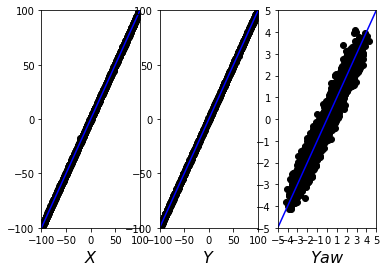

100%|██████████| 24/24 [00:01<00:00, 18.76it/s]

Epoch: 414 Train loss: -0.3075


Test loss: -0.2481


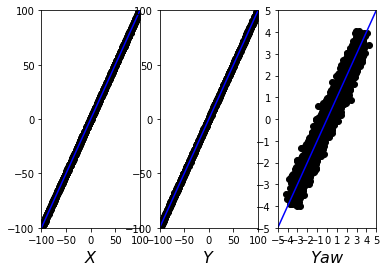

100%|██████████| 24/24 [00:01<00:00, 18.38it/s]

Epoch: 415 Train loss: -0.3087


Test loss: -0.2596


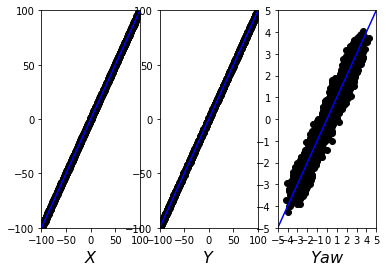

100%|██████████| 24/24 [00:00<00:00, 16.43it/s]

Epoch: 416 Train loss: -0.3110


Test loss: -0.2594


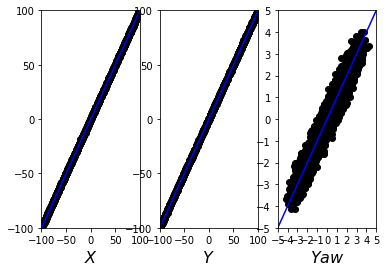

100%|██████████| 24/24 [00:01<00:00, 20.49it/s]

Epoch: 417 Train loss: -0.3090


Test loss: -0.2555


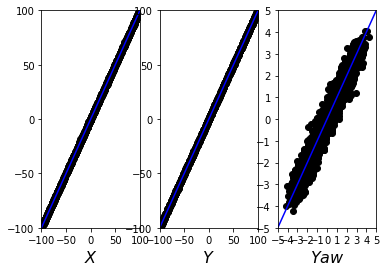

100%|██████████| 24/24 [00:01<00:00, 21.61it/s]

Epoch: 418 Train loss: -0.3099


Test loss: -0.2612


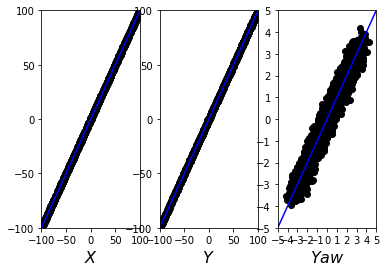

100%|██████████| 24/24 [00:03<00:00,  7.04it/s]

Epoch: 419 Train loss: -0.3137


Test loss: -0.2540


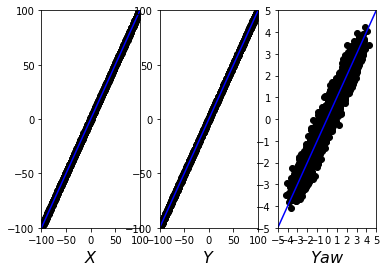

100%|██████████| 24/24 [00:01<00:00, 22.51it/s]

Epoch: 420 Train loss: -0.3109


Test loss: -0.2598


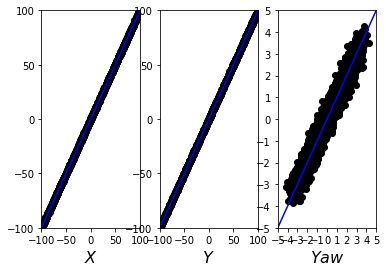

100%|██████████| 24/24 [00:02<00:00, 11.71it/s]

Epoch: 421 Train loss: -0.3106


Test loss: -0.2492


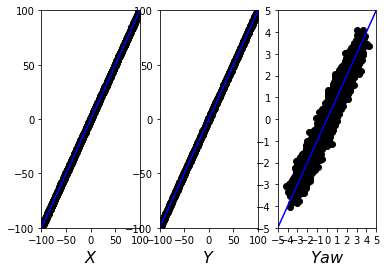

100%|██████████| 24/24 [00:01<00:00, 19.76it/s]

Epoch: 422 Train loss: -0.3108


Test loss: -0.2592


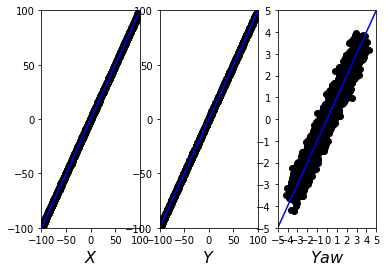

100%|██████████| 24/24 [00:01<00:00, 22.49it/s]

Epoch: 423 Train loss: -0.3092


Test loss: -0.2661


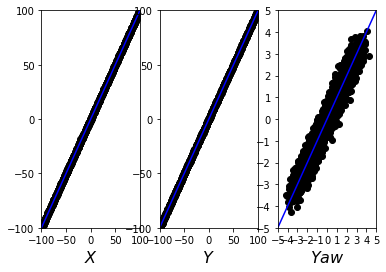

100%|██████████| 24/24 [00:00<00:00, 32.09it/s]

Epoch: 424 Train loss: -0.3152


Test loss: -0.2653


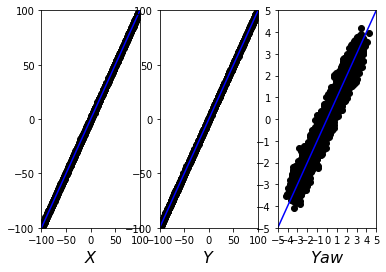

100%|██████████| 24/24 [00:02<00:00, 11.50it/s]

Epoch: 425 Train loss: -0.3165


Test loss: -0.2611


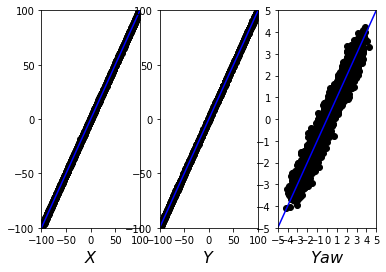

100%|██████████| 24/24 [00:01<00:00, 22.37it/s]

Epoch: 426 Train loss: -0.3136


Test loss: -0.2599


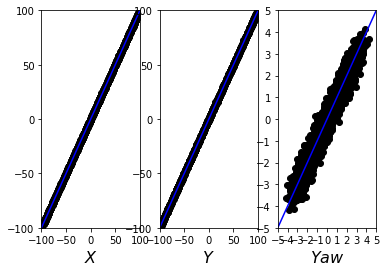

100%|██████████| 24/24 [00:00<00:00, 34.05it/s]

Epoch: 427 Train loss: -0.3130


Test loss: -0.2621


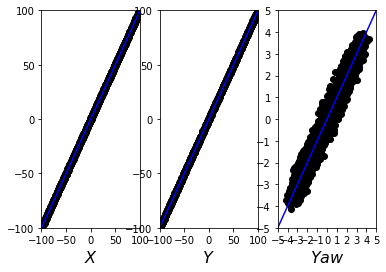

100%|██████████| 24/24 [00:00<00:00, 28.97it/s]

Epoch: 428 Train loss: -0.3184


Test loss: -0.2635


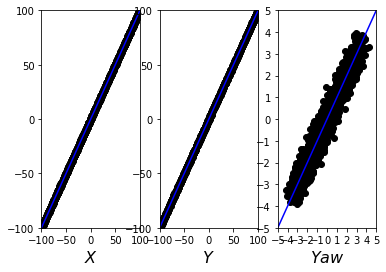

100%|██████████| 24/24 [00:00<00:00, 32.41it/s]

Epoch: 429 Train loss: -0.3183


Test loss: -0.2593


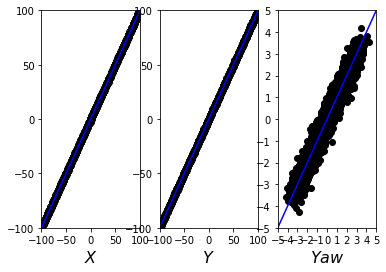

100%|██████████| 24/24 [00:01<00:00, 22.42it/s]

Epoch: 430 Train loss: -0.3167


Test loss: -0.2599


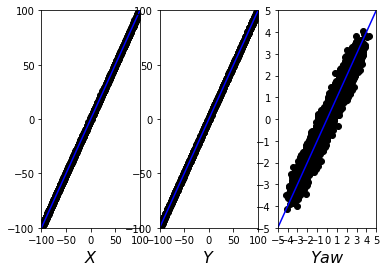

100%|██████████| 24/24 [00:01<00:00, 12.30it/s]

Epoch: 431 Train loss: -0.3190


Test loss: -0.2697


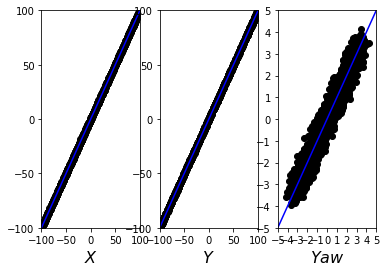

100%|██████████| 24/24 [00:01<00:00, 18.72it/s]

Epoch: 432 Train loss: -0.3174


Test loss: -0.2676


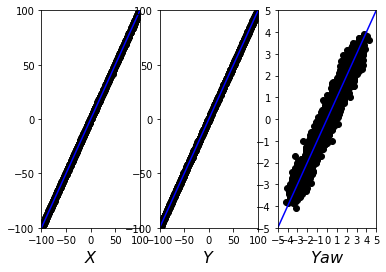

100%|██████████| 24/24 [00:01<00:00, 15.20it/s]

Epoch: 433 Train loss: -0.3195


Test loss: -0.2651


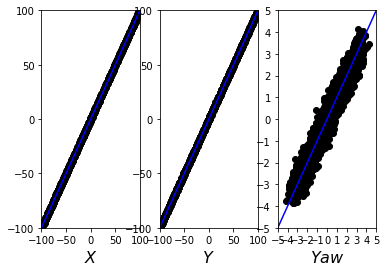

100%|██████████| 24/24 [00:00<00:00, 18.98it/s]

Epoch: 434 Train loss: -0.3172


Test loss: -0.2693


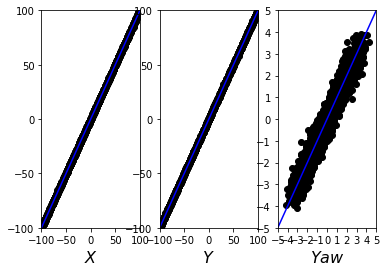

100%|██████████| 24/24 [00:01<00:00, 17.00it/s]

Epoch: 435 Train loss: -0.3205


Test loss: -0.2686


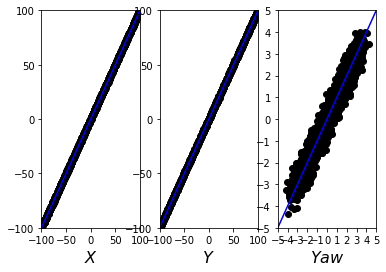

100%|██████████| 24/24 [00:01<00:00, 21.60it/s]

Epoch: 436 Train loss: -0.3205


Test loss: -0.2688


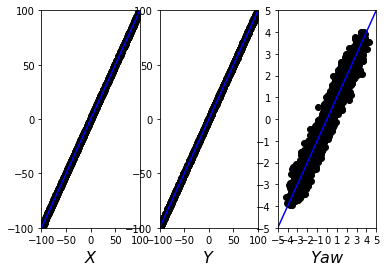

100%|██████████| 24/24 [00:00<00:00, 16.15it/s]

Epoch: 437 Train loss: -0.3158


Test loss: -0.2714


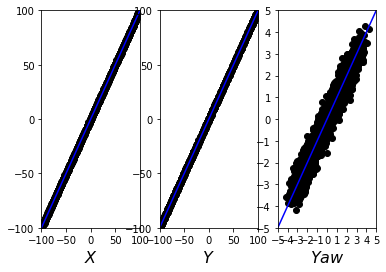

100%|██████████| 24/24 [00:00<00:00, 28.48it/s]

Epoch: 438 Train loss: -0.3197


Test loss: -0.2673


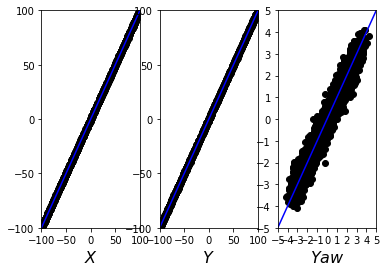

100%|██████████| 24/24 [00:00<00:00, 30.98it/s]

Epoch: 439 Train loss: -0.3221


Test loss: -0.2718


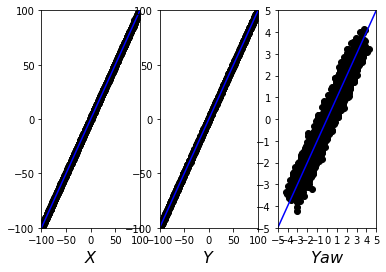

100%|██████████| 24/24 [00:01<00:00, 21.79it/s]

Epoch: 440 Train loss: -0.3229


Test loss: -0.2703


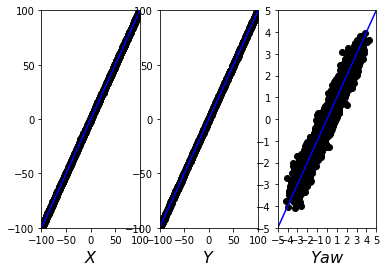

100%|██████████| 24/24 [00:01<00:00, 20.00it/s]

Epoch: 441 Train loss: -0.3229


Test loss: -0.2733


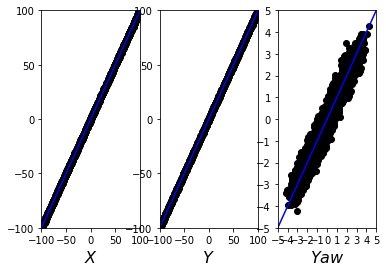

100%|██████████| 24/24 [00:01<00:00, 16.41it/s]

Epoch: 442 Train loss: -0.3238


Test loss: -0.2727


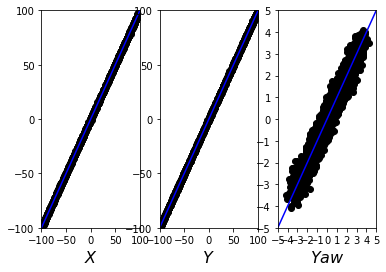

100%|██████████| 24/24 [00:01<00:00, 17.28it/s]

Epoch: 443 Train loss: -0.3244


Test loss: -0.2759


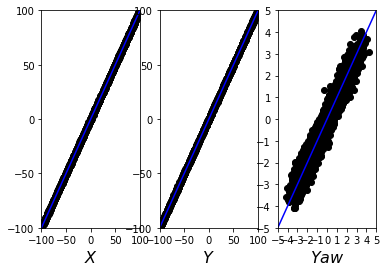

100%|██████████| 24/24 [00:01<00:00, 21.32it/s]

Epoch: 444 Train loss: -0.3260


Test loss: -0.2783


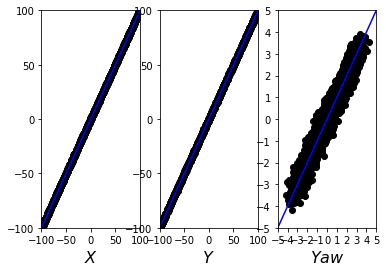

100%|██████████| 24/24 [00:01<00:00, 19.21it/s]

Epoch: 445 Train loss: -0.3271


Test loss: -0.2753


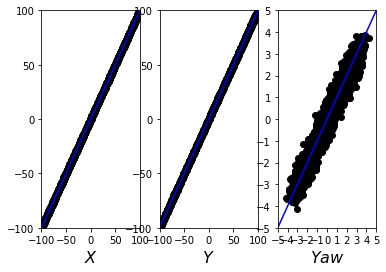

100%|██████████| 24/24 [00:00<00:00, 25.33it/s]

Epoch: 446 Train loss: -0.3314


Test loss: -0.2797


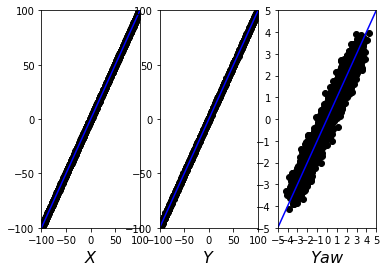

100%|██████████| 24/24 [00:01<00:00, 23.20it/s]

Epoch: 447 Train loss: -0.3301


Test loss: -0.2774


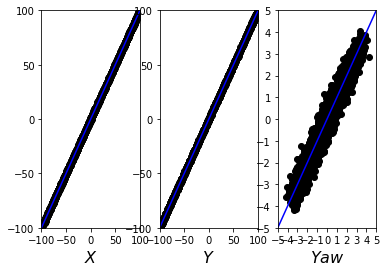

100%|██████████| 24/24 [00:01<00:00, 14.58it/s]

Epoch: 448 Train loss: -0.3304


Test loss: -0.2816


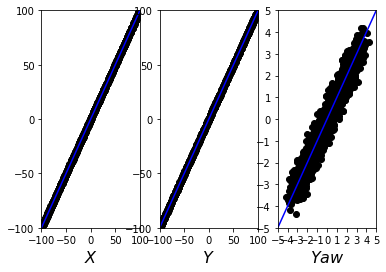

100%|██████████| 24/24 [00:00<00:00, 20.55it/s]


Epoch: 449 Train loss: -0.3303
Test loss: -0.2775


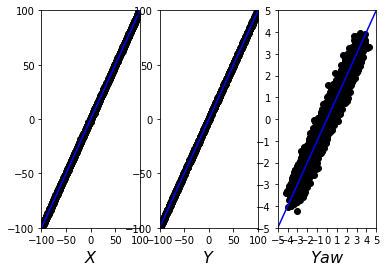

100%|██████████| 24/24 [00:01<00:00, 20.03it/s]

Epoch: 450 Train loss: -0.3317


Test loss: -0.2784


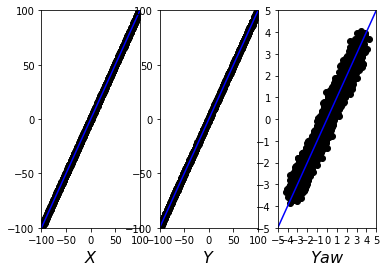

100%|██████████| 24/24 [00:01<00:00, 12.16it/s]

Epoch: 451 Train loss: -0.3333


Test loss: -0.2829


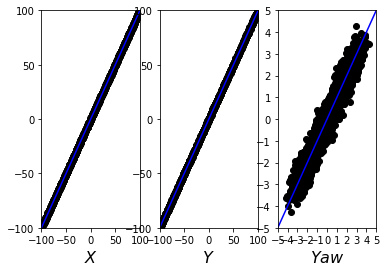

100%|██████████| 24/24 [00:01<00:00, 17.38it/s]

Epoch: 452 Train loss: -0.3300


Test loss: -0.2650


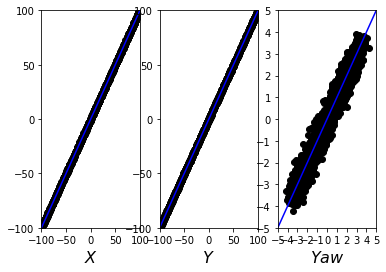

100%|██████████| 24/24 [00:01<00:00, 16.52it/s]

Epoch: 453 Train loss: -0.3298


Test loss: -0.2825


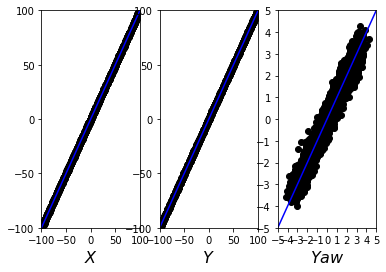

100%|██████████| 24/24 [00:01<00:00, 15.32it/s]

Epoch: 454 Train loss: -0.3336


Test loss: -0.2861


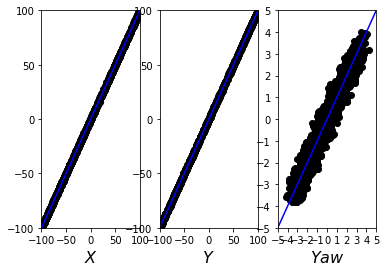

100%|██████████| 24/24 [00:01<00:00, 19.55it/s]

Epoch: 455 Train loss: -0.3339


Test loss: -0.2869


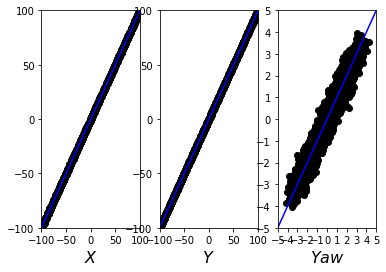

100%|██████████| 24/24 [00:01<00:00, 16.00it/s]

Epoch: 456 Train loss: -0.3327


Test loss: -0.2861


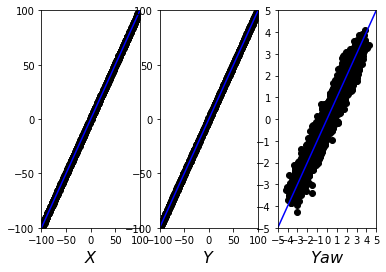

100%|██████████| 24/24 [00:00<00:00, 24.98it/s]

Epoch: 457 Train loss: -0.3376


Test loss: -0.2857


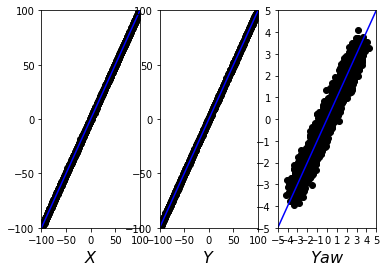

100%|██████████| 24/24 [00:02<00:00, 10.42it/s]

Epoch: 458 Train loss: -0.3363


Test loss: -0.2859


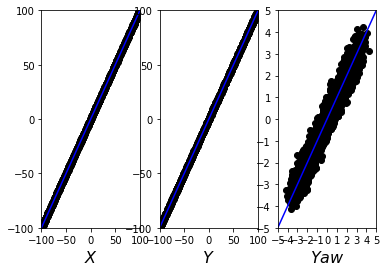

100%|██████████| 24/24 [00:00<00:00, 30.11it/s]

Epoch: 459 Train loss: -0.3370


Test loss: -0.2882


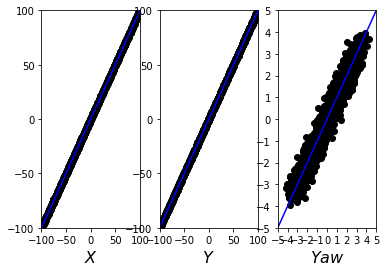

100%|██████████| 24/24 [00:01<00:00, 15.86it/s]

Epoch: 460 Train loss: -0.3346


Test loss: -0.2884


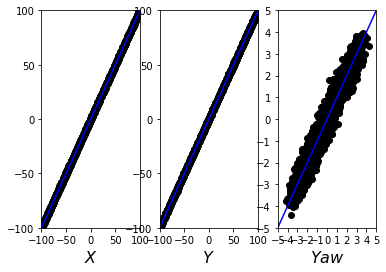

100%|██████████| 24/24 [00:01<00:00, 15.95it/s]

Epoch: 461 Train loss: -0.3355


Test loss: -0.2860


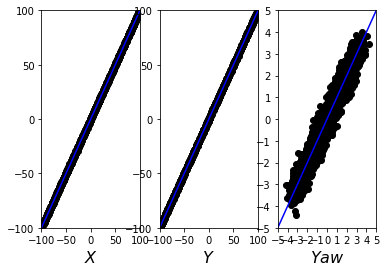

100%|██████████| 24/24 [00:01<00:00, 17.76it/s]

Epoch: 462 Train loss: -0.3301


Test loss: -0.2855


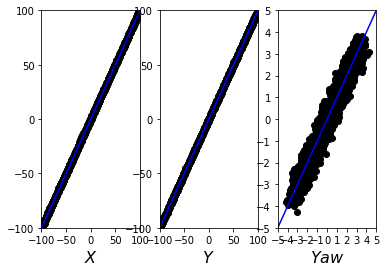

100%|██████████| 24/24 [00:01<00:00, 20.59it/s]

Epoch: 463 Train loss: -0.3365


Test loss: -0.2880


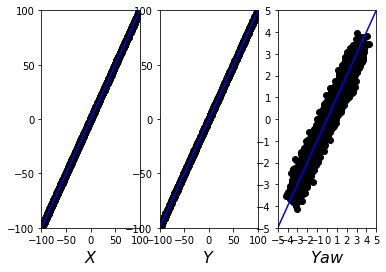

100%|██████████| 24/24 [00:01<00:00, 20.61it/s]

Epoch: 464 Train loss: -0.3402


Test loss: -0.2937


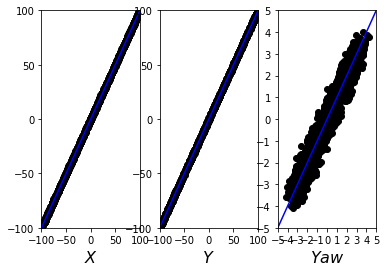

100%|██████████| 24/24 [00:00<00:00, 17.15it/s]

Epoch: 465 Train loss: -0.3421


Test loss: -0.2907


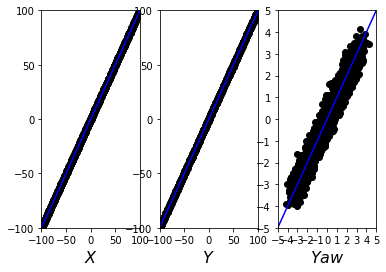

100%|██████████| 24/24 [00:01<00:00, 15.61it/s]

Epoch: 466 Train loss: -0.3454


Test loss: -0.2915


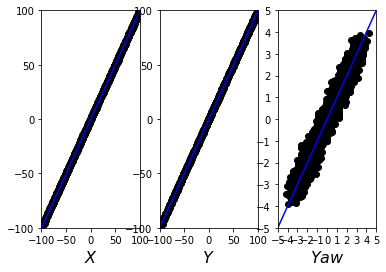

100%|██████████| 24/24 [00:01<00:00, 12.26it/s]

Epoch: 467 Train loss: -0.3401


Test loss: -0.2926


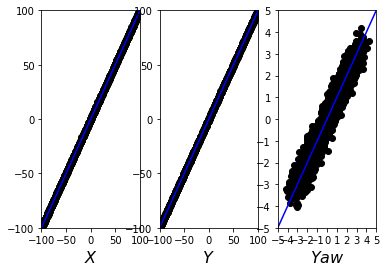

100%|██████████| 24/24 [00:00<00:00, 20.49it/s]

Epoch: 468 Train loss: -0.3435


Test loss: -0.2951


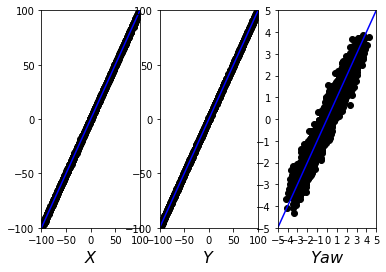

100%|██████████| 24/24 [00:01<00:00, 19.88it/s]

Epoch: 469 Train loss: -0.3429


Test loss: -0.2919


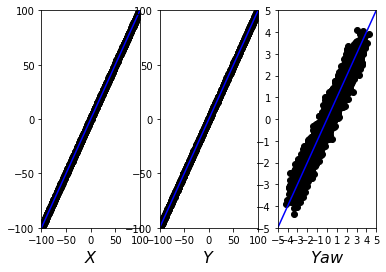

100%|██████████| 24/24 [00:00<00:00, 28.12it/s]


Epoch: 470 Train loss: -0.3442
Test loss: -0.2955


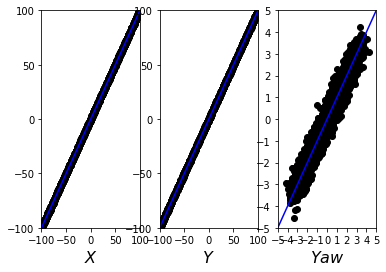

100%|██████████| 24/24 [00:00<00:00, 24.61it/s]

Epoch: 471 Train loss: -0.3425


Test loss: -0.2972


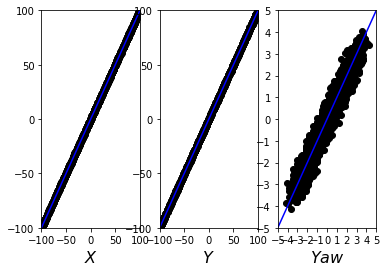

100%|██████████| 24/24 [00:01<00:00, 17.08it/s]

Epoch: 472 Train loss: -0.3436


Test loss: -0.2891


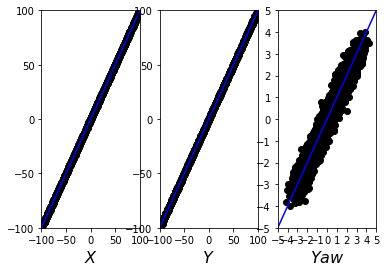

100%|██████████| 24/24 [00:01<00:00, 14.54it/s]

Epoch: 473 Train loss: -0.3427


Test loss: -0.2980


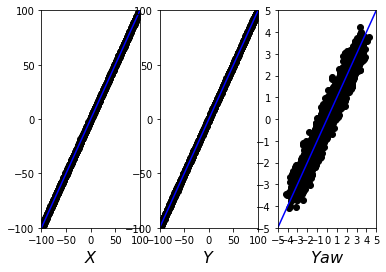

100%|██████████| 24/24 [00:00<00:00, 27.60it/s]

Epoch: 474 Train loss: -0.3474


Test loss: -0.2957


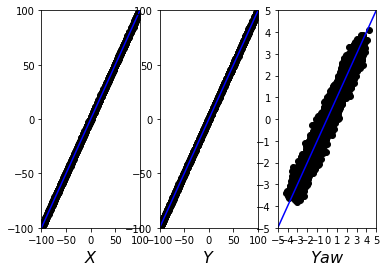

100%|██████████| 24/24 [00:01<00:00, 20.97it/s]

Epoch: 475 Train loss: -0.3428


Test loss: -0.2997


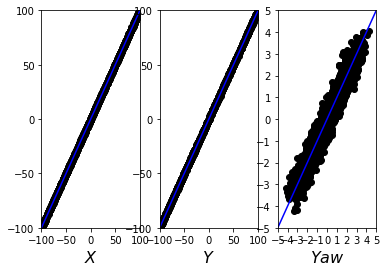

100%|██████████| 24/24 [00:00<00:00, 30.92it/s]

Epoch: 476 Train loss: -0.3483


Test loss: -0.3001


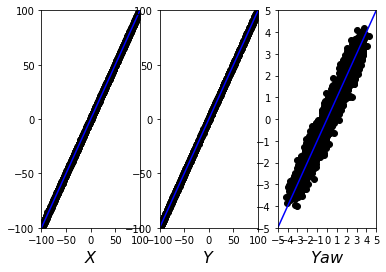

100%|██████████| 24/24 [00:01<00:00, 22.21it/s]

Epoch: 477 Train loss: -0.3437


Test loss: -0.2981


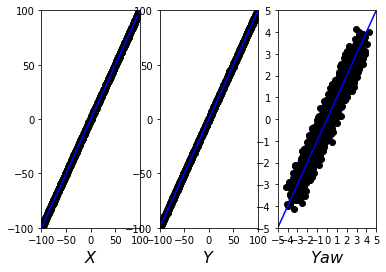

100%|██████████| 24/24 [00:00<00:00, 31.37it/s]

Epoch: 478 Train loss: -0.3477


Test loss: -0.2965


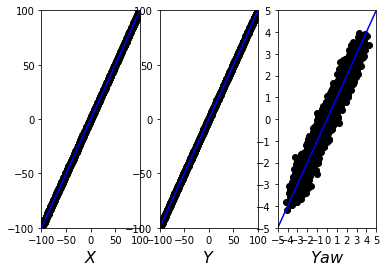

100%|██████████| 24/24 [00:00<00:00, 26.34it/s]

Epoch: 479 Train loss: -0.3493


Test loss: -0.3020


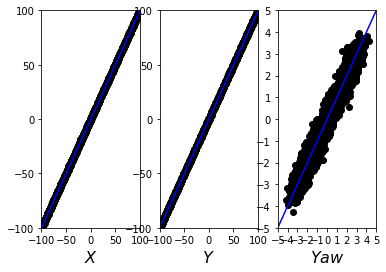

100%|██████████| 24/24 [00:01<00:00, 18.07it/s]

Epoch: 480 Train loss: -0.3481


Test loss: -0.2997


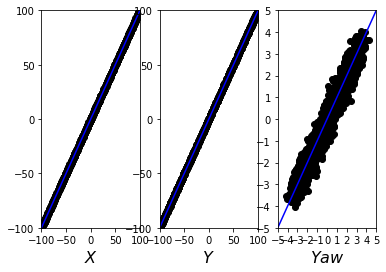

100%|██████████| 24/24 [00:01<00:00, 21.98it/s]

Epoch: 481 Train loss: -0.3490


Test loss: -0.2995


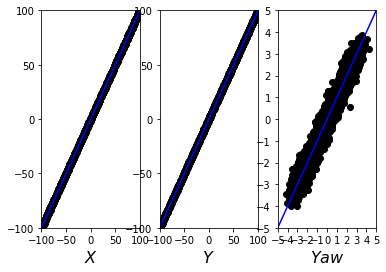

100%|██████████| 24/24 [00:00<00:00, 17.85it/s]

Epoch: 482 Train loss: -0.3528


Test loss: -0.3019


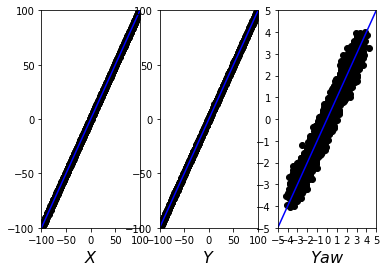

100%|██████████| 24/24 [00:00<00:00, 17.41it/s]

Epoch: 483 Train loss: -0.3514


Test loss: -0.3020


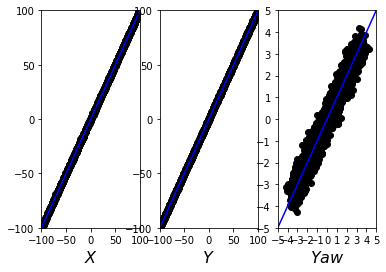

100%|██████████| 24/24 [00:00<00:00, 35.69it/s]

Epoch: 484 Train loss: -0.3500


Test loss: -0.3011


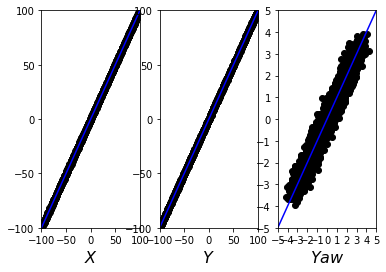

100%|██████████| 24/24 [00:00<00:00, 25.44it/s]

Epoch: 485 Train loss: -0.3533


Test loss: -0.3061


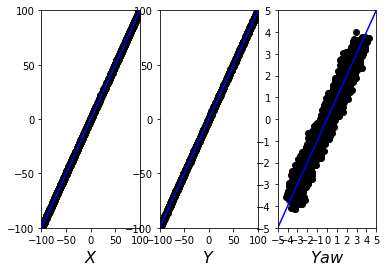

100%|██████████| 24/24 [00:00<00:00, 16.26it/s]


Epoch: 486 Train loss: -0.3542
Test loss: -0.3009


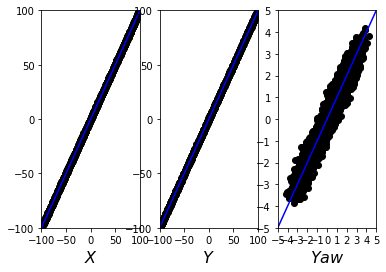

100%|██████████| 24/24 [00:01<00:00, 22.15it/s]

Epoch: 487 Train loss: -0.3523


Test loss: -0.3071


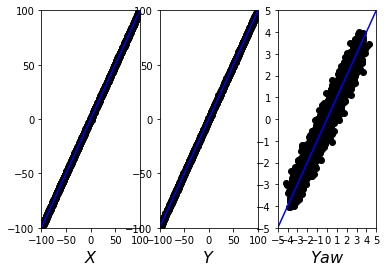

100%|██████████| 24/24 [00:00<00:00, 19.23it/s]

Epoch: 488 Train loss: -0.3510


Test loss: -0.3061


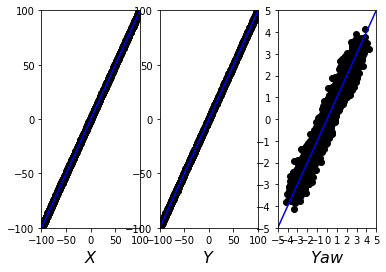

100%|██████████| 24/24 [00:01<00:00, 17.07it/s]


Epoch: 489 Train loss: -0.3544
Test loss: -0.3096


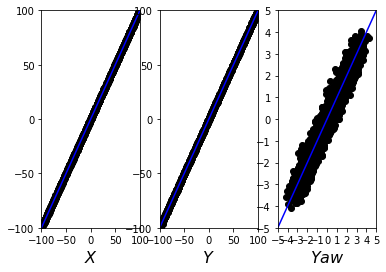

100%|██████████| 24/24 [00:00<00:00, 30.28it/s]

Epoch: 490 Train loss: -0.3570


Test loss: -0.3103


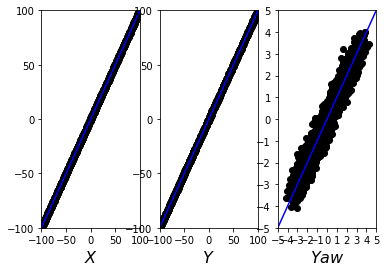

100%|██████████| 24/24 [00:01<00:00, 17.89it/s]

Epoch: 491 Train loss: -0.3597


Test loss: -0.3075


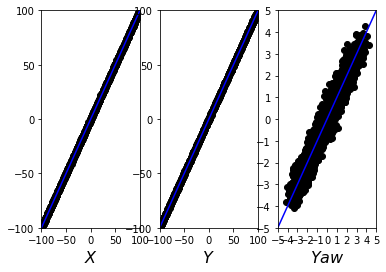

100%|██████████| 24/24 [00:00<00:00, 32.61it/s]

Epoch: 492 Train loss: -0.3579


Test loss: -0.3065


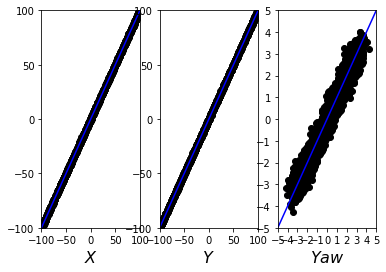

100%|██████████| 24/24 [00:00<00:00, 16.72it/s]

Epoch: 493 Train loss: -0.3574


Test loss: -0.3094


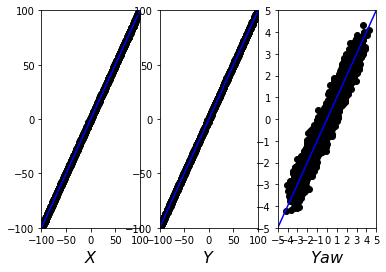

100%|██████████| 24/24 [00:00<00:00, 14.82it/s]


Epoch: 494 Train loss: -0.3586
Test loss: -0.3109


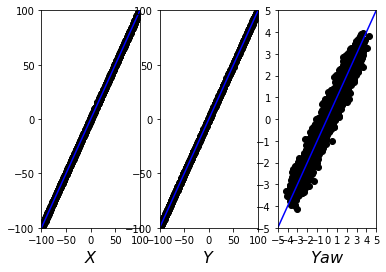

100%|██████████| 24/24 [00:00<00:00, 15.75it/s]


Epoch: 495 Train loss: -0.3611
Test loss: -0.3116


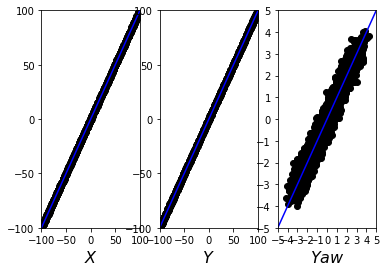

100%|██████████| 24/24 [00:01<00:00, 19.53it/s]

Epoch: 496 Train loss: -0.3550


Test loss: -0.3057


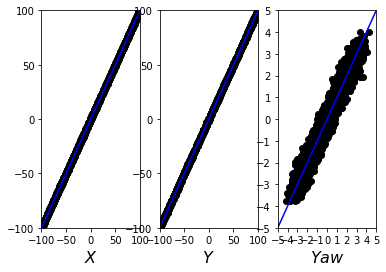

100%|██████████| 24/24 [00:00<00:00, 27.16it/s]

Epoch: 497 Train loss: -0.3581


Test loss: -0.3091


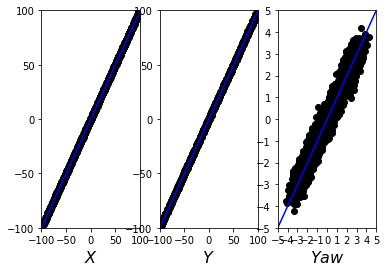

100%|██████████| 24/24 [00:01<00:00, 22.43it/s]

Epoch: 498 Train loss: -0.3565


Test loss: -0.3146


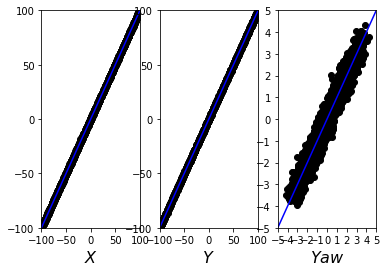

100%|██████████| 24/24 [00:01<00:00, 12.25it/s]

Epoch: 499 Train loss: -0.3591


Test loss: -0.3180


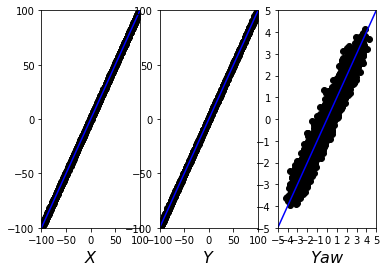

100%|██████████| 24/24 [00:00<00:00, 15.49it/s]

Epoch: 500 Train loss: -0.3615


Test loss: -0.3126


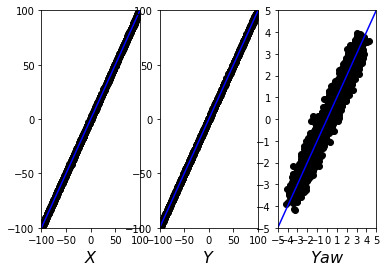

100%|██████████| 24/24 [00:00<00:00, 26.49it/s]

Epoch: 501 Train loss: -0.3579


Test loss: -0.3130


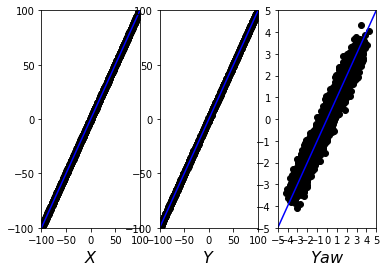

100%|██████████| 24/24 [00:00<00:00, 16.37it/s]


Epoch: 502 Train loss: -0.3616
Test loss: -0.3166


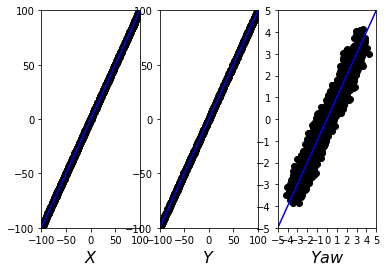

100%|██████████| 24/24 [00:00<00:00, 24.11it/s]

Epoch: 503 Train loss: -0.3623


Test loss: -0.3180


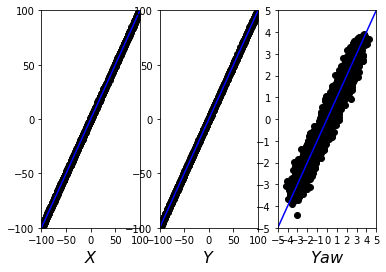

100%|██████████| 24/24 [00:00<00:00, 13.52it/s]


Epoch: 504 Train loss: -0.3638
Test loss: -0.3161


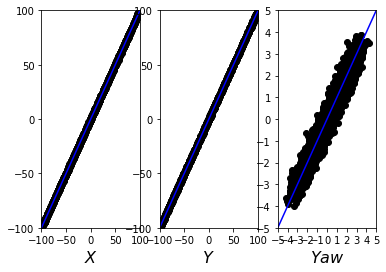

100%|██████████| 24/24 [00:00<00:00, 25.88it/s]

Epoch: 505 Train loss: -0.3657


Test loss: -0.3219


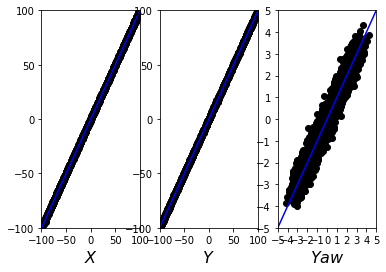

100%|██████████| 24/24 [00:01<00:00, 21.19it/s]

Epoch: 506 Train loss: -0.3654


Test loss: -0.3142


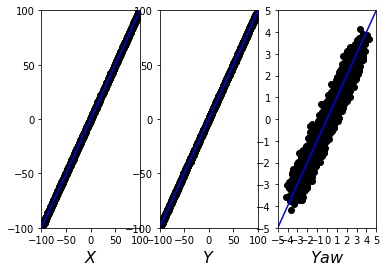

100%|██████████| 24/24 [00:00<00:00, 33.73it/s]

Epoch: 507 Train loss: -0.3657


Test loss: -0.3158


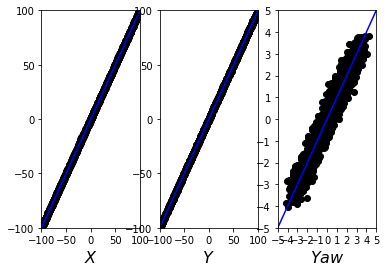

100%|██████████| 24/24 [00:01<00:00, 21.59it/s]

Epoch: 508 Train loss: -0.3624


Test loss: -0.3163


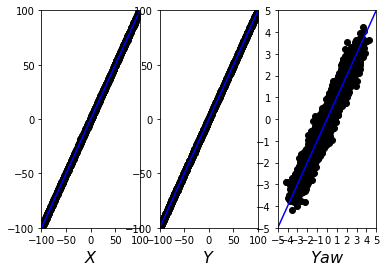

100%|██████████| 24/24 [00:01<00:00, 18.64it/s]

Epoch: 509 Train loss: -0.3607


Test loss: -0.3127


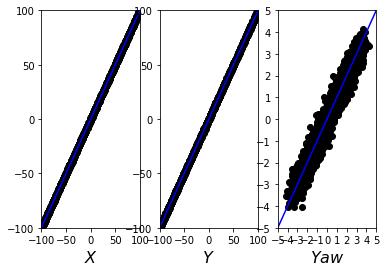

100%|██████████| 24/24 [00:00<00:00, 26.02it/s]

Epoch: 510 Train loss: -0.3632


Test loss: -0.3205


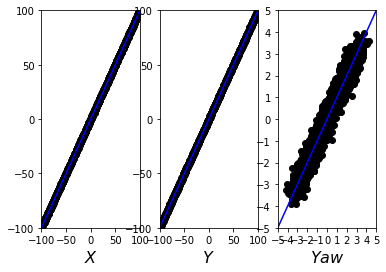

100%|██████████| 24/24 [00:00<00:00, 25.99it/s]

Epoch: 511 Train loss: -0.3647


Test loss: -0.3264


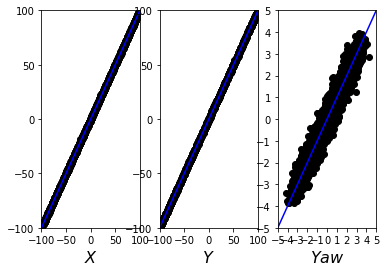

100%|██████████| 24/24 [00:03<00:00,  4.23it/s]

Epoch: 512 Train loss: -0.3668


Test loss: -0.3203


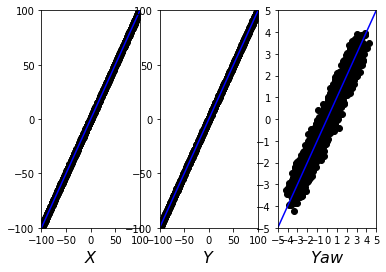

100%|██████████| 24/24 [00:00<00:00, 30.87it/s]

Epoch: 513 Train loss: -0.3673


Test loss: -0.3221


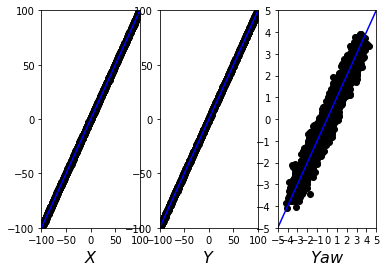

100%|██████████| 24/24 [00:00<00:00, 29.25it/s]

Epoch: 514 Train loss: -0.3693


Test loss: -0.3252


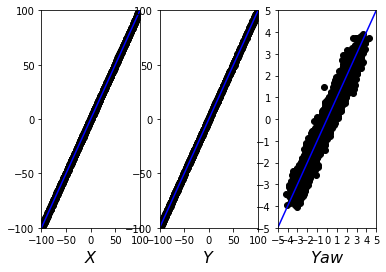

100%|██████████| 24/24 [00:00<00:00, 16.32it/s]

Epoch: 515 Train loss: -0.3713


Test loss: -0.3253


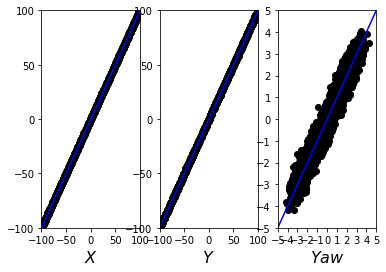

100%|██████████| 24/24 [00:00<00:00, 15.09it/s]

Epoch: 516 Train loss: -0.3728


Test loss: -0.3288


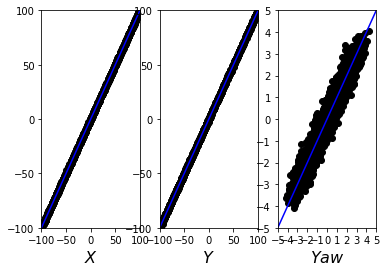

100%|██████████| 24/24 [00:00<00:00, 16.82it/s]

Epoch: 517 Train loss: -0.3704


Test loss: -0.3240


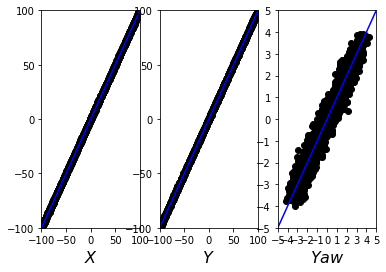

100%|██████████| 24/24 [00:00<00:00, 18.52it/s]


Epoch: 518 Train loss: -0.3710
Test loss: -0.3301


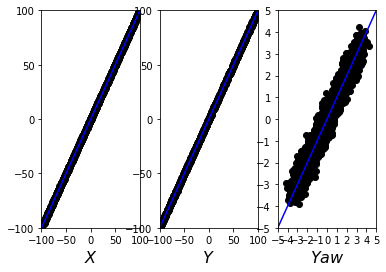

100%|██████████| 24/24 [00:00<00:00, 31.00it/s]

Epoch: 519 Train loss: -0.3675


Test loss: -0.3283


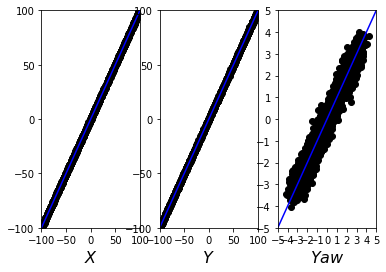

100%|██████████| 24/24 [00:00<00:00, 32.43it/s]

Epoch: 520 Train loss: -0.3740


Test loss: -0.3280


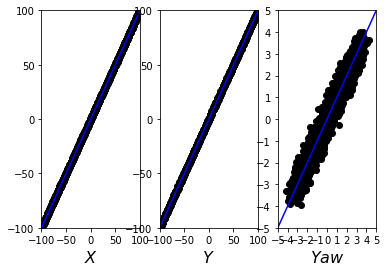

100%|██████████| 24/24 [00:00<00:00, 31.26it/s]

Epoch: 521 Train loss: -0.3724


Test loss: -0.3273


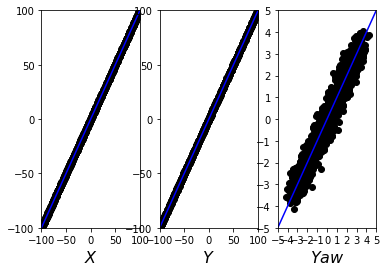

100%|██████████| 24/24 [00:00<00:00, 17.72it/s]

Epoch: 522 Train loss: -0.3743


Test loss: -0.3319


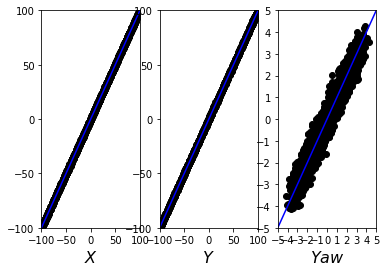

100%|██████████| 24/24 [00:01<00:00, 17.92it/s]

Epoch: 523 Train loss: -0.3754


Test loss: -0.3245


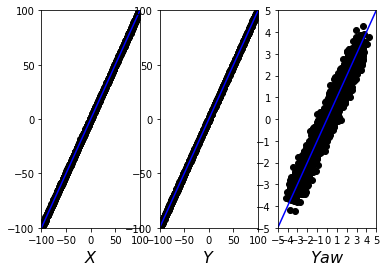

100%|██████████| 24/24 [00:01<00:00, 22.79it/s]

Epoch: 524 Train loss: -0.3714


Test loss: -0.3292


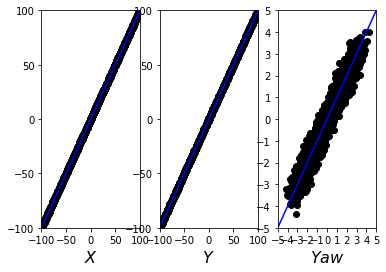

100%|██████████| 24/24 [00:00<00:00, 15.93it/s]

Epoch: 525 Train loss: -0.3730


Test loss: -0.3357


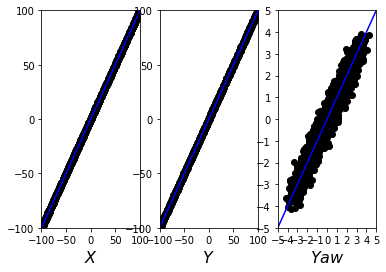

100%|██████████| 24/24 [00:00<00:00, 15.58it/s]

Epoch: 526 Train loss: -0.3750


Test loss: -0.3321


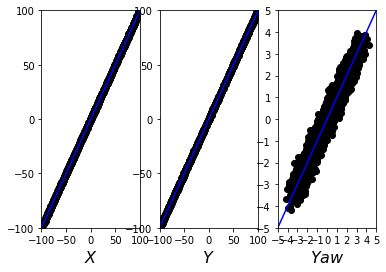

100%|██████████| 24/24 [00:00<00:00, 32.57it/s]


Epoch: 527 Train loss: -0.3753
Test loss: -0.3316


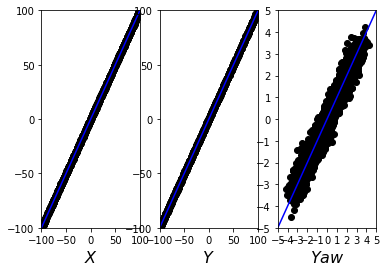

100%|██████████| 24/24 [00:01<00:00, 18.00it/s]

Epoch: 528 Train loss: -0.3773


Test loss: -0.3247


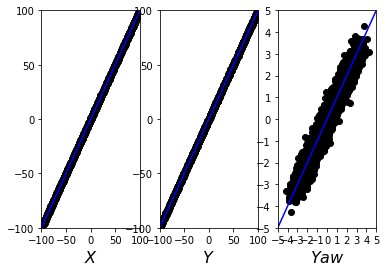

100%|██████████| 24/24 [00:00<00:00, 31.60it/s]

Epoch: 529 Train loss: -0.3756


Test loss: -0.3308


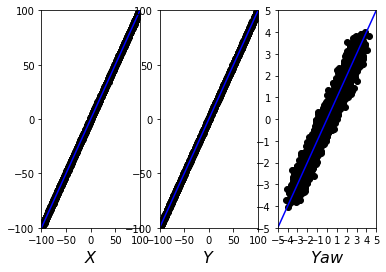

100%|██████████| 24/24 [00:01<00:00, 21.45it/s]

Epoch: 530 Train loss: -0.3782


Test loss: -0.3282


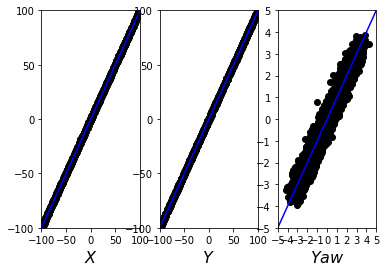

100%|██████████| 24/24 [00:01<00:00, 18.76it/s]

Epoch: 531 Train loss: -0.3759


Test loss: -0.3366


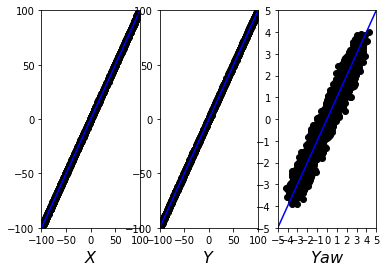

100%|██████████| 24/24 [00:00<00:00, 20.30it/s]

Epoch: 532 Train loss: -0.3782


Test loss: -0.3300


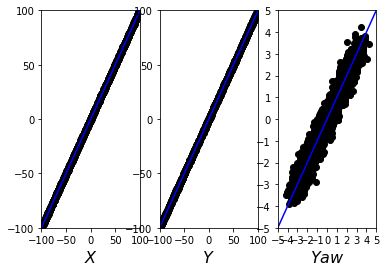

100%|██████████| 24/24 [00:00<00:00, 35.52it/s]

Epoch: 533 Train loss: -0.3806


Test loss: -0.3394


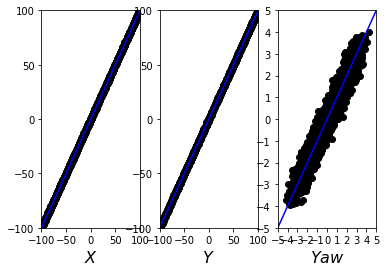

100%|██████████| 24/24 [00:00<00:00, 31.93it/s]

Epoch: 534 Train loss: -0.3795


Test loss: -0.3286


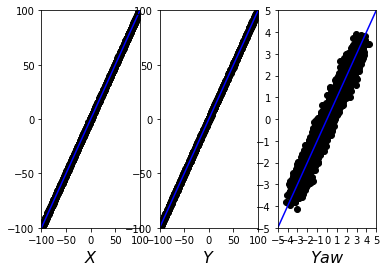

100%|██████████| 24/24 [00:01<00:00, 14.48it/s]

Epoch: 535 Train loss: -0.3798


Test loss: -0.3344


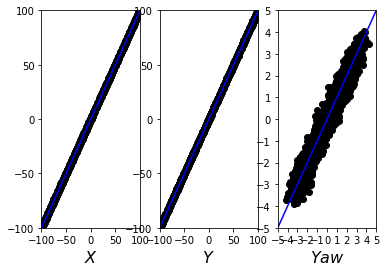

100%|██████████| 24/24 [00:01<00:00, 23.01it/s]

Epoch: 536 Train loss: -0.3817


Test loss: -0.3421


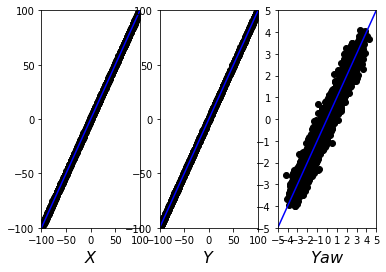

100%|██████████| 24/24 [00:01<00:00, 17.42it/s]

Epoch: 537 Train loss: -0.3838


Test loss: -0.3414


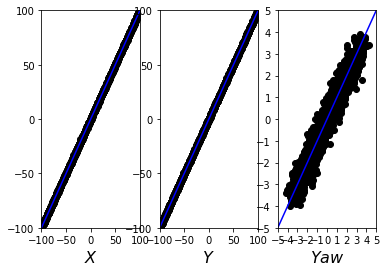

100%|██████████| 24/24 [00:01<00:00, 22.97it/s]

Epoch: 538 Train loss: -0.3821


Test loss: -0.3387


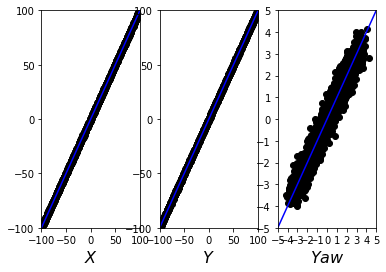

100%|██████████| 24/24 [00:00<00:00, 15.48it/s]

Epoch: 539 Train loss: -0.3839


Test loss: -0.3369


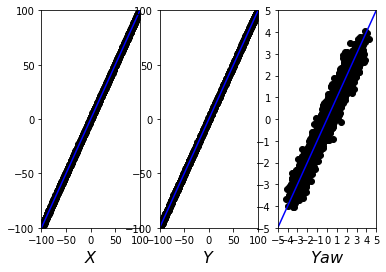

100%|██████████| 24/24 [00:00<00:00, 33.15it/s]

Epoch: 540 Train loss: -0.3800


Test loss: -0.3321


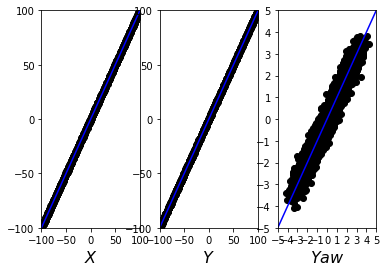

100%|██████████| 24/24 [00:00<00:00, 15.64it/s]

Epoch: 541 Train loss: -0.3804


Test loss: -0.3421


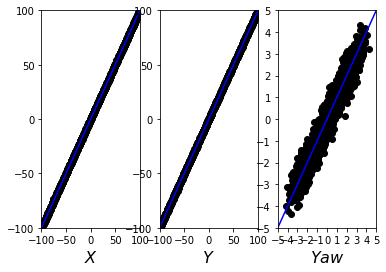

100%|██████████| 24/24 [00:01<00:00, 19.33it/s]


Epoch: 542 Train loss: -0.3851
Test loss: -0.3413


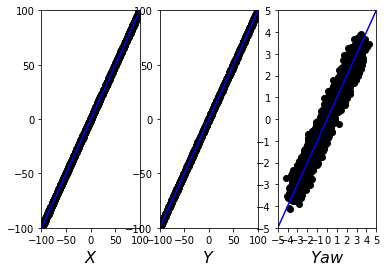

100%|██████████| 24/24 [00:00<00:00, 30.86it/s]

Epoch: 543 Train loss: -0.3840


Test loss: -0.3389


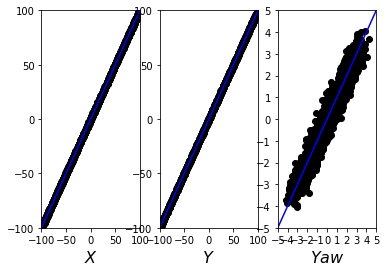

100%|██████████| 24/24 [00:00<00:00, 32.96it/s]

Epoch: 544 Train loss: -0.3853


Test loss: -0.3383


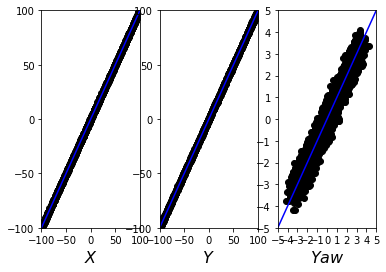

100%|██████████| 24/24 [00:00<00:00, 31.72it/s]

Epoch: 545 Train loss: -0.3843


Test loss: -0.3456


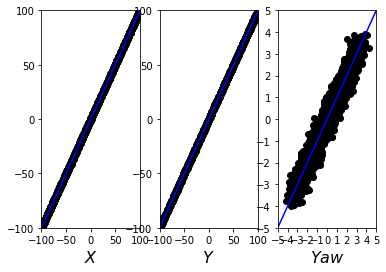

100%|██████████| 24/24 [00:01<00:00, 21.54it/s]

Epoch: 546 Train loss: -0.3863


Test loss: -0.3457


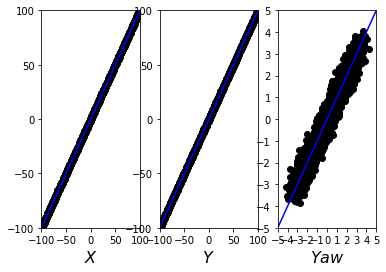

100%|██████████| 24/24 [00:00<00:00, 31.75it/s]

Epoch: 547 Train loss: -0.3892


Test loss: -0.3414


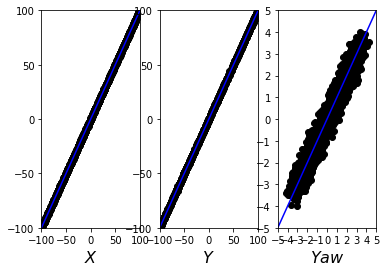

100%|██████████| 24/24 [00:01<00:00, 21.56it/s]

Epoch: 548 Train loss: -0.3911


Test loss: -0.3469


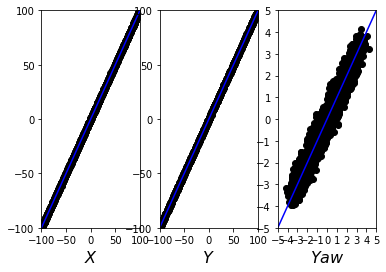

100%|██████████| 24/24 [00:00<00:00, 26.10it/s]

Epoch: 549 Train loss: -0.3913


Test loss: -0.3455


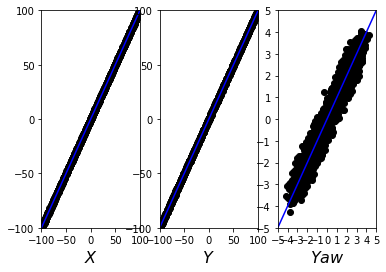

100%|██████████| 24/24 [00:00<00:00, 24.21it/s]

Epoch: 550 Train loss: -0.3887


Test loss: -0.3471


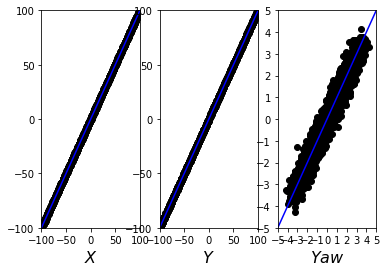

100%|██████████| 24/24 [00:02<00:00, 11.84it/s]

Epoch: 551 Train loss: -0.3889


Test loss: -0.3414


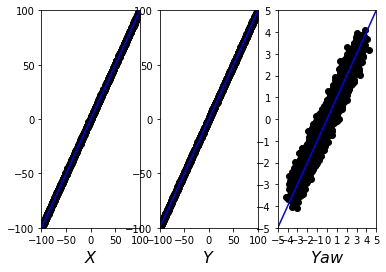

100%|██████████| 24/24 [00:01<00:00, 18.63it/s]

Epoch: 552 Train loss: -0.3895


Test loss: -0.3496


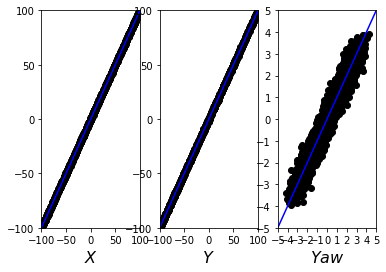

100%|██████████| 24/24 [00:00<00:00, 33.84it/s]

Epoch: 553 Train loss: -0.3880


Test loss: -0.3449


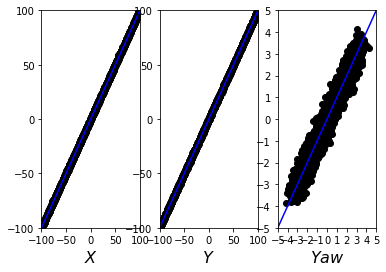

100%|██████████| 24/24 [00:00<00:00, 19.40it/s]

Epoch: 554 Train loss: -0.3905


Test loss: -0.3471


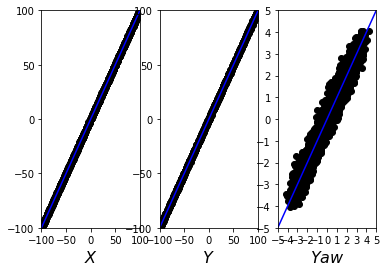

100%|██████████| 24/24 [00:00<00:00, 31.78it/s]

Epoch: 555 Train loss: -0.3927


Test loss: -0.3513


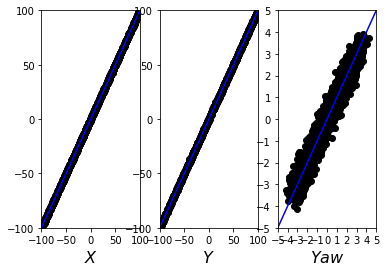

100%|██████████| 24/24 [00:01<00:00, 19.20it/s]

Epoch: 556 Train loss: -0.3923


Test loss: -0.3530


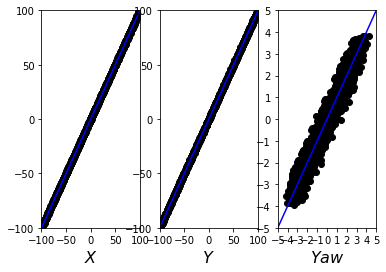

100%|██████████| 24/24 [00:01<00:00, 22.30it/s]

Epoch: 557 Train loss: -0.3925


Test loss: -0.3465


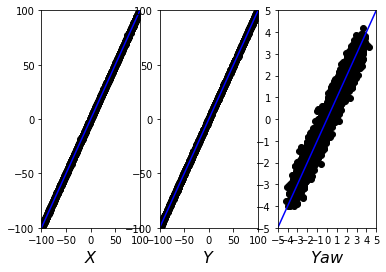

100%|██████████| 24/24 [00:00<00:00, 26.99it/s]

Epoch: 558 Train loss: -0.3894


Test loss: -0.3467


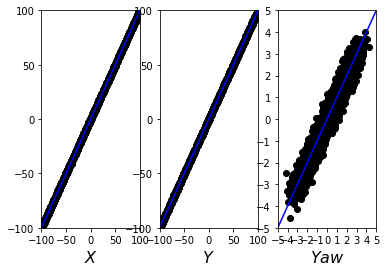

100%|██████████| 24/24 [00:01<00:00, 21.88it/s]

Epoch: 559 Train loss: -0.3925


Test loss: -0.3437


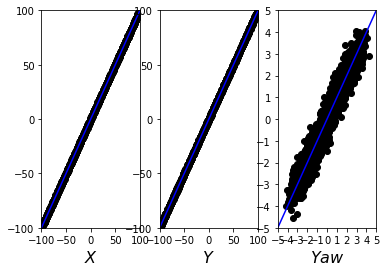

100%|██████████| 24/24 [00:00<00:00, 17.52it/s]

Epoch: 560 Train loss: -0.3897


Test loss: -0.3435


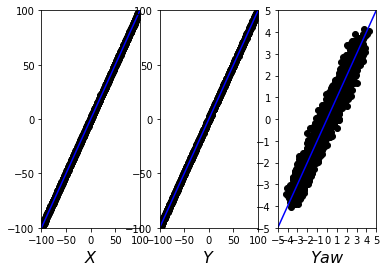

100%|██████████| 24/24 [00:00<00:00, 26.23it/s]

Epoch: 561 Train loss: -0.3856


Test loss: -0.3463


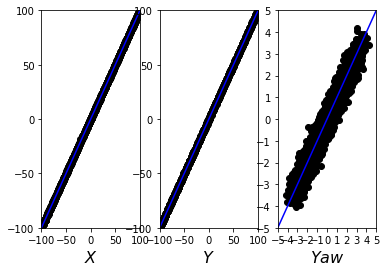

100%|██████████| 24/24 [00:00<00:00, 33.67it/s]

Epoch: 562 Train loss: -0.3938


Test loss: -0.3547


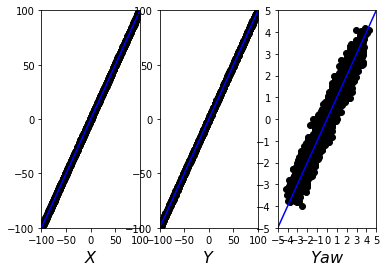

100%|██████████| 24/24 [00:01<00:00, 23.01it/s]

Epoch: 563 Train loss: -0.3909


Test loss: -0.3397


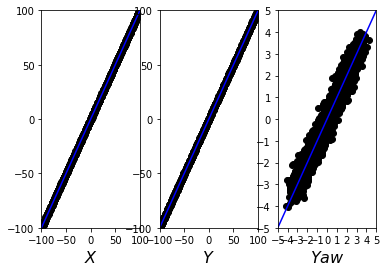

100%|██████████| 24/24 [00:00<00:00, 31.21it/s]

Epoch: 564 Train loss: -0.3902


Test loss: -0.3496


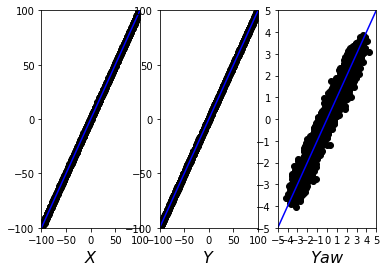

100%|██████████| 24/24 [00:00<00:00, 16.15it/s]


Epoch: 565 Train loss: -0.3941
Test loss: -0.3518


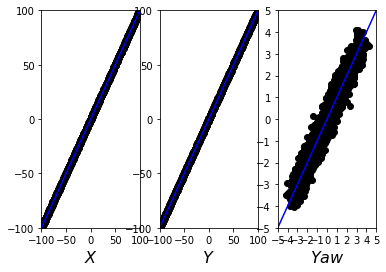

100%|██████████| 24/24 [00:01<00:00, 18.25it/s]

Epoch: 566 Train loss: -0.3935


Test loss: -0.3577


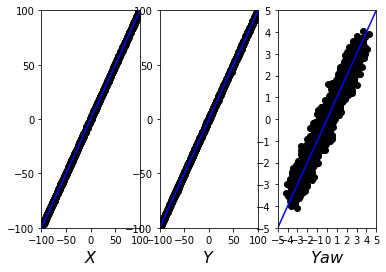

100%|██████████| 24/24 [00:00<00:00, 26.71it/s]

Epoch: 567 Train loss: -0.3933


Test loss: -0.3537


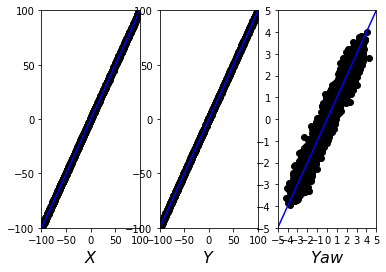

100%|██████████| 24/24 [00:00<00:00, 27.45it/s]

Epoch: 568 Train loss: -0.3972


Test loss: -0.3573


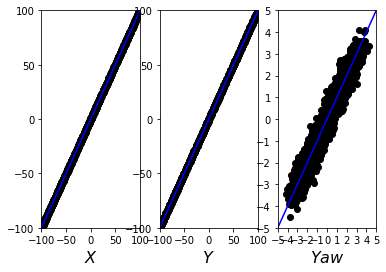

100%|██████████| 24/24 [00:01<00:00, 18.49it/s]

Epoch: 569 Train loss: -0.3957


Test loss: -0.3515


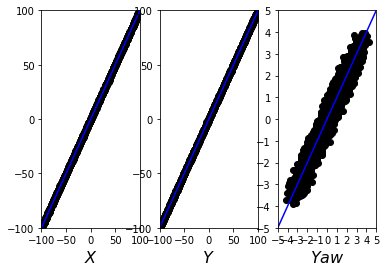

100%|██████████| 24/24 [00:00<00:00, 34.39it/s]

Epoch: 570 Train loss: -0.3955


Test loss: -0.3569


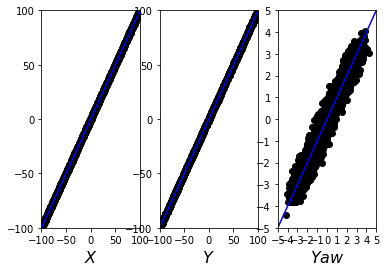

100%|██████████| 24/24 [00:00<00:00, 21.45it/s]

Epoch: 571 Train loss: -0.3979


Test loss: -0.3595


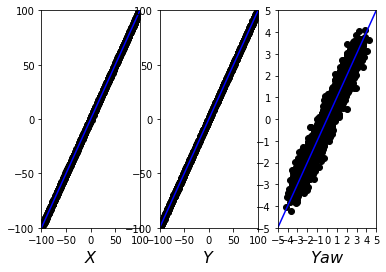

100%|██████████| 24/24 [00:00<00:00, 25.19it/s]

Epoch: 572 Train loss: -0.4016


Test loss: -0.3600


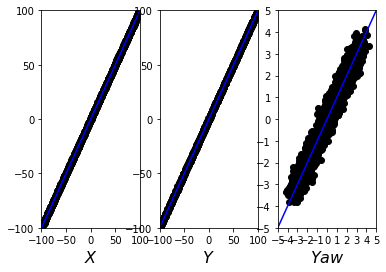

100%|██████████| 24/24 [00:01<00:00, 17.99it/s]

Epoch: 573 Train loss: -0.3983


Test loss: -0.3593


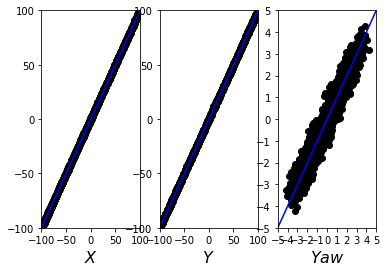

100%|██████████| 24/24 [00:00<00:00, 29.75it/s]

Epoch: 574 Train loss: -0.3993


Test loss: -0.3618


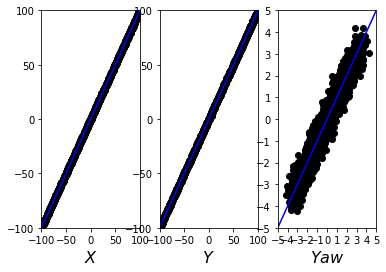

100%|██████████| 24/24 [00:00<00:00, 25.46it/s]

Epoch: 575 Train loss: -0.4014


Test loss: -0.3583


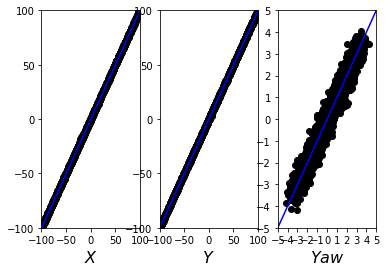

100%|██████████| 24/24 [00:01<00:00, 18.64it/s]

Epoch: 576 Train loss: -0.3988


Test loss: -0.3648


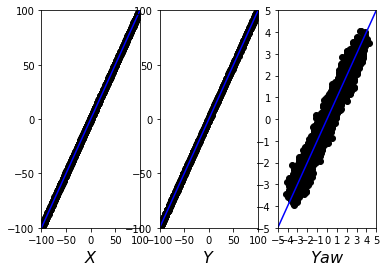

100%|██████████| 24/24 [00:01<00:00, 15.87it/s]


Epoch: 577 Train loss: -0.4016
Test loss: -0.3593


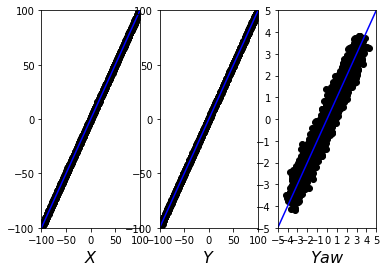

100%|██████████| 24/24 [00:00<00:00, 31.60it/s]

Epoch: 578 Train loss: -0.4013


Test loss: -0.3578


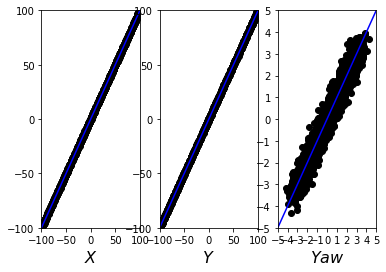

100%|██████████| 24/24 [00:00<00:00, 27.41it/s]

Epoch: 579 Train loss: -0.4005


Test loss: -0.3588


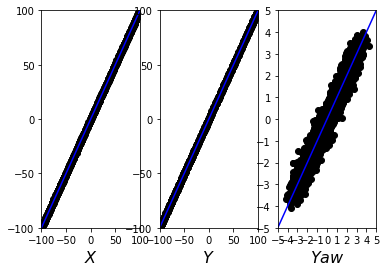

100%|██████████| 24/24 [00:01<00:00, 18.27it/s]

Epoch: 580 Train loss: -0.4015


Test loss: -0.3623


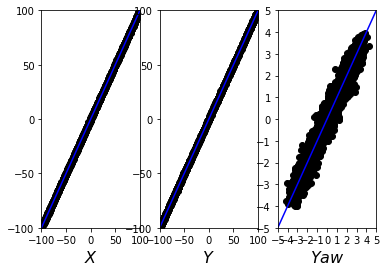

100%|██████████| 24/24 [00:00<00:00, 32.88it/s]

Epoch: 581 Train loss: -0.4040


Test loss: -0.3621


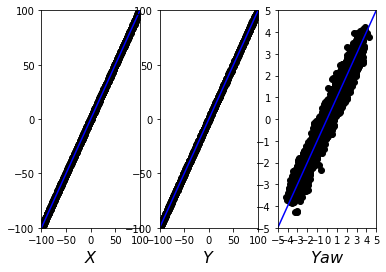

100%|██████████| 24/24 [00:00<00:00, 29.55it/s]

Epoch: 582 Train loss: -0.4049


Test loss: -0.3674


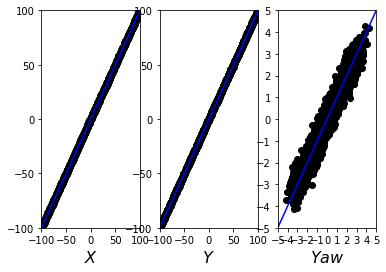

100%|██████████| 24/24 [00:00<00:00, 24.73it/s]

Epoch: 583 Train loss: -0.4044


Test loss: -0.3541


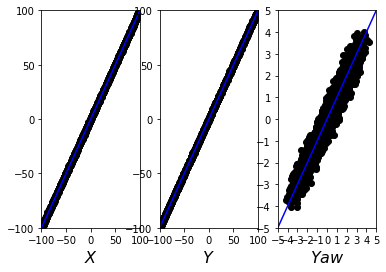

100%|██████████| 24/24 [00:01<00:00, 18.52it/s]

Epoch: 584 Train loss: -0.3997


Test loss: -0.3664


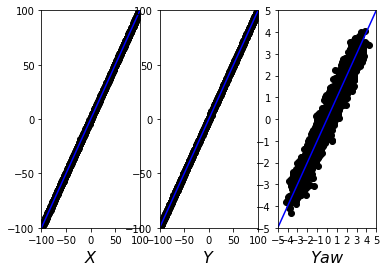

100%|██████████| 24/24 [00:00<00:00, 25.68it/s]

Epoch: 585 Train loss: -0.4031


Test loss: -0.3616


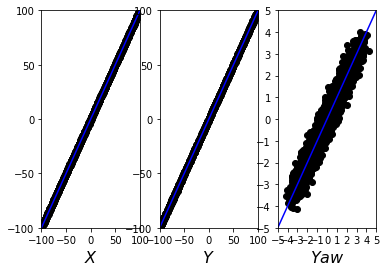

100%|██████████| 24/24 [00:01<00:00, 22.02it/s]

Epoch: 586 Train loss: -0.4023


Test loss: -0.3652


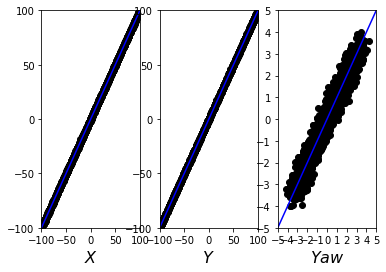

100%|██████████| 24/24 [00:00<00:00, 31.69it/s]

Epoch: 587 Train loss: -0.4071


Test loss: -0.3626


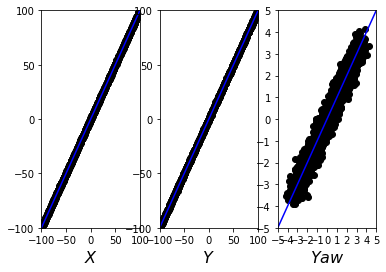

100%|██████████| 24/24 [00:01<00:00, 19.93it/s]

Epoch: 588 Train loss: -0.4080


Test loss: -0.3659


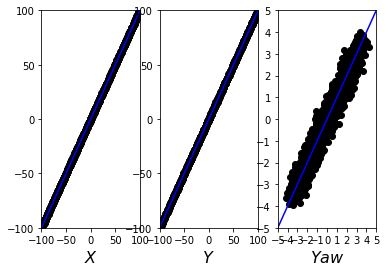

100%|██████████| 24/24 [00:00<00:00, 32.61it/s]

Epoch: 589 Train loss: -0.4038


Test loss: -0.3659


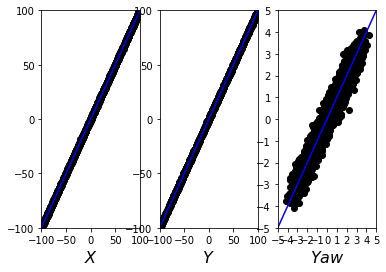

100%|██████████| 24/24 [00:00<00:00, 27.15it/s]


Epoch: 590 Train loss: -0.4059
Test loss: -0.3612


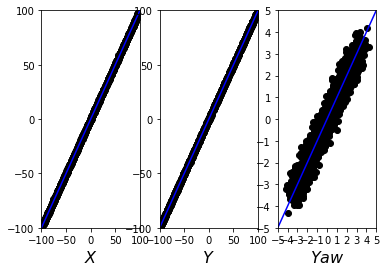

100%|██████████| 24/24 [00:00<00:00, 18.31it/s]


Epoch: 591 Train loss: -0.4048
Test loss: -0.3588


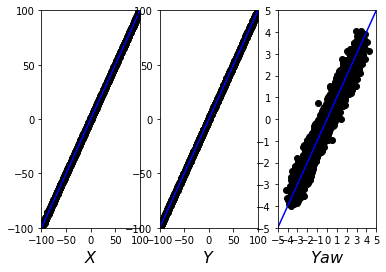

100%|██████████| 24/24 [00:00<00:00, 29.48it/s]

Epoch: 592 Train loss: -0.4049


Test loss: -0.3657


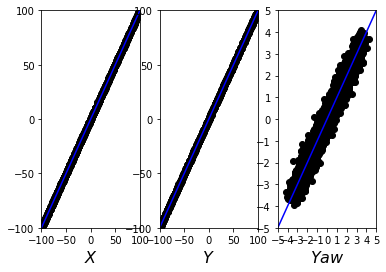

100%|██████████| 24/24 [00:00<00:00, 25.53it/s]

Epoch: 593 Train loss: -0.4058


Test loss: -0.3661


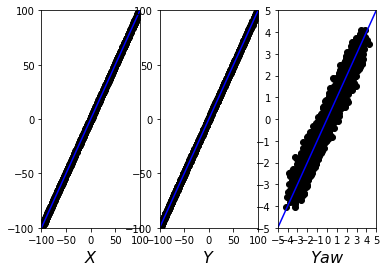

100%|██████████| 24/24 [00:00<00:00, 33.94it/s]

Epoch: 594 Train loss: -0.4052


Test loss: -0.3685


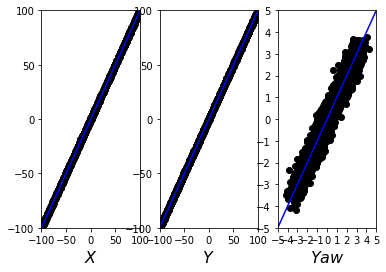

100%|██████████| 24/24 [00:01<00:00, 15.37it/s]

Epoch: 595 Train loss: -0.4089


Test loss: -0.3730


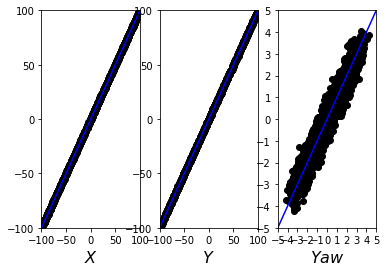

100%|██████████| 24/24 [00:00<00:00, 26.27it/s]

Epoch: 596 Train loss: -0.4112


Test loss: -0.3703


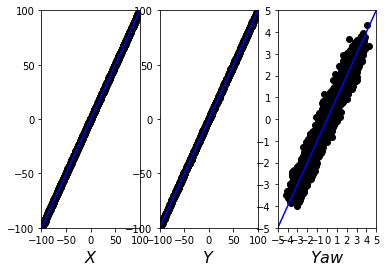

100%|██████████| 24/24 [00:00<00:00, 32.61it/s]

Epoch: 597 Train loss: -0.4092


Test loss: -0.3626


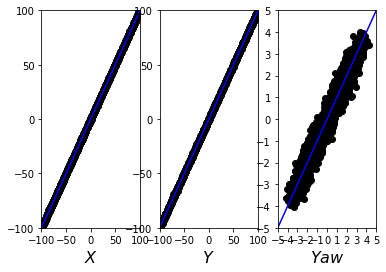

100%|██████████| 24/24 [00:00<00:00, 17.24it/s]

Epoch: 598 Train loss: -0.4078


Test loss: -0.3671


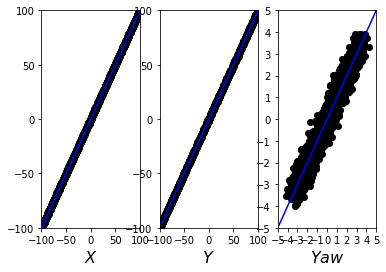

100%|██████████| 24/24 [00:01<00:00, 19.74it/s]

Epoch: 599 Train loss: -0.4093


Test loss: -0.3737


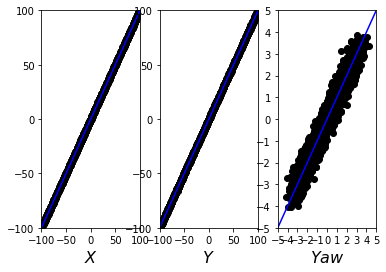

100%|██████████| 24/24 [00:01<00:00, 17.05it/s]

Epoch: 600 Train loss: -0.4102


Test loss: -0.3753


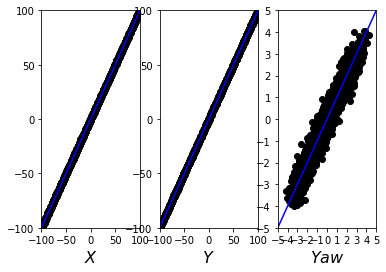

In [67]:
writer = SummaryWriter()

plot_number = 1

s_sample = 0.5 * torch.randn(64, s_dim).to(device)
c_sample = torch.eye(10)[[plot_number]*64].to(device)

# _o, _c = iter(test_loader).next()
# _o = _o.to(device)
# _c = torch.eye(10)[_c].to(device)
#二乗平均誤差保存用
diff = {"x":[],"y":[]}

for epoch in range(1, epochs + 1):
    train_loss = train(epoch)
    test_loss = test(epoch)
    
#     recon = plot_reconstrunction(_o[:8], _c[:8])
#     sample = plot_image_from_latent(s_sample, c_sample)
#     recon_changing_c = plot_reconstrunction_changing_c(_o[:8], _c[:8])

    writer.add_scalar('train_loss', train_loss.item(), epoch)
    writer.add_scalar('test_loss', test_loss.item(), epoch)
    
    #for plot
    history["train_loss"].append(train_loss.item())
    history["test_loss"].append(test_loss.item())

    _s = q.sample({"o": data["o"].to(device), "c": data["c"].to(device),"st1":data["st1"].to(device),"u":data["u"]}, return_all=False)
    ax=plt.subplot(1, 3, 1)
    tru = plt.scatter(data["s"][:,0],_s["s"][:,0],color='black',edgecolors="black")
    plt.xticks(np.arange(min_data, max_data+grid_inter, grid_inter))
    plt.yticks(np.arange(min_data, max_data+grid_inter, grid_inter))
    ax.set_xlim([min_data,max_data])
    ax.set_ylim([min_data,max_data])
    x = np.arange(-100,100,0.1)
    y=x
    ax.plot(x, y, color="b")
    plt.xlabel('$X$', fontsize=16)
    
    ay = plt.subplot(1, 3, 2)
    sam = plt.scatter(data["s"][:,1],_s["s"][:,1],color='black',edgecolors="black")
    plt.xticks(np.arange(min_data, max_data+grid_inter, grid_inter))
    plt.yticks(np.arange(min_data, max_data+grid_inter, grid_inter))
    ay.set_xlim([min_data,max_data])
    ay.set_ylim([min_data,max_data])
    ay.plot(x, y, color="b")
    plt.xlabel('$Y$', fontsize=16)
    ims.append([tru]+[sam])
    
    ay = plt.subplot(1, 3, 3)
    sam = plt.scatter(data["s"][:,2],_s["s"][:,2],color='black',edgecolors="black")
    plt.xticks(np.arange(-5, 5+1, 1))
    plt.yticks(np.arange(-5, 5+1, 1))
    ay.set_xlim([-5,5])
    ay.set_ylim([-5,5])
    ay.plot(x, y, color="b")
    plt.xlabel('$Yaw$', fontsize=16)
    
#     #平均二乗誤差
#     lossx=0
#     lossy=0
#     _ss=_s["s"]
#     for i in range(0,test_sample_num-1,1):
#         lossx+=np.square(data["s"][i][0].numpy()-_ss[i][0].numpy())
#         lossy+=np.square(data["s"][i][1].numpy()-_ss[i][1].numpy())
    
    plt.show()
    

#     writer.add_image('Image_from_latent', sample, epoch)
#     writer.add_image('Image_reconstrunction', recon, epoch)
#     writer.add_image('Image_reconstrunction_change_c', recon_changing_c, epoch)
    
writer.close()

In [68]:
# #animation
# def iinit():    
#     return (ims[0])
# # animation function: this is called sequentially
# def animate(i):
#   return (ims[i])

# #plot gif
# fig = plt.figure()
# plt.legend(['True','Result'], loc='upper left', fontsize=16)
# ani = animation.ArtistAnimation(fig, ims)
# anim = animation.FuncAnimation(fig, animate, init_func=iinit, frames=epochs, interval=100, blit=True)
# plt.rcParams['animation.ffmpeg_path'] = '/usr/bin/ffmpeg' # For google colab
# HTML(ani.to_html5_video())
# rc('animation', html='jshtml')
# anim

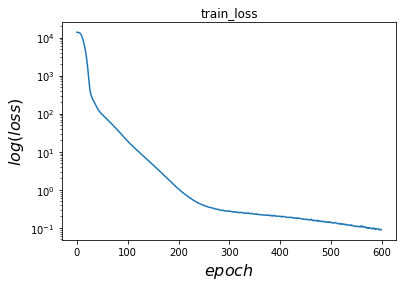

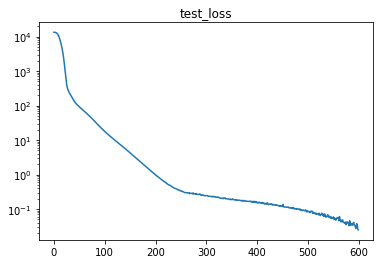

In [74]:
#plot loss  #対数表示
plt.ylabel('$log(loss)$', fontsize=16)
plt.xlabel('$epoch$', fontsize=16)
ay=plt.gca()
plt.title("train_loss")
ay.set_yscale('log')
plt.plot(range(epochs), [i+0.5 for i in history["train_loss"]])
plt.show()
ay=plt.gca()
ay.set_yscale('log')
plt.title("test_loss")
plt.plot(range(epochs), [i+0.4 for i in history["test_loss"]])
plt.show()

In [80]:
#CSVファイルに誤差を出力
import csv
test_sample_num = 3000
test_sigma=torch.Tensor([0.5,0.5,0.3]*test_sample_num).view(test_sample_num,3)

with open('non_linear_plus.csv','w') as f:
    #動作utごとに出力(角度rのみを変えている)
    for r in [-np.pi/6.0, -np.pi/12.0, 0.0, np.pi/12.0, np.pi/6.0]:
        data=unique_datagenerator(test_sample_num,test_sigma,1.0,5.0,r)
        #正規化
        data["u"][:,0]=normalize(data["u"][:,0],1.0,5.0)
        data["u"][:,1]=normalize(data["u"][:,1],-np.pi/6.0,np.pi/6.0)
        full_normalize(data["st1"])
        full_normalize(data["o"])
        _s = q.sample({"o": data["o"].to(device), "c": data["c"].to(device),"st1":data["st1"].to(device),"u":data["u"]}, return_all=False)
        lossx=0
        lossy=0
        lossw=0
        _ss=_s["s"]
        print(data["s"])
        print(_s["s"])
        for i in range(0,test_sample_num-1,1):
            lossx+=np.square(data["s"][i][0].numpy()-_ss[i][0].numpy())
            lossy+=np.square(data["s"][i][1].numpy()-_ss[i][1].numpy())
            lossw+=np.square(data["s"][i][2].numpy()-_ss[i][2].numpy())
#             print("s"+str(data["s"][i][0])+"ss"+str(_ss[i][0]))
#             print(lossx/i+1)
        print(lossx/test_sample_num)
        print(lossy/test_sample_num)
        print(lossw/test_sample_num)
        writer = csv.writer(f, lineterminator='\n')
        writer.writerows([[ lossx/test_sample_num,lossy/test_sample_num,lossw/test_sample_num ]])

tensor([[ 37.2805, -66.7048,   1.5791],
        [ 14.4878,  89.6534,   2.4577],
        [-74.3633, -40.0224,   0.9235],
        ...,
        [-49.2960, -68.8389,   0.8303],
        [ 62.9899,  44.5730,  -2.3084],
        [-74.3546,  36.2778,  -2.6802]])
tensor([[ 38.6538, -65.6638,   0.8355],
        [ 14.0189,  90.8525,   2.4315],
        [-73.1467, -38.2656,   1.2023],
        ...,
        [-50.1390, -67.5359,   0.1817],
        [ 63.5714,  44.7311,  -2.8352],
        [-74.6104,  36.4930,  -2.1424]])
0.431432167982132
0.850820563086676
0.16618676097233384
tensor([[ 2.5553e+01, -2.6450e+01, -2.1818e+00],
        [-4.1532e-02, -2.3261e+01,  2.5093e+00],
        [-8.5416e+00,  9.3632e+01, -1.9735e+00],
        ...,
        [-6.3225e+01,  2.4136e+01,  2.6744e+00],
        [-3.0877e+01, -5.1282e+00, -2.3485e+00],
        [-6.1655e+01,  8.9176e+01, -3.4313e+00]])
tensor([[ 2.5437e+01, -2.7209e+01, -1.8923e+00],
        [-4.8257e-03, -2.3728e+01,  2.3163e+00],
        [-7.8771e+00,  9.4325e

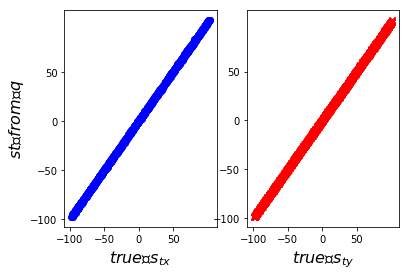

0.49448807488831653
0.39903969213532037


In [71]:
#u_tでの挙動を見るためのテストの描画
plt.subplot(1, 2, 1)
tru = plt.scatter(data["s"][:,0],_s["s"][:,0],color='blue',marker='o',edgecolors="blue")
plt.xticks(np.arange(min_data,max_data,grid_inter))
plt.yticks(np.arange(min_data,max_data,grid_inter))
plt.ylabel('$st　from　q$', fontsize=16)
plt.xlabel('$true　s_{tx}$', fontsize=16)

plt.subplot(1, 2, 2)
sam = plt.scatter(data["s"][:,1],_s["s"][:,1],color='red',marker='x',edgecolors="red")
plt.xticks(np.arange(min_data,max_data,grid_inter))
plt.yticks(np.arange(min_data,max_data,grid_inter))
plt.xlabel('$true　s_{ty}$', fontsize=16)
ims.append([tru]+[sam])
plt.grid(which='minor',color='black',linestyle='-')
plt.show()

lossx=0
lossy=0
_ss=_s["s"]
for i in range(0,sample_num-1,1):
    lossx+=np.square(data["s"][i][0].numpy()-_ss[i][0].numpy())
    lossy+=np.square(data["s"][i][1].numpy()-_ss[i][1].numpy())
print(lossx/sample_num)
print(lossy/sample_num)

In [72]:
print(data["s"][:,0])
print(_ss[:,0])

tensor([-86.6259, 102.3169,  99.1014,  ..., -73.8273,  73.3755,  51.7384])
tensor([-86.9403, 102.1336, 100.3311,  ..., -74.4168,  73.0677,  52.3048])


In [73]:
print(_s)
print(_o["o"])
print(data["s"])

# plt.scatter(sample_o[:,0],sample_o[:,1],color='blue',marker='o',edgecolors="blue")
plt.scatter(data["o"][:,0],data["o"][:,1],color='blue',marker='x',edgecolors="red")
plt.scatter(_o["o"][:,0],_o["o"][:,1],color='red',marker='x',edgecolors="red")
plt.xlabel('$sx$', fontsize=16)
plt.ylabel('$sy$', fontsize=16)
plt.title("Simulated dataset")
plt.show()

{'s': tensor([[-86.9403,  91.5530,  -0.1519],
        [102.1336, -33.5809,   1.1475],
        [100.3311, -52.2724,  -0.4028],
        ...,
        [-74.4168,  45.9201,  -0.9985],
        [ 73.0677,  24.0109,   2.8626],
        [ 52.3048,  39.3594,   1.9268]])}


NameError: name '_o' is not defined

In [ ]:
loss=0
_ss=_s["s"]
for i in range(0,sample_num-1,1):
    loss+=np.square(data["s"][i].numpy()-_ss[i])
print(loss/sample_num)

In [ ]:
max_data=10#max_data
min_data=-4#min_data
grid_inter=1

plot_data=test_data

_s = q.sample({"o": plot_data["o"].to(device), "c": plot_data["c"].to(device)}, return_all=False)

#show sample points
plt.scatter(plot_data["s"][:,0],plot_data["s"][:,1],color='blue',marker='o',edgecolors="blue")
plt.scatter(_s["s"][:,0],_s["s"][:,1],color='red',marker='x',edgecolors="red")
plt.xlabel('$sx$', fontsize=16)
plt.ylabel('$sy$', fontsize=16)
plt.title("Simulated dataset")
plt.show()

plt.subplot(1, 2, 1)
plt.scatter(plot_data["s"][:,0],plot_data["s"][:,1],color='blue',marker='o',edgecolors="blue")
plt.xticks(np.arange(min_data-1,max_data+1,grid_inter))
plt.subplot(1,2,2)
plt.scatter(_s["s"][:,0],_s["s"][:,1],color='red',marker='x',edgecolors="red")
plt.xticks(np.arange(min_data-1,max_data+1,grid_inter))
plt.show()
